In [126]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score, roc_curve
import numpy as np
import seaborn as sns
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel, RFE
import shap
from sklearn.metrics import precision_recall_curve, average_precision_score





#DATA CLEANING

In [98]:
df = pd.read_csv('hotel_booking.csv')
pd.set_option('display.max_columns', None)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498


In [99]:
df.dtypes

,0
hotel,object
is_canceled,int64
lead_time,int64
arrival_date_year,int64
arrival_date_month,object
arrival_date_week_number,int64
arrival_date_day_of_month,int64
stays_in_weekend_nights,int64
stays_in_week_nights,int64
adults,int64


In [100]:
df2 = df.drop(columns=['name', 'phone-number', 'credit_card'])

In [101]:
numeric_cols = df.select_dtypes(include='number').columns
df2[numeric_cols].dtypes

,0
is_canceled,int64
lead_time,int64
arrival_date_year,int64
arrival_date_week_number,int64
arrival_date_day_of_month,int64
stays_in_weekend_nights,int64
stays_in_week_nights,int64
adults,int64
children,float64
babies,int64


In [102]:
df2 = df2.drop_duplicates()

In [103]:
df2.dtypes

,0
hotel,object
is_canceled,int64
lead_time,int64
arrival_date_year,int64
arrival_date_month,object
arrival_date_week_number,int64
arrival_date_day_of_month,int64
stays_in_weekend_nights,int64
stays_in_week_nights,int64
adults,int64


In [104]:
object_cols = df2.select_dtypes(include='object').columns
print({col: df2[col].unique() for col in object_cols})


{'hotel': array(['Resort Hotel', 'City Hotel'], dtype=object), 'arrival_date_month': array(['July', 'August', 'September', 'October', 'November', 'December',
       'January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object), 'meal': array(['BB', 'FB', 'HB', 'SC', 'Undefined'], dtype=object), 'country': array(['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', nan, 'ROU', 'NOR', 'OMN',
       'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA', 'NLD',
       'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN', 'MOZ',
       'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR', 'UKR',
       'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU', 'TUR',
       'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA', 'KOR',
       'CRI', 'HUN', 'ARE', 'TUN', 'JAM', 'HRV', 'HKG', 'IRN', 'GEO',
       'AND', 'GIB', 'URY', 'JEY', 'CAF', 'CYP', 'COL', 'GGY', 'KWT',
       'NGA', 'MDV', 'VEN', 'SVK', 'FJI', 'KAZ', 'PAK', 'IDN', 'LBN',
       'PHL', 'SEN', 'SYC', 'AZE', 'BHR', 'N

In [105]:
df["market_segment"].value_counts()

,count
market_segment,
Online TA,56477
Offline TA/TO,24219
Groups,19811
Direct,12606
Corporate,5295
Complementary,743
Aviation,237
Undefined,2


In [106]:
df['distribution_channel'].value_counts()

,count
distribution_channel,
TA/TO,97870
Direct,14645
Corporate,6677
GDS,193
Undefined,5


In [108]:
df2 = df2.dropna(subset=['children'])
df2.isna().sum().sort_values(ascending=False)

,0
company,112588
agent,16338
country,488
hotel,0
is_canceled,0
arrival_date_week_number,0
arrival_date_day_of_month,0
arrival_date_year,0
lead_time,0
stays_in_week_nights,0


In [109]:
df2['children'] = df2['children'].astype('int64')


In [110]:
df2.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,email
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest.Barnes31@outlook.com
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea_Baker94@aol.com
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca_Parker@comcast.net
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Laura_M@gmail.com
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03,LHines@verizon.com


In [111]:
df2.to_csv('cleaned.csv', index=False)

#EXPLORATORY DATA ANALYSIS

In [15]:
df = pd.read_csv("cleaned.csv")
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

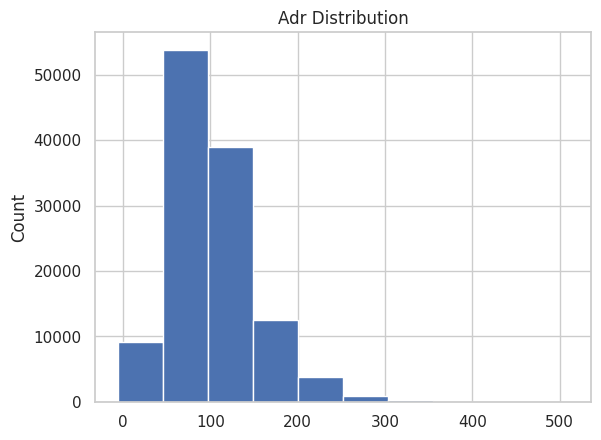

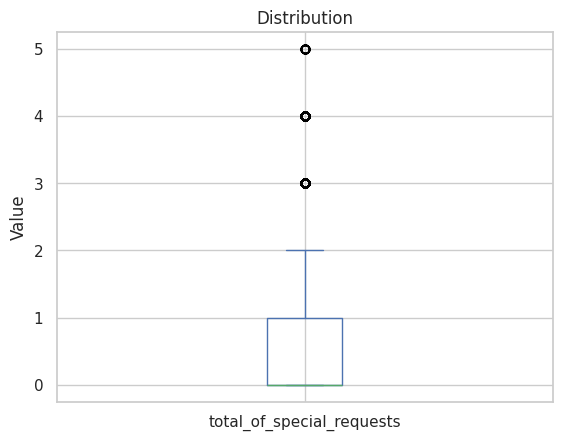

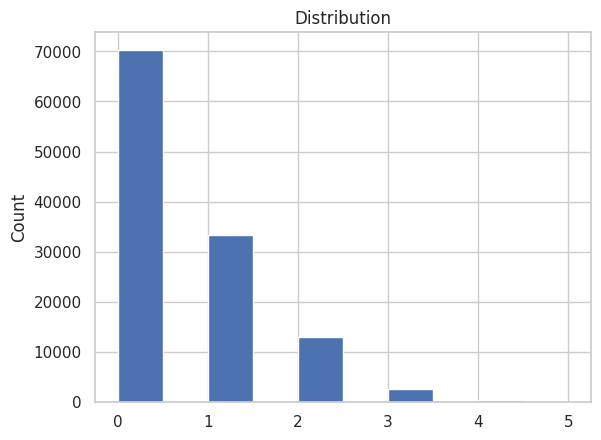

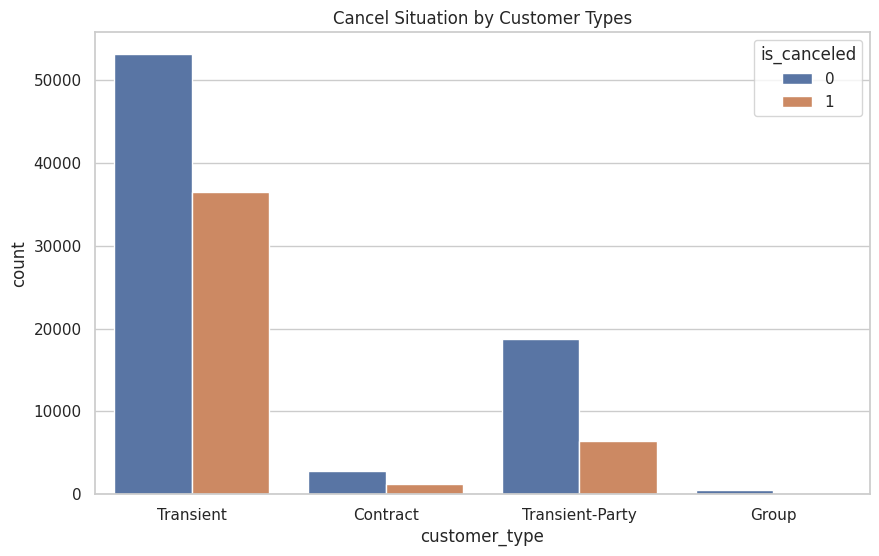

Cancel rate by required car parking spaces:
 required_car_parking_spaces
0    0.394922
1    0.000000
2    0.000000
3    0.000000
8    0.000000
Name: is_canceled, dtype: float64 

Cancel rate by special requests:
 total_of_special_requests
0    0.477196
1    0.220179
2    0.220928
3    0.178614
4    0.105882
5    0.050000
Name: is_canceled, dtype: float64 

Cancel rate by customer type:
(ignore the latter group of adr)
 adr              (-11.786, 1074.896]  (4318.724, 5400.0]
customer_type                                           
Contract                    0.309617                 NaN
Group                       0.102253                 NaN
Transient                   0.407457                 1.0
Transient-Party             0.254150                 NaN


/tmp/ipython-input-2324144162.py:34: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(values='is_canceled',


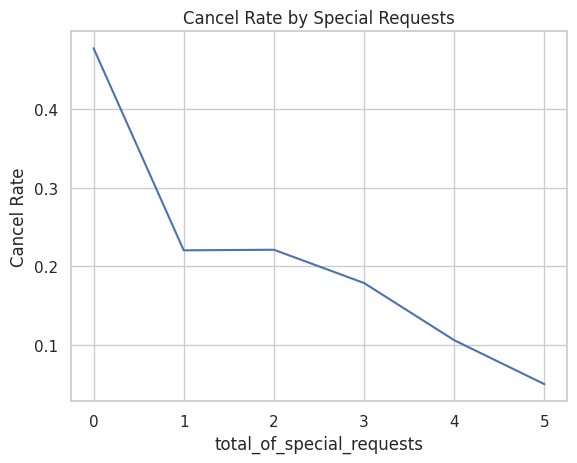

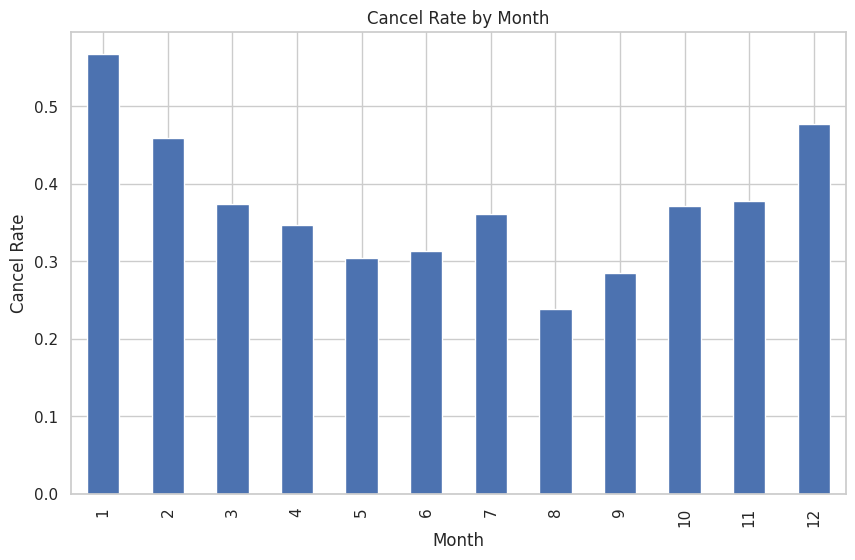

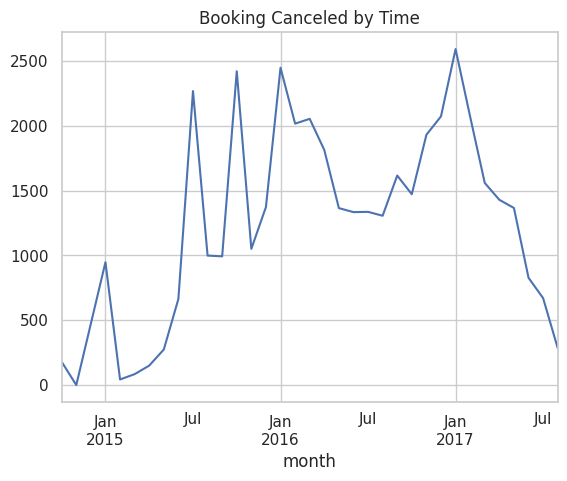

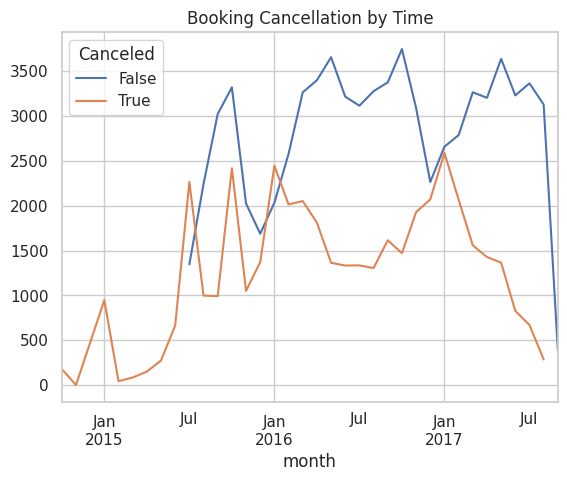

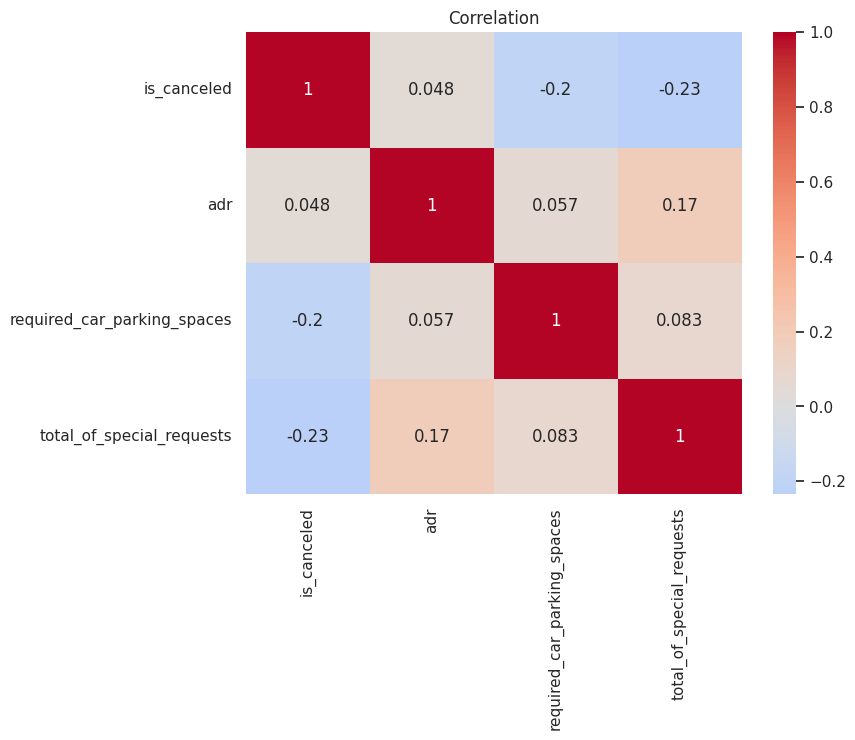

In [16]:
df[df['adr'] < 600]['adr'].plot(kind='hist')
plt.title('Adr Distribution')
plt.ylabel('Count')
plt.show()
# Distribution of required car parking spaces
df['required_car_parking_spaces'].value_counts()
# More readable than chart due to large scale difference
# Distribution of special requests
df['total_of_special_requests'].plot(kind='box')
plt.title('Distribution')
plt.ylabel('Value')
plt.show()
df['total_of_special_requests'].plot(kind='hist')
plt.title('Distribution')
plt.ylabel('Count')
plt.show()
# Cancel Situation by Customer Types
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='customer_type', hue='is_canceled')
plt.title('Cancel Situation by Customer Types')
plt.show()
# Cancel rate by required car parking spaces
parking_cancel = df.groupby('required_car_parking_spaces')['is_canceled'].mean()
print("Cancel rate by required car parking spaces:\n", parking_cancel, "\n")

# Cancel rate by special requests
special_req_cancel = df.groupby('total_of_special_requests')['is_canceled'].mean()
print("Cancel rate by special requests:\n", special_req_cancel, "\n")
special_req_cancel.plot()
plt.title('Cancel Rate by Special Requests')
plt.ylabel('Cancel Rate')

# Cancel rate by customer type
pivot_table = df.pivot_table(values='is_canceled',
                           index='customer_type',
                           columns=pd.cut(df['adr'], bins=5),
                           aggfunc='mean')
print("Cancel rate by customer type:\n(ignore the latter group of adr)\n", pivot_table)
# Cancel rate by month
df['reservation_month'] = df['reservation_status_date'].dt.month
monthly_cancel = df.groupby('reservation_month')['is_canceled'].mean()

plt.figure(figsize=(10, 6))
monthly_cancel.plot(kind='bar')
plt.title('Cancel Rate by Month')
plt.xlabel('Month')
plt.ylabel('Cancel Rate')
plt.show()
df['month'] = df['reservation_status_date'].dt.to_period('M')
df[df['reservation_status'] == 'Canceled'].groupby('month').size().plot()
plt.title('Booking Canceled by Time')
plt.show()
df['Canceled'] = df['reservation_status'] == 'Canceled'
pivot_df = df.pivot_table(values='reservation_status', index='month', columns='Canceled', aggfunc='count')
pivot_df.plot()
plt.title('Booking Cancellation by Time')
# Correlation of numerical variavles
corr_columns = ['is_canceled', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']
correlation_matrix = df[corr_columns].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation')
plt.show()

In [112]:
df = pd.read_csv('cleaned.csv')
pd.set_option('display.max_columns', None)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,email
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest.Barnes31@outlook.com
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea_Baker94@aol.com
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca_Parker@comcast.net
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,Laura_M@gmail.com
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03,LHines@verizon.com


/tmp/ipython-input-571048531.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-571048531.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipython-input-571048531.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-571048531.py:28: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



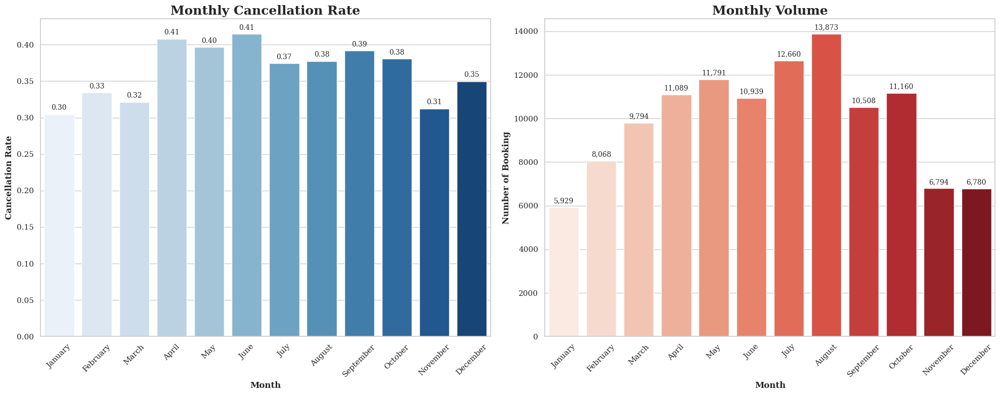

In [113]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

monthly_cancel_rate = df.groupby('arrival_date_month')['is_canceled'].mean().reindex(month_order)
monthly_volume = df.groupby('arrival_date_month')['is_canceled'].count().reindex(month_order)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Left: Monthly Cancellation Rate
bars1 = sns.barplot(x=monthly_cancel_rate.index, y=monthly_cancel_rate.values, palette='Blues', ax=axes[0])
axes[0].set_title('Monthly Cancellation Rate', fontsize=18)
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Cancellation Rate')
axes[0].set_xticklabels(month_order, rotation=45)
for bar in bars1.patches:
    height = bar.get_height()
    axes[0].annotate(f'{height:.2f}',
                   xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 4),  # 4 points vertical offset
                   textcoords="offset points",
                   ha='center', va='bottom', fontsize=10)

# Right: Monthly Booking Volume
bars2 = sns.barplot(x=monthly_volume.index, y=monthly_volume.values, palette='Reds', ax=axes[1])
axes[1].set_title('Monthly Volume', fontsize=18)
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Number of Booking')
axes[1].set_xticklabels(month_order, rotation=45)
for bar in bars2.patches:
    height = int(bar.get_height())
    axes[1].annotate(f'{height:,}',
                   xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 4),
                   textcoords="offset points",
                   ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


/tmp/ipython-input-537664250.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipython-input-537664250.py:17: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:steelblue'` for the same effect.




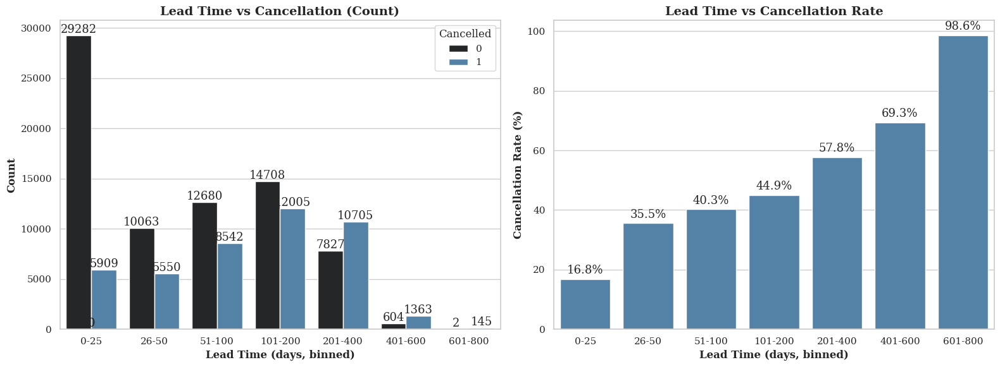

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

bins = [0, 25, 50, 100, 200, 400, 600, 800]
labels = ["0-25", "26-50", "51-100", "101-200", "201-400", "401-600", "601-800"]

df["lead_time_bin"] = pd.cut(df["lead_time"], bins=bins, labels=labels, include_lowest=True)

leadtime_cancel = df.groupby("lead_time_bin")["is_canceled"].mean().reset_index()
leadtime_cancel["is_canceled"] = leadtime_cancel["is_canceled"] * 100  # convert to percent

plt.figure(figsize=(16, 6))

# Left plot: countplot with cancellation hue
plt.subplot(1, 2, 1)
sns.countplot(data=df, x="lead_time_bin", hue="is_canceled", color="steelblue")
plt.title("Lead Time vs Cancellation (Count)")
plt.xlabel("Lead Time (days, binned)")
plt.ylabel("Count")
plt.legend(title="Cancelled", loc='upper right')
# Annotate countplot bars
ax = plt.gca()  # get current axis
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 1, f'{int(height)}', ha='center', va='bottom')

# Right plot: barplot for cancellation rate
plt.subplot(1, 2, 2)
barplot = sns.barplot(data=leadtime_cancel, x="lead_time_bin", y="is_canceled", color="steelblue")
plt.title("Lead Time vs Cancellation Rate")
plt.xlabel("Lead Time (days, binned)")
plt.ylabel("Cancellation Rate (%)")

# Annotate bar values
for bar in barplot.patches:
    height = bar.get_height()
    barplot.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{height:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()


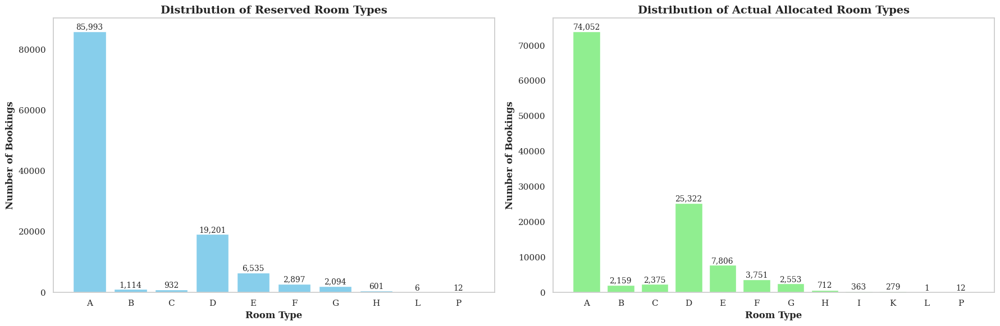

In [115]:
plt.figure(figsize=(18, 6))

# Distribution of Reserved Room Types (Total Volume)
plt.subplot(1, 2, 1)
reserved_counts = df['reserved_room_type'].value_counts().sort_index()
bars1 = plt.bar(reserved_counts.index, reserved_counts.values, color='skyblue')
plt.title('Distribution of Reserved Room Types')
plt.xlabel('Room Type')
plt.ylabel('Number of Bookings')
plt.grid(False)  # Disable grid (optional as grid is off by default)
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 50, f'{int(yval):,}', ha='center', va='bottom', fontsize=10)

# Distribution of Actual Allocated Room Types (Total Volume)
plt.subplot(1, 2, 2)
assigned_counts = df['assigned_room_type'].value_counts().sort_index()
bars2 = plt.bar(assigned_counts.index, assigned_counts.values, color='lightgreen')
plt.title('Distribution of Actual Allocated Room Types')
plt.xlabel('Room Type')
plt.ylabel('Number of Bookings')
plt.grid(False)  # Disable grid (optional)
for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 50, f'{int(yval):,}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


/tmp/ipython-input-546858568.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




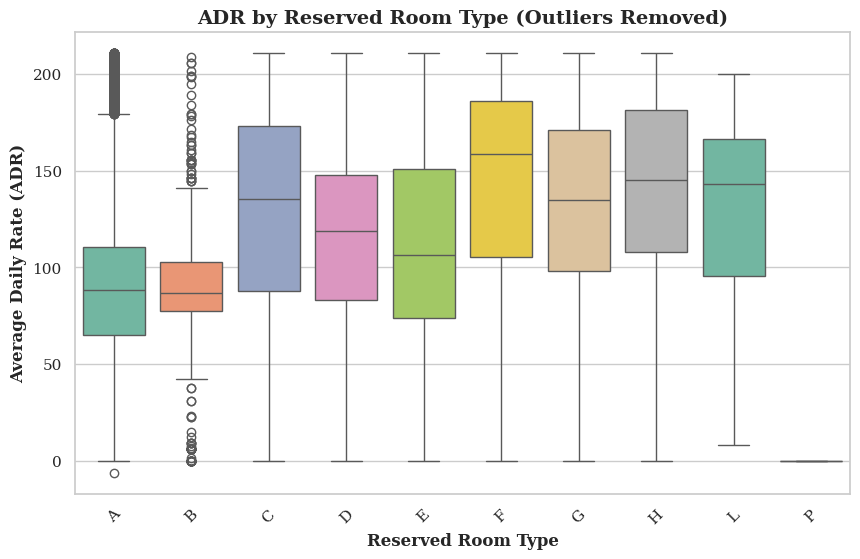

In [116]:
def remove_adr_outliers(df, column='adr'):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
df_clean = remove_adr_outliers(df)

reserved_order = sorted(df_clean['reserved_room_type'].unique())
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='reserved_room_type',
    y='adr',
    data=df_clean,
    palette='Set2',
    order=reserved_order
)
plt.title('ADR by Reserved Room Type (Outliers Removed)')
plt.xlabel('Reserved Room Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.xticks(rotation=45)
plt.show()

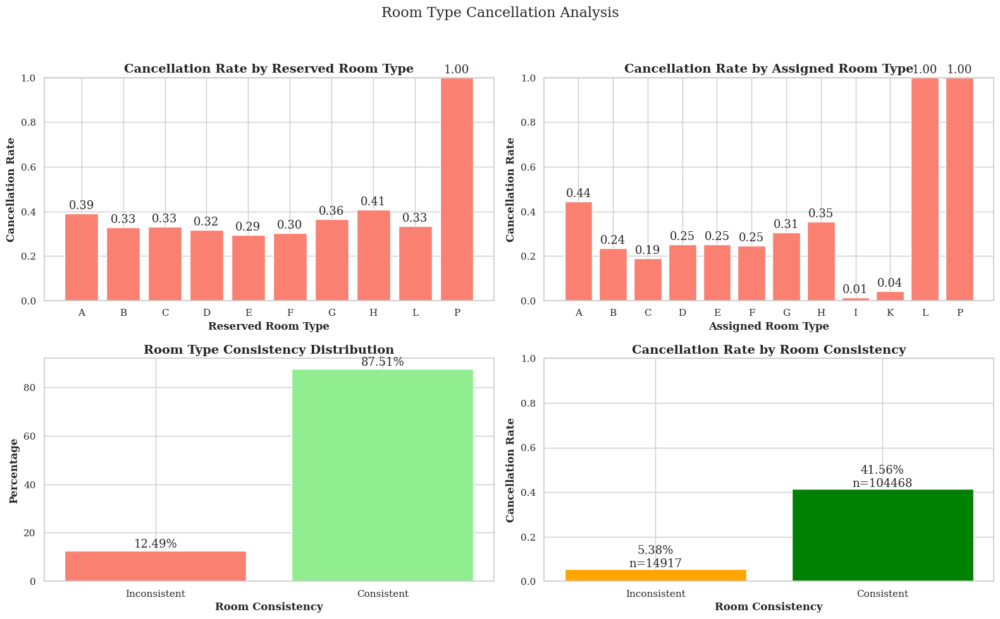

In [117]:
df['room_consistent'] = (df['reserved_room_type'] == df['assigned_room_type'])

# Prepare data
room_cancel = pd.crosstab(df['reserved_room_type'], df['is_canceled'], normalize='index')
cancellation_rates_reserved = room_cancel[1]

assigned_cancel = pd.crosstab(df['assigned_room_type'], df['is_canceled'], normalize='index')
cancellation_rates_assigned = assigned_cancel[1]

# Make sure 0 (False - Inconsistent) is always first, 1 (True - Consistent) second
consistency_counts = df['room_consistent'].value_counts().sort_index()
labels = ['Inconsistent', 'Consistent']
consistency_percentages = (consistency_counts / consistency_counts.sum()) * 100
consistency_percentages.index = labels

cancel_rate_by_consistency = pd.DataFrame({
    'Canceled': [802 / (14115 + 802), 43417 / (61051 + 43417)]
}, index=['Inconsistent', 'Consistent'])
rates = cancel_rate_by_consistency['Canceled']
total_counts = [14115 + 802, 61051 + 43417]

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('Room Type Cancellation Analysis', fontsize=16)

# 1️⃣ Cancellation Rate by Reserved Room Type
bars1 = axes[0, 0].bar(cancellation_rates_reserved.index, cancellation_rates_reserved.values, color='salmon')
axes[0, 0].set_title('Cancellation Rate by Reserved Room Type')
axes[0, 0].set_xlabel('Reserved Room Type')
axes[0, 0].set_ylabel('Cancellation Rate')
axes[0, 0].set_ylim(0, 1)
for bar in bars1:
    yval = bar.get_height()
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

# 2️⃣ Cancellation Rate by Assigned Room Type
bars2 = axes[0, 1].bar(cancellation_rates_assigned.index, cancellation_rates_assigned.values, color='salmon')
axes[0, 1].set_title('Cancellation Rate by Assigned Room Type')
axes[0, 1].set_xlabel('Assigned Room Type')
axes[0, 1].set_ylabel('Cancellation Rate')
axes[0, 1].set_ylim(0, 1)
for bar in bars2:
    yval = bar.get_height()
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom')

# 3️⃣ Room Type Consistency Percentage
bars3 = axes[1, 0].bar(consistency_percentages.index, consistency_percentages.values, color=['salmon', 'lightgreen'])
axes[1, 0].set_title('Room Type Consistency Distribution')
axes[1, 0].set_xlabel('Room Consistency')
axes[1, 0].set_ylabel('Percentage')
for i, bar in enumerate(bars3):
    yval = bar.get_height()
    axes[1, 0].text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{yval:.2f}%', ha='center', va='bottom')

# 4️⃣ Cancellation Rate by Room Consistency
bars4 = axes[1, 1].bar(rates.index, rates.values, color=['orange', 'green'])
axes[1, 1].set_title('Cancellation Rate by Room Consistency')
axes[1, 1].set_xlabel('Room Consistency')
axes[1, 1].set_ylabel('Cancellation Rate')
axes[1, 1].set_ylim(0, 1)
for i, val in enumerate(rates):
    axes[1, 1].text(i, val + 0.01, f'{val:.2%}\nn={total_counts[i]}', ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('room_type_combined_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


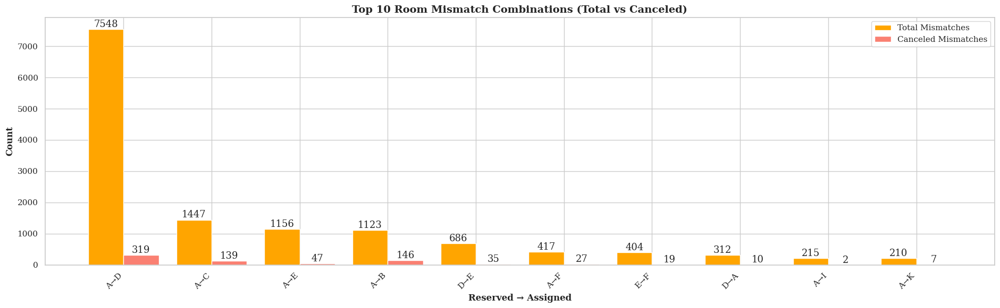

In [118]:
# 所有不一致的錯配組合
mismatch_all = df[df['room_consistent'] == False]
table_all = pd.crosstab(mismatch_all['reserved_room_type'], mismatch_all['assigned_room_type'])
top_all = table_all.stack().nlargest(10)

# 已取消的不一致錯配組合
mismatch_canceled = df[(df['room_consistent'] == False) & (df['is_canceled'] == 1)]
table_canceled = pd.crosstab(mismatch_canceled['reserved_room_type'], mismatch_canceled['assigned_room_type'])
top_canceled = table_canceled.stack()

# 只保留第一張圖的前10組，並從第二張圖中抓出對應取消數
combined_index = top_all.index
combined_df = pd.DataFrame({
    'Total Mismatches': top_all,
    'Canceled Mismatches': [top_canceled.get(idx, 0) for idx in combined_index]
})

labels = [f"{i[0]}→{i[1]}" for i in combined_index]
x = np.arange(len(labels))
width = 0.4

fig, ax = plt.subplots(figsize=(19
                                , 6))
bars1 = ax.bar(x - width/2, combined_df['Total Mismatches'], width, label='Total Mismatches', color='orange')
bars2 = ax.bar(x + width/2, combined_df['Canceled Mismatches'], width, label='Canceled Mismatches', color='salmon')

ax.set_title('Top 10 Room Mismatch Combinations (Total vs Canceled)')
ax.set_xlabel('Reserved → Assigned')
ax.set_ylabel('Count')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.legend()

# 加上標籤
for bar in bars1 + bars2:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 1, f'{int(yval)}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('room_mismatch_combined.png', dpi=300, bbox_inches='tight')
plt.show()


/tmp/ipython-input-1232734328.py:9: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/tmp/ipython-input-1232734328.py:31: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




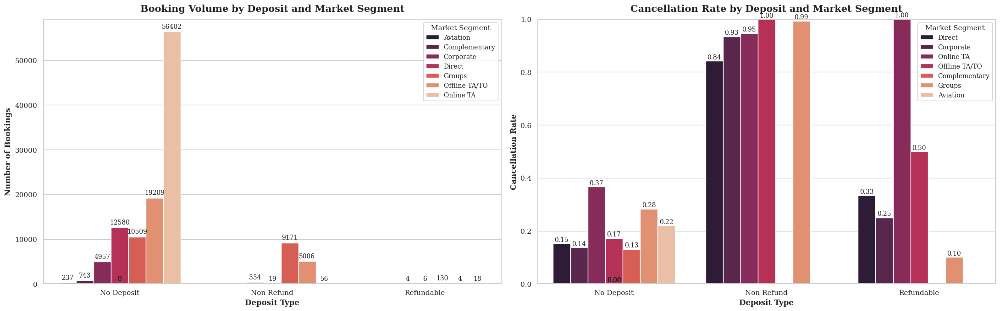

In [119]:
df_plot = df[df['deposit_type'].notna() & df['market_segment'].notna()]
volume_data = df_plot.groupby(['deposit_type', 'market_segment']).size().reset_index(name='count')

deposit_order = sorted(df_plot['deposit_type'].unique())

fig, axes = plt.subplots(1, 2, figsize=(22, 7))

# Left: Booking Volume without error bars
vol = sns.barplot(
    data=volume_data,
    x="deposit_type",
    y="count",
    hue="market_segment",
    palette="rocket",
    ax=axes[0],
    order=deposit_order,
    ci=None               # Disable confidence intervals/error bars
)
axes[0].set_title("Booking Volume by Deposit and Market Segment", fontsize=15, pad=12)
axes[0].set_xlabel("Deposit Type")
axes[0].set_ylabel("Number of Bookings")
axes[0].legend(title="Market Segment", frameon=True, fontsize=10, title_fontsize=11)
for p in vol.patches:
    height = p.get_height()
    if not pd.isna(height):
        axes[0].annotate(f'{int(height)}',
                         (p.get_x() + p.get_width() / 2, height),
                         ha='center', va='bottom', fontsize=10, xytext=(0, 3), textcoords='offset points')

# Right: Cancellation Rate without error bars
canc = sns.barplot(
    data=df_plot,
    x="deposit_type",
    y="is_canceled",
    hue="market_segment",
    palette="rocket",
    ax=axes[1],
    order=deposit_order,
    ci=None               # Disable confidence intervals/error bars
)
axes[1].set_title("Cancellation Rate by Deposit and Market Segment", fontsize=15, pad=12)
axes[1].set_xlabel("Deposit Type")
axes[1].set_ylabel("Cancellation Rate")
axes[1].legend(title="Market Segment", frameon=True, fontsize=10, title_fontsize=11)
axes[1].set_ylim(0, 1)
for p in canc.patches:
    height = p.get_height()
    if not pd.isna(height):
        axes[1].annotate(f'{height:.2f}',
                         (p.get_x() + p.get_width() / 2, height),
                         ha='center', va='bottom', fontsize=10, xytext=(0, 1), textcoords='offset points')

plt.tight_layout()
plt.show()


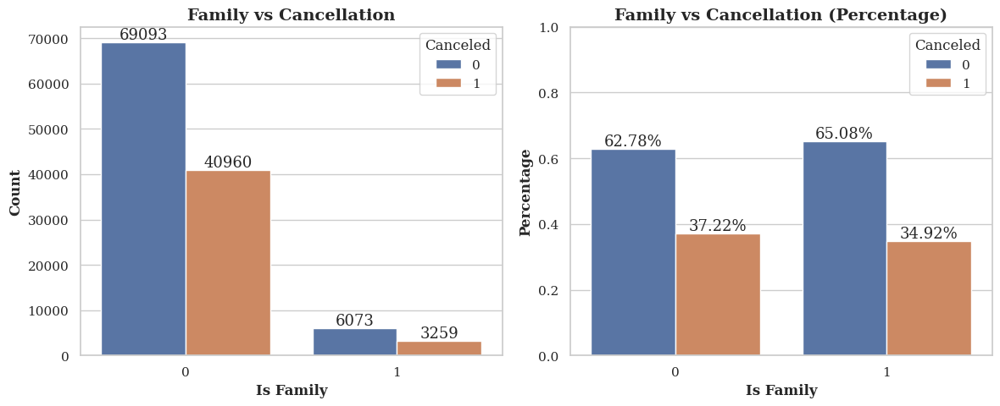

In [120]:
df['is_family'] = ((df['children'] + df['babies']) > 0).astype(int)

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

sns.countplot(data=df, x='is_family', hue='is_canceled', ax=ax[0])
ax[0].set_title('Family vs Cancellation')
ax[0].set_xlabel('Is Family')
ax[0].set_ylabel('Count')
ax[0].legend(title='Canceled', loc='upper right')

percent_df = (
    df.groupby('is_family')['is_canceled']
    .value_counts(normalize=True)
    .rename('percent')
    .reset_index()
)
sns.barplot(data=percent_df, x='is_family', y='percent', hue='is_canceled', ax=ax[1])
ax[1].set_title('Family vs Cancellation (Percentage)')
ax[1].set_xlabel('Is Family')
ax[1].set_ylabel('Percentage')
ax[1].set_ylim(0, 1)
ax[1].legend(title='Canceled', loc='upper right')

for container in ax[0].containers:
    ax[0].bar_label(container, fmt='%d', label_type='edge')

for container in ax[1].containers:
    ax[1].bar_label(container, labels=[f"{v.get_height():.2%}" for v in container], label_type='edge')

plt.tight_layout()
plt.show()


/tmp/ipython-input-486484140.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-486484140.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



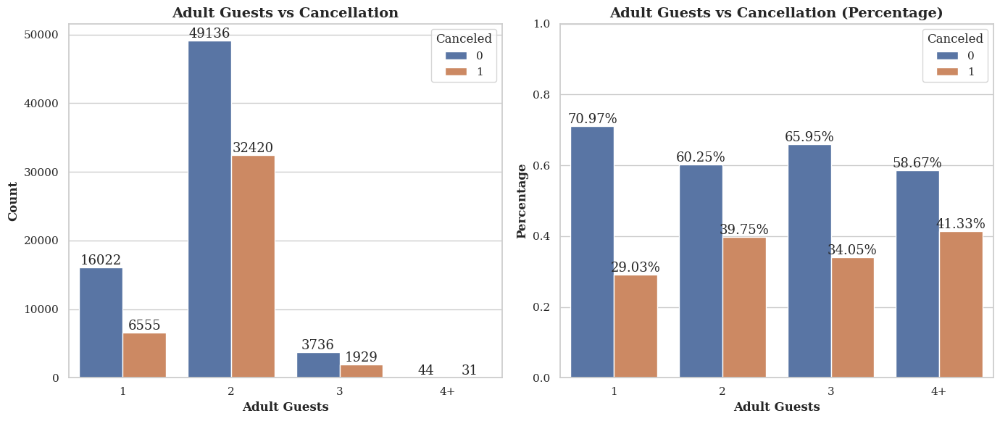

In [125]:
df_adults_only = df[(df['adults'] > 0) & (df['children'] == 0) & (df['babies'] == 0)]
df_adults_only['total_guests_bin'] = pd.cut(
    df_adults_only['adults'], bins=[0, 1, 2, 3, 55],labels=['1','2','3','4+'])
fig, ax = plt.subplots(1, 2, figsize=(14, 6))


# Count plot
sns.countplot(data=df_adults_only, x='total_guests_bin', hue='is_canceled', ax=ax[0])
ax[0].set_title('Adult Guests vs Cancellation')
ax[0].set_xlabel('Adult Guests')
ax[0].set_ylabel('Count')
ax[0].legend(title='Canceled')

# Percentage plot
total_counts = df_adults_only.groupby('total_guests_bin')['is_canceled']\
    .value_counts(normalize=True).rename('percent').reset_index()

sns.barplot(data=total_counts, x='total_guests_bin', y='percent', hue='is_canceled', ax=ax[1])
ax[1].set_title('Adult Guests vs Cancellation (Percentage)')
ax[1].set_xlabel('Adult Guests')
ax[1].set_ylabel('Percentage')
ax[1].set_ylim(0, 1)
ax[1].legend(title='Canceled')

# Add labels
for container in ax[0].containers:
    ax[0].bar_label(container, fmt='%d', label_type='edge')

for container in ax[1].containers:
    ax[1].bar_label(container, labels=[f"{v.get_height():.2%}" for v in container], label_type='edge')

plt.tight_layout()
plt.show()


#LOGISTIC REGRESSION USING PCA

In [17]:
pd.set_option('display.max_columns', 30)
sns.set(style='whitegrid')


data = pd.read_csv('cleaned.csv')

In [74]:
df = pd.read_csv("cleaned.csv")


# Drop columns not useful for modeling (like IDs, emails, dates)
drop_cols = ['email', 'reservation_status_date']
df = df.drop(columns=drop_cols, errors='ignore')

# Fill missing numeric values with 0, categorical with mode
for col in df.select_dtypes(include=['float64','int64']).columns:
    df[col] = df[col].fillna(0)

for col in df.select_dtypes(include=['object']).columns:
    df[col] = df[col].fillna(df[col].mode()[0])

# Encode categorical variables
df_encoded = df.copy()
for col in df_encoded.select_dtypes(include=['object']).columns:
    df_encoded[col] = LabelEncoder().fit_transform(df_encoded[col])


X = df_encoded.drop(columns=['is_canceled'])
y = df_encoded['is_canceled']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# PCA

pca = PCA(n_components=0.95)  # keep 95% variance
X_pca = pca.fit_transform(X_scaled)

print("Number of PCA components selected:", pca.n_components_)
print("Explained variance ratio:", pca.explained_variance_ratio_)


# Train/Test split

X_train, X_test, y_train, y_test = train_test_split(
    X_pca, y, test_size=0.2, random_state=42, stratify=y
)


# Logistic Regression

log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)


# Evaluation

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Number of PCA components selected: 25
Explained variance ratio: [0.11068633 0.09362811 0.06546591 0.05774207 0.05613972 0.04553545
 0.04369125 0.03771184 0.03550887 0.0336995  0.03353873 0.03221387
 0.03034583 0.02999267 0.02882253 0.02748004 0.02643683 0.02600824
 0.02323743 0.02252914 0.02239846 0.02063973 0.01869921 0.01712077
 0.01619048]
Accuracy: 0.9888176906646564

Confusion Matrix:
 [[15013    20]
 [  247  8597]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99     15033
           1       1.00      0.97      0.98      8844

    accuracy                           0.99     23877
   macro avg       0.99      0.99      0.99     23877
weighted avg       0.99      0.99      0.99     23877



**Logistic Regression with PCA, and after dropping high cardinality columns, and columns potentially causing data leakage.**

In [80]:

# Drop leakage / ID-like columns
drop_cols = ['email', 'reservation_status', 'reservation_status_date', 'company', 'agent']
df = df.drop(columns=drop_cols, errors='ignore')

# Handle missing values
df = df.fillna({
    col: df[col].mode()[0] if df[col].dtype == 'O' else 0
    for col in df.columns
})

# One-hot encode categoricals
df_encoded = pd.get_dummies(df, drop_first=True)

# Features / Target
X = df_encoded.drop(columns=['is_canceled'])
y = df_encoded['is_canceled']

# Scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA(n_components=0.90)  # try 90% instead of 95%
X_pca = pca.fit_transform(X_scaled)

# Train/Test
X_train, X_test, y_train, y_test = train_test_split(
    X_pca, y, test_size=0.2, random_state=42, stratify=y
)

# Logistic Regression with stronger regularization
log_reg = LogisticRegression(max_iter=1000, C=0.5)
log_reg.fit(X_train, y_train)

print("Accuracy:", log_reg.score(X_test, y_test))


Accuracy: 0.8101520291493907


**Comparing Training and Testing Accuracy**

In [76]:
from sklearn.metrics import accuracy_score, classification_report

# Train accuracy
y_train_pred = log_reg.predict(X_train)
train_acc = accuracy_score(y_train, y_train_pred)

# Test accuracy
y_test_pred = log_reg.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)

print("Train Accuracy:", train_acc)
print("Test Accuracy :", test_acc)

# Detailed reports
print("\nClassification Report (Train):\n", classification_report(y_train, y_train_pred))
print("\nClassification Report (Test):\n", classification_report(y_test, y_test_pred))


Train Accuracy: 0.8070004606943921
Test Accuracy : 0.8101520291493907

Classification Report (Train):
               precision    recall  f1-score   support

           0       0.81      0.91      0.86     60133
           1       0.80      0.64      0.71     35375

    accuracy                           0.81     95508
   macro avg       0.80      0.77      0.78     95508
weighted avg       0.81      0.81      0.80     95508


Classification Report (Test):
               precision    recall  f1-score   support

           0       0.81      0.91      0.86     15033
           1       0.81      0.64      0.71      8844

    accuracy                           0.81     23877
   macro avg       0.81      0.77      0.79     23877
weighted avg       0.81      0.81      0.80     23877



Training and Testing accuracy both seem reasonable and are pretty close.

In [83]:

cv_scores = cross_val_score(log_reg, X_pca, y, cv=5, scoring='accuracy')
print("Cross-validation accuracies:", cv_scores)
print("Mean CV accuracy:", cv_scores.mean())


Cross-validation accuracies: [0.71411819 0.72241069 0.74004272 0.73903757 0.67818403]
Mean CV accuracy: 0.7187586380198516


Generalization accuracy is ~72%.

Still some overfitting since training accuracy is ~81%

Our hypothesis is that this is because the data is imbalanced.

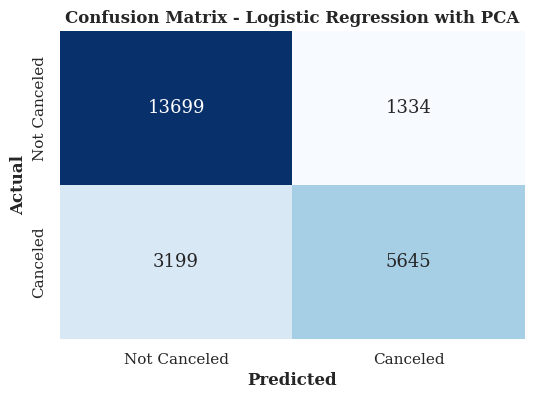

In [84]:

# Predictions on test set
y_test_pred = log_reg.predict(X_test)

# Confusion Matrix
cm = confusion_matrix(y_test, y_test_pred)

# Plot
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", cbar=False,
            xticklabels=["Not Canceled", "Canceled"],
            yticklabels=["Not Canceled", "Canceled"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression with PCA")
plt.show()


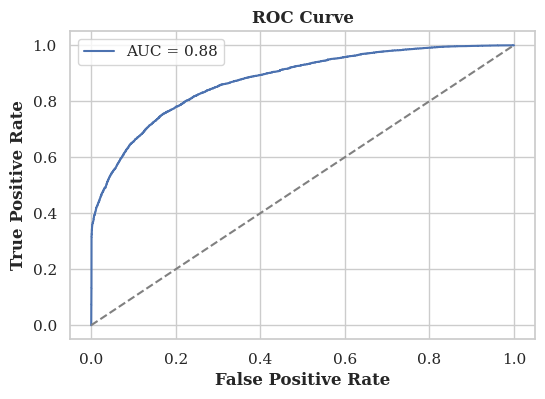

In [88]:
y_prob = log_reg.predict_proba(X_test)[:,1]  # probabilities for "canceled"
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_prob):.2f}")
plt.plot([0,1],[0,1],'--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

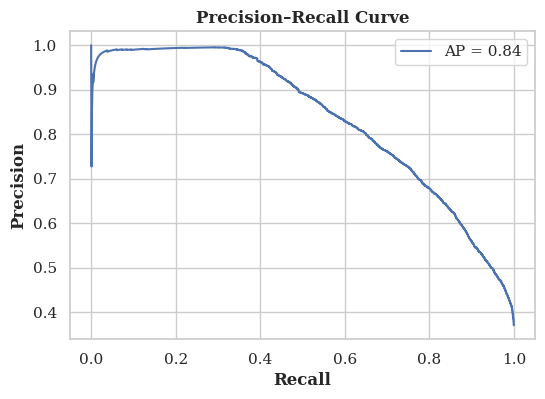

In [89]:

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

plt.figure(figsize=(6,4))
plt.plot(recall, precision, label=f"AP = {average_precision_score(y_test, y_prob):.2f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve")
plt.legend()
plt.show()

#LOGISTIC REGRESSION USING LASSO

In [19]:
# Display basic data information
df = pd.read_csv('cleaned.csv')
print("\n=== Basic data information ===")
target_variables = ['reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type',  'days_in_waiting_list', 'is_canceled']
print(df[target_variables].info())


=== Basic data information ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119385 entries, 0 to 119384
Data columns (total 6 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   reserved_room_type    119385 non-null  object
 1   assigned_room_type    119385 non-null  object
 2   booking_changes       119385 non-null  int64 
 3   deposit_type          119385 non-null  object
 4   days_in_waiting_list  119385 non-null  int64 
 5   is_canceled           119385 non-null  int64 
dtypes: int64(3), object(3)
memory usage: 5.5+ MB
None


In [20]:
print("\n=== 3. Distribution Analysis of Numerical Variables ===")
numeric_vars = ['booking_changes', 'days_in_waiting_list']
for var in numeric_vars:
    print(f"\nStatistical Information for {var}:")
    desc = df[var].describe()
    print(desc)

    # Check for outliers
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[var] < lower_bound) | (df[var] > upper_bound)]
    print(f"  Number of outliers: {len(outliers)} ({len(outliers)/len(df)*100:.2f}%)")


=== 3. Distribution Analysis of Numerical Variables ===

Statistical Information for booking_changes:
count    119385.000000
mean          0.221133
std           0.652318
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          21.000000
Name: booking_changes, dtype: float64
  Number of outliers: 18076 (15.14%)

Statistical Information for days_in_waiting_list:
count    119385.000000
mean          2.321246
std          17.595083
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         391.000000
Name: days_in_waiting_list, dtype: float64
  Number of outliers: 3698 (3.10%)


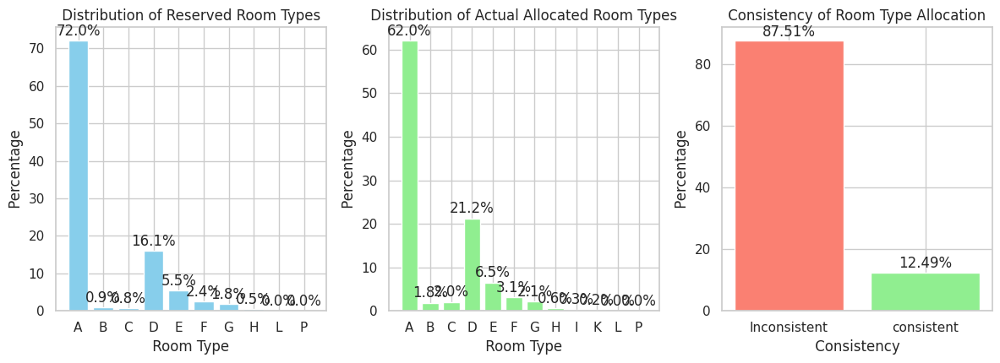

Data loaded successfully!
Dataset size: (119385, 34)

First 5 rows:
  reserved_room_type assigned_room_type  is_canceled  room_consistent
0                  C                  C            0             True
1                  C                  C            0             True
2                  A                  C            0            False
3                  A                  A            0             True
4                  A                  A            0             True


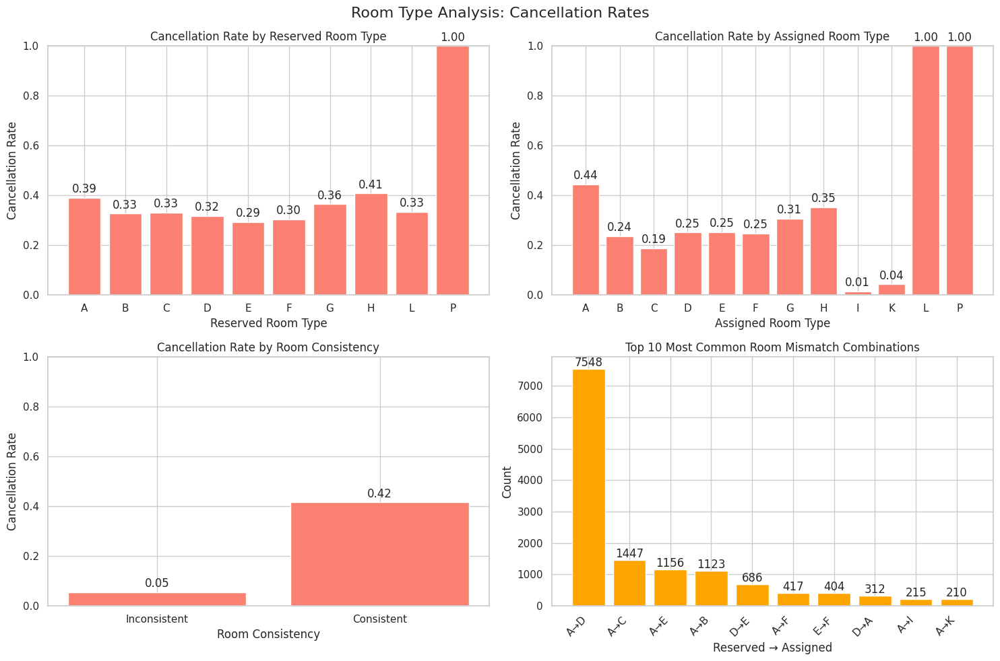

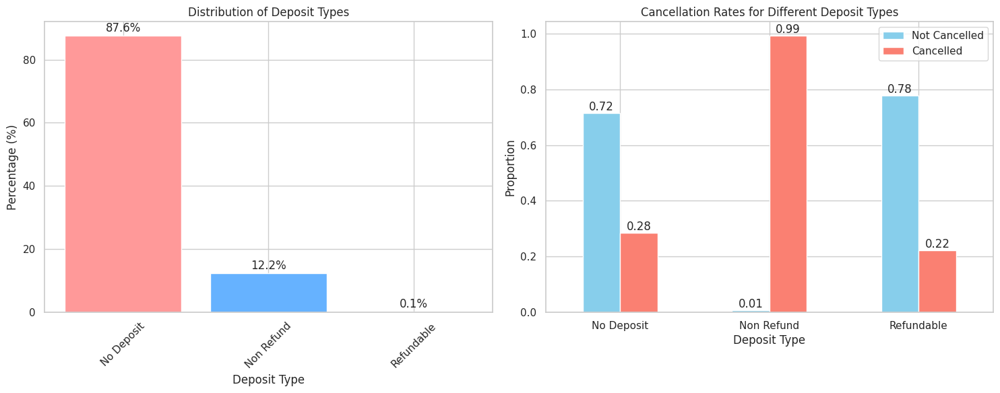

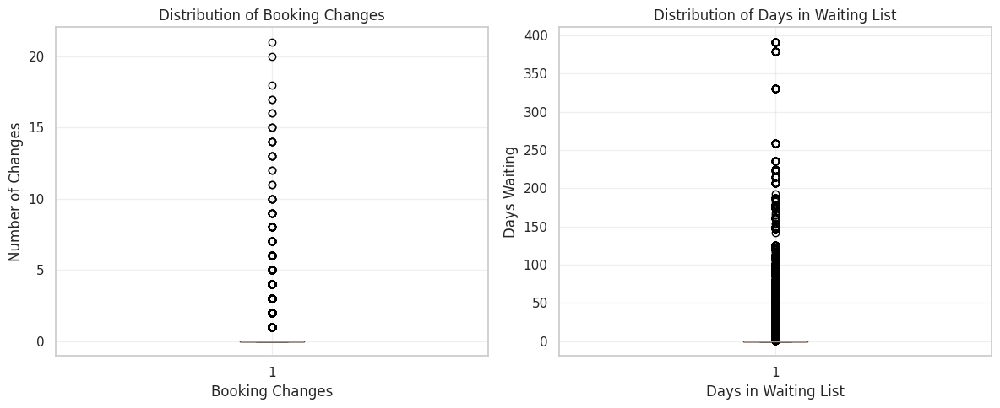

In [21]:
# 1. Distribution of Reserved room types
plt.figure(figsize=(12, 8))

# Distribution of Reserved Room Types
plt.subplot(2, 3, 1)
reserved_counts = df['reserved_room_type'].value_counts().sort_index()
total_reserved = reserved_counts.sum()
reserved_percentages = (reserved_counts / total_reserved) * 100  # 计算百分比
bars1 = plt.bar(reserved_percentages.index, reserved_percentages.values, color='skyblue')
plt.title(' Distribution of Reserved Room Types ')
plt.xlabel(' Room Type ')
plt.ylabel(' Percentage ')
for i, bar in enumerate(bars1):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{yval:.1f}%', ha='center', va='bottom')

# Distribution of Actual allocated room types
plt.subplot(2, 3, 2)
assigned_counts = df['assigned_room_type'].value_counts().sort_index()
total_assigned = assigned_counts.sum()
assigned_percentages = (assigned_counts / total_assigned) * 100  # 计算百分比
bars2 = plt.bar(assigned_percentages.index, assigned_percentages.values, color='lightgreen')
plt.title(' Distribution of Actual Allocated Room Types ')
plt.xlabel(' Room Type ')
plt.ylabel(' Percentage ')
for i, bar in enumerate(bars2):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{yval:.1f}%', ha='center', va='bottom')

# Consistent distribution of room types
plt.subplot(2, 3, 3)
df['room_consistent'] = (df['reserved_room_type'] == df['assigned_room_type'])
consistency_counts = df['room_consistent'].value_counts()
total_consistent = consistency_counts.sum()
consistency_percentages = (consistency_counts / total_consistent) * 100  # 计算百分比
bars6 = plt.bar(['Inconsistent', 'consistent'], consistency_percentages.values, color=['salmon', 'lightgreen'])
plt.title(' Consistency of Room Type Allocation ')
plt.xlabel(' Consistency ')
plt.ylabel(' Percentage ')
for i, bar in enumerate(bars6):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{yval:.2f}%', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('1.png', dpi=300, bbox_inches='tight')
plt.show()
# Create room consistency variable
df['room_consistent'] = (df['reserved_room_type'] == df['assigned_room_type'])

print("Data loaded successfully!")
print(f"Dataset size: {df.shape}")

# Display first few rows of data
print("\nFirst 5 rows:")
print(df[['reserved_room_type', 'assigned_room_type', 'is_canceled', 'room_consistent']].head())

# Create visualization charts
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Room Type Analysis: Cancellation Rates', fontsize=16)

# 1. reserved_room_type vs is_canceled (show only cancellation rates)
room_cancel = pd.crosstab(df['reserved_room_type'], df['is_canceled'], normalize='index')
# Extract only cancellation rates (proportion of canceled bookings)
cancellation_rates_reserved = room_cancel[1]  # 1 represents canceled
bars1 = axes[0,0].bar(cancellation_rates_reserved.index, cancellation_rates_reserved.values, color='salmon')
axes[0,0].set_title('Cancellation Rate by Reserved Room Type')
axes[0,0].set_xlabel('Reserved Room Type')
axes[0,0].set_ylabel('Cancellation Rate')
axes[0,0].tick_params(axis='x', rotation=0)
axes[0,0].set_ylim(0, 1)

# Add value labels on bars
for bar in bars1:
    yval = bar.get_height()
    axes[0,0].text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}',
                   ha='center', va='bottom')

# 2. assigned_room_type vs is_canceled (show only cancellation rates)
assigned_cancel = pd.crosstab(df['assigned_room_type'], df['is_canceled'], normalize='index')
# Extract only cancellation rates (proportion of canceled bookings)
cancellation_rates_assigned = assigned_cancel[1]  # 1 represents canceled
bars2 = axes[0,1].bar(cancellation_rates_assigned.index, cancellation_rates_assigned.values, color='salmon')
axes[0,1].set_title('Cancellation Rate by Assigned Room Type')
axes[0,1].set_xlabel('Assigned Room Type')
axes[0,1].set_ylabel('Cancellation Rate')
axes[0,1].tick_params(axis='x', rotation=0)
axes[0,1].set_ylim(0, 1)

# Add value labels on bars
for bar in bars2:
    yval = bar.get_height()
    axes[0,1].text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}',
                   ha='center', va='bottom')

# 3. room_consistent vs is_canceled (show only cancellation rates)
consistent_cancel = pd.crosstab(df['room_consistent'], df['is_canceled'], normalize='index')
# Extract only cancellation rates (proportion of canceled bookings)
consistent_cancellation_rates = consistent_cancel[1]
# Reindex for better display
consistent_cancellation_rates.index = ['Inconsistent', 'Consistent']
bars3 = axes[1,0].bar(consistent_cancellation_rates.index, consistent_cancellation_rates.values, color='salmon')
axes[1,0].set_title('Cancellation Rate by Room Consistency')
axes[1,0].set_xlabel('Room Consistency')
axes[1,0].set_ylabel('Cancellation Rate')
axes[1,0].tick_params(axis='x', rotation=0)
axes[1,0].set_ylim(0, 1)

# Add value labels on bars
for bar in bars3:
    yval = bar.get_height()
    axes[1,0].text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}',
                   ha='center', va='bottom')

# 4. Analysis of room type mismatches
axes[1,1].remove()  # Remove the original subplot
ax4 = fig.add_subplot(2, 2, 4)

# Create heatmap for room type mismatch combinations
inconsistent_df = df[~df['room_consistent']].copy()
if len(inconsistent_df) > 0:
    # Create crosstab showing most common mismatch combinations
    mismatch_crosstab = pd.crosstab(inconsistent_df['reserved_room_type'], inconsistent_df['assigned_room_type'])
    # Show only top 10 most common combinations
    top_mismatches = mismatch_crosstab.stack().nlargest(10)

    # Create bar chart showing most common mismatch combinations
    bars4 = ax4.bar(range(len(top_mismatches)), top_mismatches.values, color='orange')
    ax4.set_title('Top 10 Most Common Room Mismatch Combinations')
    ax4.set_xlabel('Reserved → Assigned')
    ax4.set_ylabel('Count')
    ax4.set_xticks(range(len(top_mismatches)))
    ax4.set_xticklabels([f"{idx[0]}→{idx[1]}" for idx in top_mismatches.index], rotation=45, ha='right')

    # Add value labels on bars
    for bar in bars4:
        yval = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{int(yval)}',
                ha='center', va='bottom')

plt.tight_layout()
plt.savefig('room_type_cancellation_analysis.png', dpi=300, bbox_inches='tight')
plt.show()
# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Deposit type distribution (show percentages)
deposit_counts = df['deposit_type'].value_counts()
total = deposit_counts.sum()
percentages = (deposit_counts / total) * 100

bars1 = ax1.bar(deposit_counts.index, percentages,
                color=['#FF9999', '#66B2FF', '#99FF99'])
ax1.set_title('Distribution of Deposit Types')
ax1.set_xlabel('Deposit Type')
ax1.set_ylabel('Percentage (%)')
ax1.tick_params(axis='x', rotation=45)

# Add percentage labels on bars
for i, (bar, percentage) in enumerate(zip(bars1, percentages)):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{percentage:.1f}%', ha='center', va='bottom')

# deposit_type vs is_canceled (show values)
deposit_cancel = pd.crosstab(df['deposit_type'], df['is_canceled'], normalize='index')
bars2 = deposit_cancel.plot(kind='bar', color=['skyblue', 'salmon'], ax=ax2)
ax2.set_title('Cancellation Rates for Different Deposit Types')
ax2.set_xlabel('Deposit Type')
ax2.set_ylabel('Proportion')
ax2.legend(['Not Cancelled', 'Cancelled'])
ax2.tick_params(axis='x', rotation=0)

# Add value labels on bars
for container in ax2.containers:
    ax2.bar_label(container, fmt='%.2f', label_type='edge')

plt.tight_layout()
plt.savefig('deposit_analysis.png', dpi=300, bbox_inches='tight')
plt.show()
# Create box plots
plt.figure(figsize=(12, 5))

# Booking changes box plot
plt.subplot(1, 2, 1)
plt.boxplot(df['booking_changes'])
plt.title('Distribution of Booking Changes')
plt.ylabel('Number of Changes')
plt.xlabel('Booking Changes')
plt.grid(True, alpha=0.3)

# Waiting list days box plot
plt.subplot(1, 2, 2)
plt.boxplot(df['days_in_waiting_list'])
plt.title('Distribution of Days in Waiting List')
plt.ylabel('Days Waiting')
plt.xlabel('Days in Waiting List')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('boxplot_booking_variables.png', dpi=300, bbox_inches='tight')
plt.show()


/tmp/ipython-input-2311069534.py:38: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bc_cancel = df.groupby('booking_changes_binned')['is_canceled'].mean()
/tmp/ipython-input-2311069534.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dw_cancel = df.groupby('days_in_waiting_list_binned')['is_canceled'].mean()


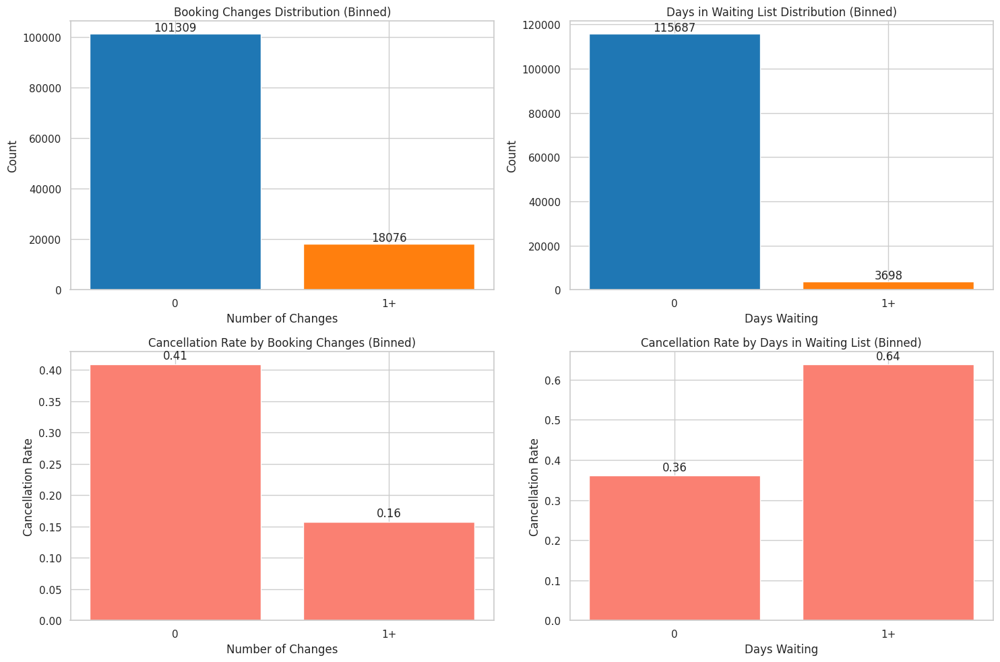

In [22]:
# booking_changes bin
df['booking_changes_binned'] = pd.cut(df['booking_changes'],
                                     bins=[-1, 0,   float('inf')],
                                     labels=['0', '1+'])

# days_in_waiting_list bin
df['days_in_waiting_list_binned'] = pd.cut(df['days_in_waiting_list'],
                                          bins=[-1, 0, float('inf')],
                                          labels=['0', '1+'])
plt.figure(figsize=(15, 10))

# 1. Booking Changes Distribution (Binned)
plt.subplot(2, 2, 1)
bc_counts = df['booking_changes_binned'].value_counts().sort_index()
bars1 = plt.bar(range(len(bc_counts)), bc_counts.values, color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'])
plt.title('Booking Changes Distribution (Binned)')
plt.xlabel('Number of Changes')
plt.ylabel('Count')
plt.xticks(range(len(bc_counts)), bc_counts.index)
for i, bar in enumerate(bars1):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{int(yval)}', ha='center', va='bottom')

# 2. Days in Waiting List Distribution (Binned)
plt.subplot(2, 2, 2)
dw_counts = df['days_in_waiting_list_binned'].value_counts().sort_index()
bars2 = plt.bar(range(len(dw_counts)), dw_counts.values, color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
plt.title('Days in Waiting List Distribution (Binned)')
plt.xlabel('Days Waiting')
plt.ylabel('Count')
plt.xticks(range(len(dw_counts)), dw_counts.index)
for i, bar in enumerate(bars2):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{int(yval)}', ha='center', va='bottom')

# 3. Cancellation Rate by Booking Changes (Binned)
plt.subplot(2, 2, 3)
bc_cancel = df.groupby('booking_changes_binned')['is_canceled'].mean()
bars3 = plt.bar(range(len(bc_cancel)), bc_cancel.values,color='salmon')
plt.title('Cancellation Rate by Booking Changes (Binned)')
plt.xlabel('Number of Changes')
plt.ylabel('Cancellation Rate')
plt.xticks(range(len(bc_cancel)), bc_cancel.index)
for i, bar in enumerate(bars3):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.2f}', ha='center', va='bottom')

# 4. Cancellation Rate by Days in Waiting List (Binned)
plt.subplot(2, 2, 4)
dw_cancel = df.groupby('days_in_waiting_list_binned')['is_canceled'].mean()
bars4 = plt.bar(range(len(dw_cancel)), dw_cancel.values,color='salmon')
plt.title('Cancellation Rate by Days in Waiting List (Binned)')
plt.xlabel('Days Waiting')
plt.ylabel('Cancellation Rate')
plt.xticks(range(len(dw_cancel)), dw_cancel.index)
for i, bar in enumerate(bars4):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('binned_variables_analysis.png', dpi=300, bbox_inches='tight')
plt.show()


#CART ANALYSIS AND FEATURES ENGINEERING


Accuracy of CART model: 0.7822
===== CART Decision Tree =====
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.78      0.82     15033
           1       0.68      0.79      0.73      8844

    accuracy                           0.78     23877
   macro avg       0.77      0.78      0.77     23877
weighted avg       0.79      0.78      0.79     23877

Confusion Matrix:
 [[11664  3369]
 [ 1832  7012]]
ROC-AUC Score: 0.8711675449244587


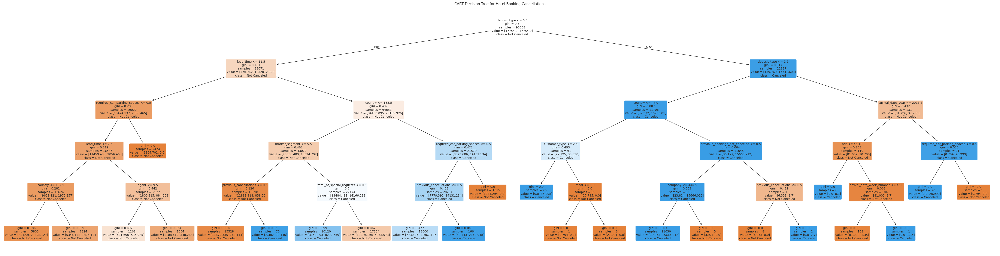


Top 10 Important Features:
deposit_type                   0.456531
market_segment                 0.169486
lead_time                      0.108595
country                        0.089974
total_of_special_requests      0.086113
required_car_parking_spaces    0.047525
previous_cancellations         0.034547
agent                          0.002551
arrival_date_year              0.001527
customer_type                  0.001523
dtype: float64


In [23]:
df = pd.read_csv("cleaned.csv")

# =============================
# PREPROCESSING
# =============================

# Drop columns that leak target info
df_class = df.drop(columns=['reservation_status', 'reservation_status_date', 'email'])

# Separate categorical and numeric
categorical_cols = df_class.select_dtypes(include=['object']).columns
numeric_cols = df_class.select_dtypes(include=['int64', 'float64']).columns.drop('is_canceled')

# Handle missing values
imputer_num = SimpleImputer(strategy='mean')
imputer_cat = SimpleImputer(strategy='most_frequent')

df_class[numeric_cols] = imputer_num.fit_transform(df_class[numeric_cols])
df_class[categorical_cols] = imputer_cat.fit_transform(df_class[categorical_cols])

# Encode categoricals
for col in categorical_cols:
    le = LabelEncoder()
    df_class[col] = le.fit_transform(df_class[col].astype(str))

# Features & target
X = df_class.drop(columns=['is_canceled'])
y = df_class['is_canceled']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# =============================
# 4. CART MODEL
# =============================

cart = DecisionTreeClassifier(
    criterion="gini",      # CART uses Gini Index
    max_depth=5,           # Limit depth (to avoid overfitting)
    class_weight="balanced",
    random_state=42
)

# Train the CART model
cart.fit(X_train, y_train)

# Predictions
y_pred = cart.predict(X_test)
y_proba = cart.predict_proba(X_test)[:, 1]
from sklearn.metrics import accuracy_score

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of CART model:", round(accuracy, 4))


# =============================
# 5. EVALUATION
# =============================
print("===== CART Decision Tree =====")
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))

# =============================
# 6. VISUALIZE DECISION TREE
# =============================
plt.figure(figsize=(60,15))
plot_tree(
    cart,
    feature_names=X.columns,
    class_names=["Not Canceled", "Canceled"],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("CART Decision Tree for Hotel Booking Cancellations")
plt.show()

# =============================
# 7. FEATURE IMPORTANCE
# =============================
importances = pd.Series(cart.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop 10 Important Features:")
print(importances.head(10))


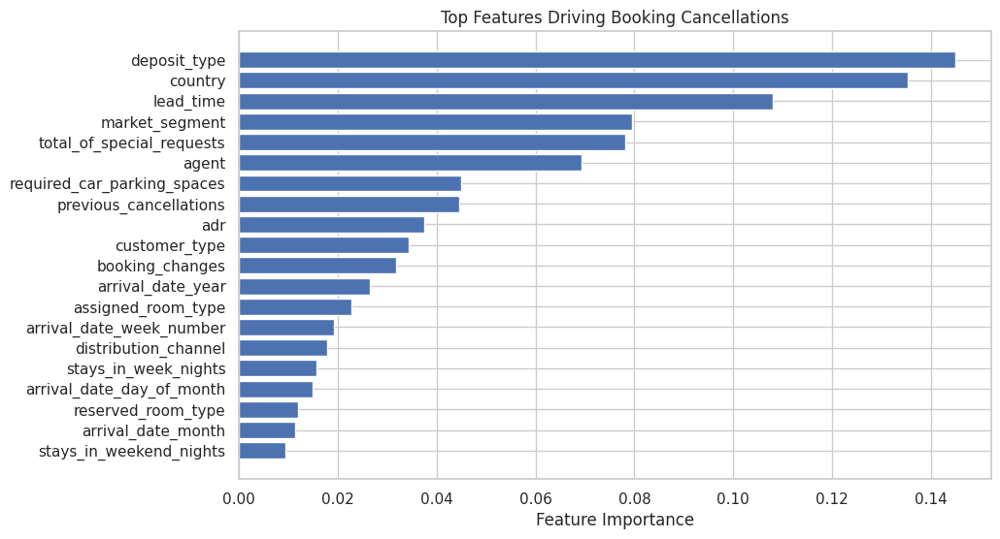

1. deposit_type: 0.1449
2. country: 0.1353
3. lead_time: 0.1081
4. market_segment: 0.0795
5. total_of_special_requests: 0.0782
6. agent: 0.0694
7. required_car_parking_spaces: 0.0450
8. previous_cancellations: 0.0445
9. adr: 0.0375
10. customer_type: 0.0345
11. booking_changes: 0.0319
12. arrival_date_year: 0.0266
13. assigned_room_type: 0.0228
14. arrival_date_week_number: 0.0193
15. distribution_channel: 0.0178
16. stays_in_week_nights: 0.0158
17. arrival_date_day_of_month: 0.0150
18. reserved_room_type: 0.0119
19. arrival_date_month: 0.0115
20. stays_in_weekend_nights: 0.0095


In [24]:
# Drop columns that leak info
df_class = df.drop(columns=['reservation_status', 'reservation_status_date', 'email'])

# Separate categorical + numeric
categorical_cols = df_class.select_dtypes(include=['object']).columns
numeric_cols = df_class.select_dtypes(include=['int64', 'float64']).columns.drop('is_canceled')

# Handle missing values
imputer_num = SimpleImputer(strategy='mean')
imputer_cat = SimpleImputer(strategy='most_frequent')

df_class[numeric_cols] = imputer_num.fit_transform(df_class[numeric_cols])
df_class[categorical_cols] = imputer_cat.fit_transform(df_class[categorical_cols])

# Encode categoricals
for col in categorical_cols:
    le = LabelEncoder()
    df_class[col] = le.fit_transform(df_class[col].astype(str))

# Features & target
X = df_class.drop(columns=['is_canceled'])
y = df_class['is_canceled']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train Random Forest
rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=15,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_scaled, y_train)

# Predictions
y_pred = rf.predict(X_test_scaled)
y_proba = rf.predict_proba(X_test_scaled)[:, 1]
# Get feature importances
importances = rf.feature_importances_
features = X.columns
indices = np.argsort(importances)[::-1]   # sort descending

# Top 20 features
top_n = 20
plt.figure(figsize=(10,6))
plt.barh(range(top_n), importances[indices[:top_n]][::-1], align="center")
plt.yticks(range(top_n), [features[i] for i in indices[:top_n]][::-1])
plt.xlabel("Feature Importance")
plt.title("Top Features Driving Booking Cancellations")
plt.show()

# Print ranked features
for i in range(top_n):
    print(f"{i+1}. {features[indices[i]]}: {importances[indices[i]]:.4f}")

#EXPLOROING THE DATA FOR CLUSTERING


In [26]:
import pandas as pd
df = pd.read_csv('hotel_booking.csv')

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set global style and font
sns.set_theme(style="whitegrid", palette="crest")
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": "Georgia",
    "font.size": 12,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
    "axes.labelsize": 12,
    "figure.titlesize": 16,
})


/tmp/ipython-input-3653136203.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


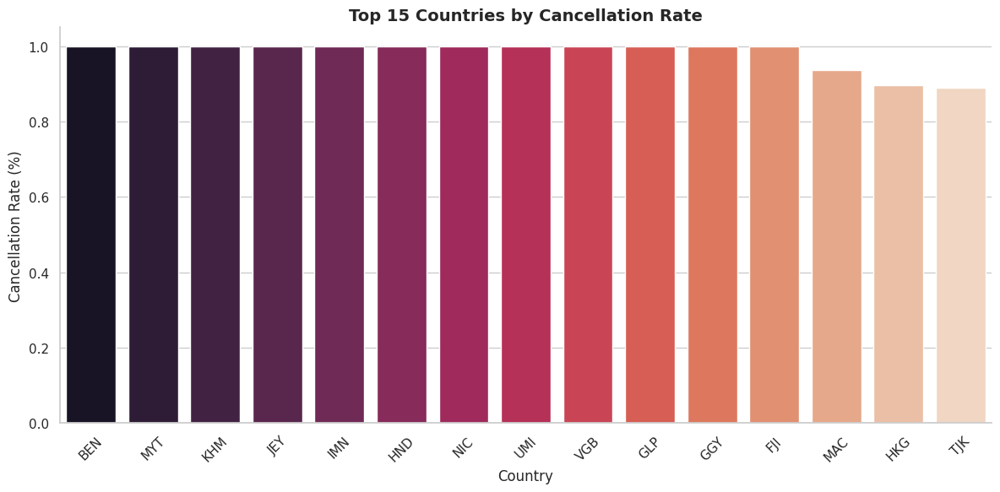

In [28]:
# Calculate cancellation rate per country
country_cancel = (
    df.groupby("country")["is_canceled"]
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=country_cancel.head(15),
    x="country",
    y="is_canceled",
    palette="rocket"
)
plt.title("Top 15 Countries by Cancellation Rate")
plt.ylabel("Cancellation Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
sns.despine()
plt.tight_layout()
plt.show()


/tmp/ipython-input-1595242639.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


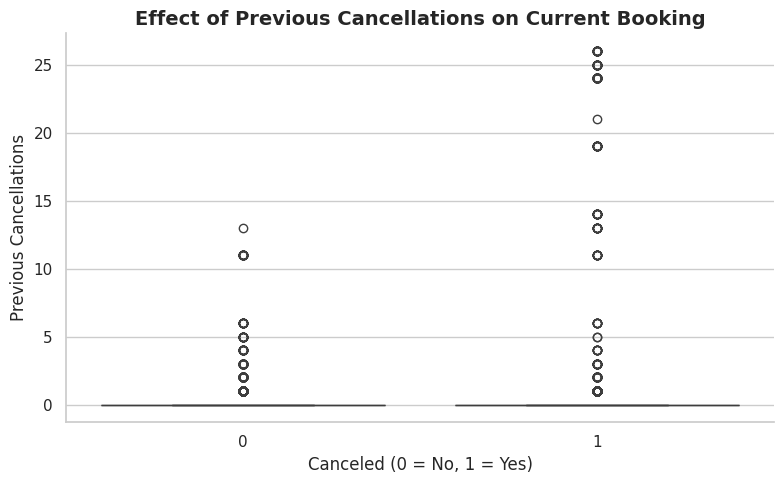

In [29]:
plt.figure(figsize=(8, 5))
sns.boxplot(
    data=df,
    x="is_canceled",
    y="previous_cancellations",
    palette="mako"
)
plt.title("Effect of Previous Cancellations on Current Booking")
plt.xlabel("Canceled (0 = No, 1 = Yes)")
plt.ylabel("Previous Cancellations")
sns.despine()
plt.tight_layout()
plt.show()


/tmp/ipython-input-1569066380.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


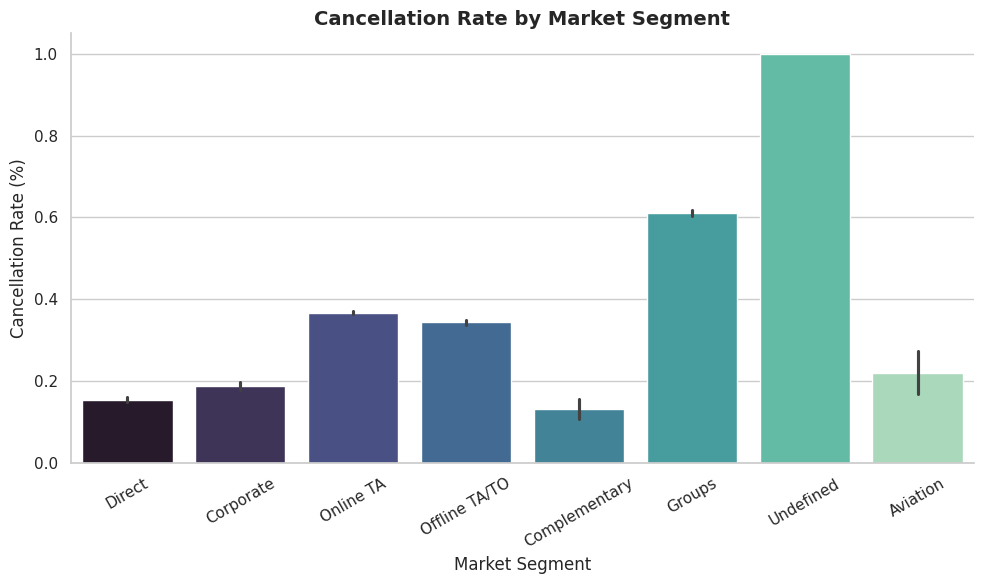

In [30]:
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df,
    x="market_segment",
    y="is_canceled",
    palette="mako"
)
plt.title("Cancellation Rate by Market Segment")
plt.ylabel("Cancellation Rate (%)")
plt.xlabel("Market Segment")
plt.xticks(rotation=30)
sns.despine()
plt.tight_layout()
plt.show()


/tmp/ipython-input-2003563775.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


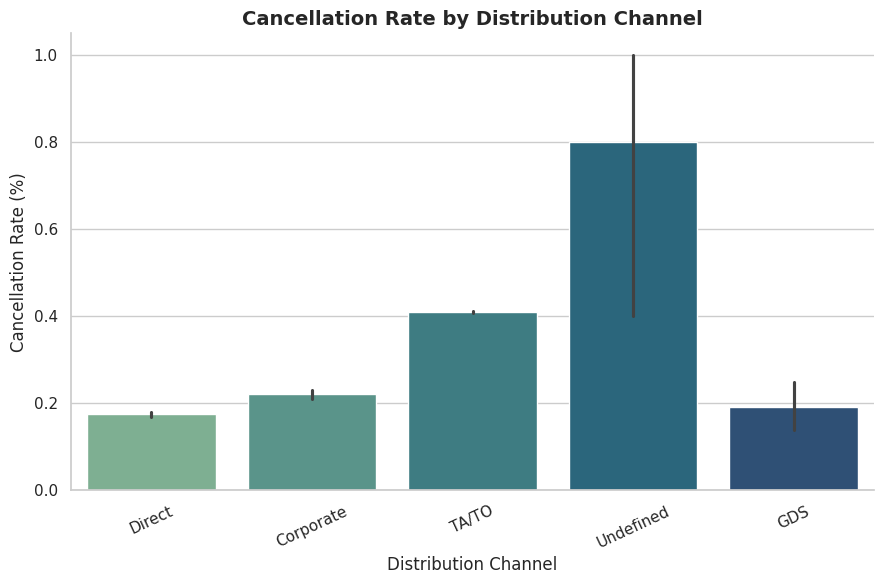

In [31]:
plt.figure(figsize=(9, 6))
sns.barplot(
    data=df,
    x="distribution_channel",
    y="is_canceled",
    palette="crest"
)
plt.title("Cancellation Rate by Distribution Channel")
plt.ylabel("Cancellation Rate (%)")
plt.xlabel("Distribution Channel")
plt.xticks(rotation=25)
sns.despine()
plt.tight_layout()
plt.show()


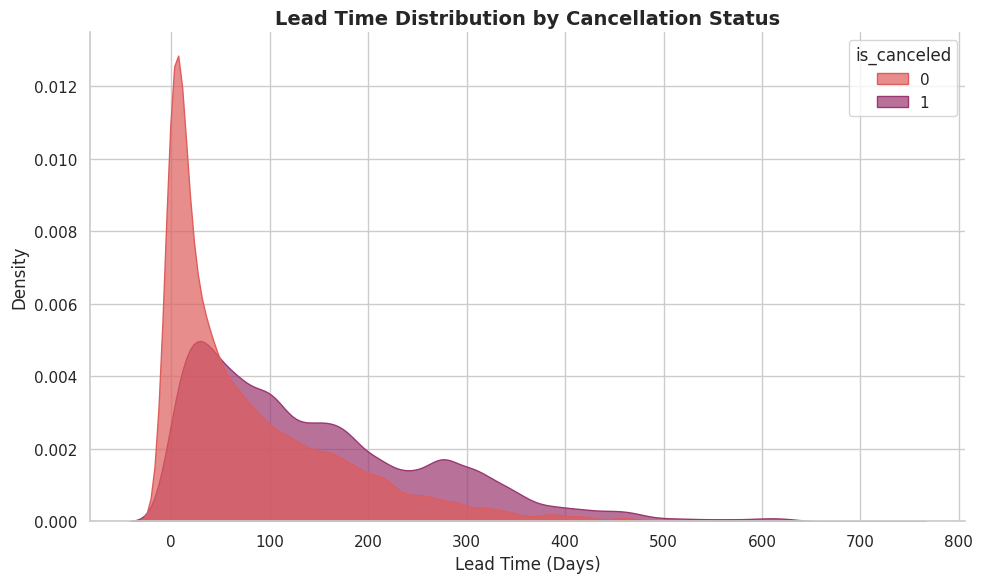

In [32]:
plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df,
    x="lead_time",
    hue="is_canceled",
    fill=True,
    common_norm=False,
    palette="flare",
    alpha=0.7
)
plt.title("Lead Time Distribution by Cancellation Status")
plt.xlabel("Lead Time (Days)")
plt.ylabel("Density")
sns.despine()
plt.tight_layout()
plt.show()


/tmp/ipython-input-644748010.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


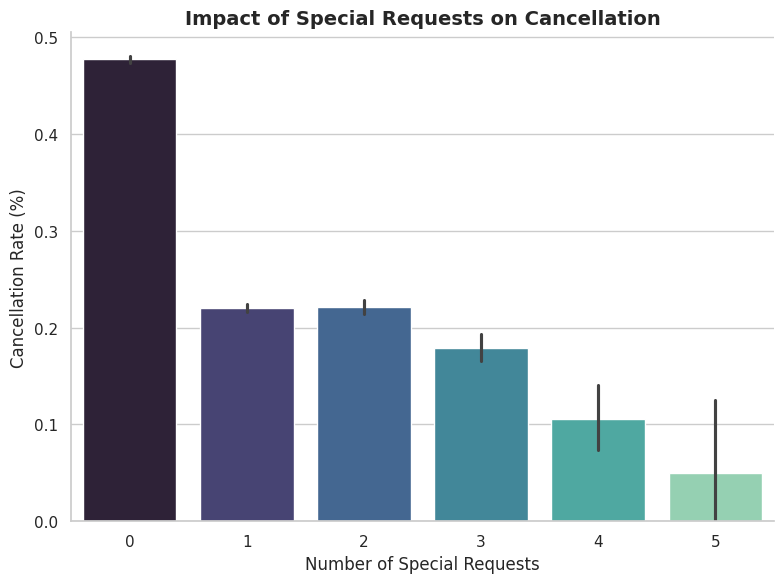

In [33]:
plt.figure(figsize=(8, 6))
sns.barplot(
    data=df,
    x="total_of_special_requests",
    y="is_canceled",
    palette="mako"
)
plt.title("Impact of Special Requests on Cancellation")
plt.xlabel("Number of Special Requests")
plt.ylabel("Cancellation Rate (%)")
sns.despine()
plt.tight_layout()
plt.show()


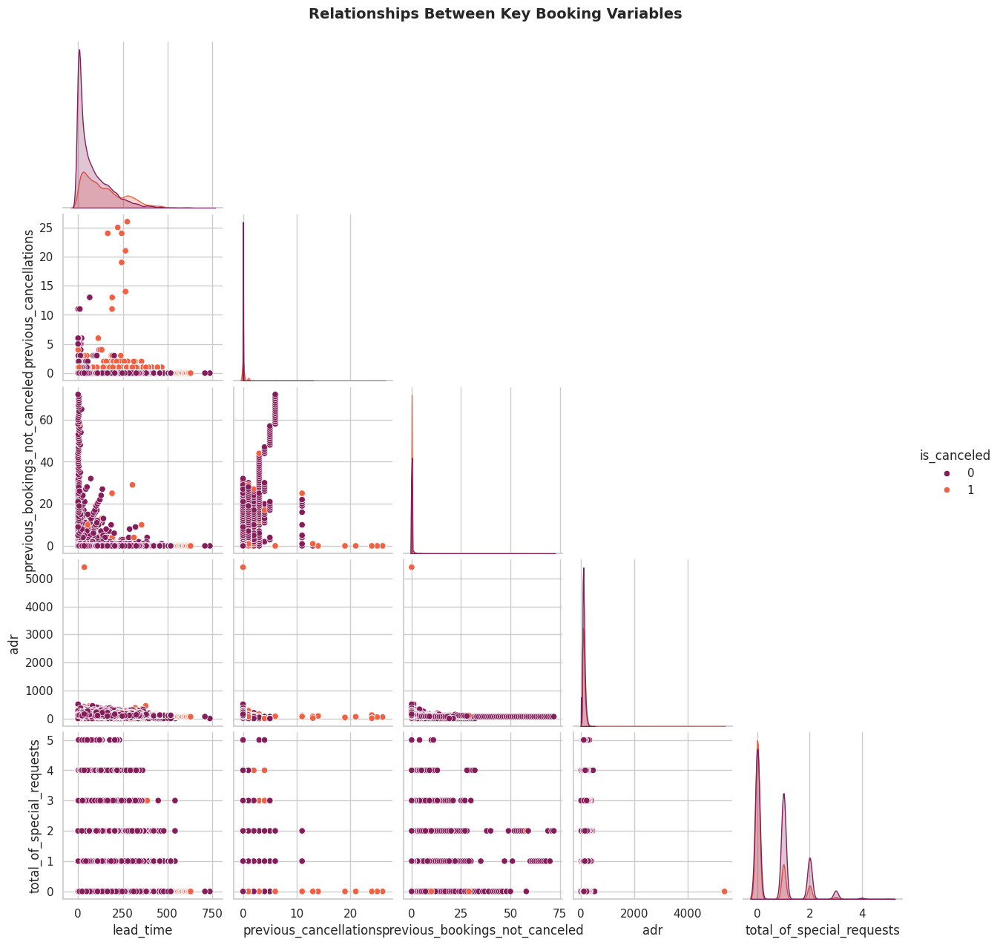

In [34]:
cols = [
    "lead_time",
    "previous_cancellations",
    "previous_bookings_not_canceled",
    "adr",
    "total_of_special_requests",
    "is_canceled",
]

sns.pairplot(
    df[cols],
    hue="is_canceled",
    palette="rocket",
    diag_kind="kde",
    corner=True,
)
plt.suptitle("Relationships Between Key Booking Variables", y=1.02, fontsize=14, fontweight="bold")
plt.show()


/tmp/ipython-input-1808668432.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x="is_canceled", palette="mako")


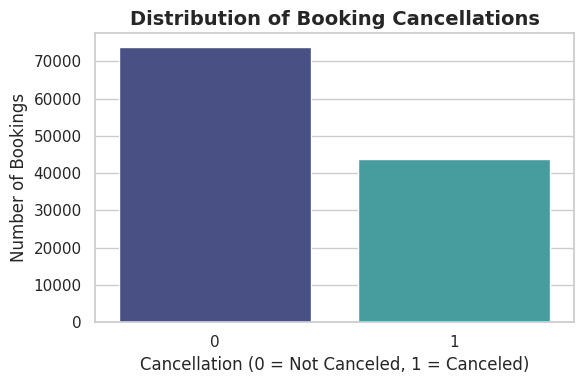

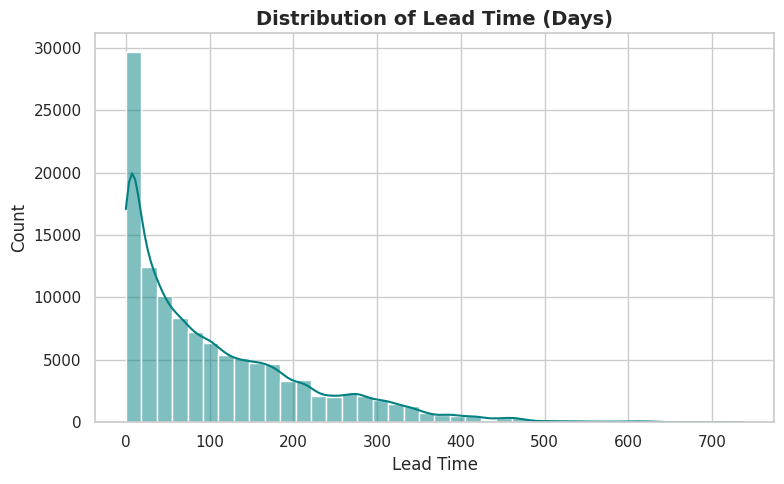

/tmp/ipython-input-1808668432.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="hotel", y="is_canceled", palette="mako")


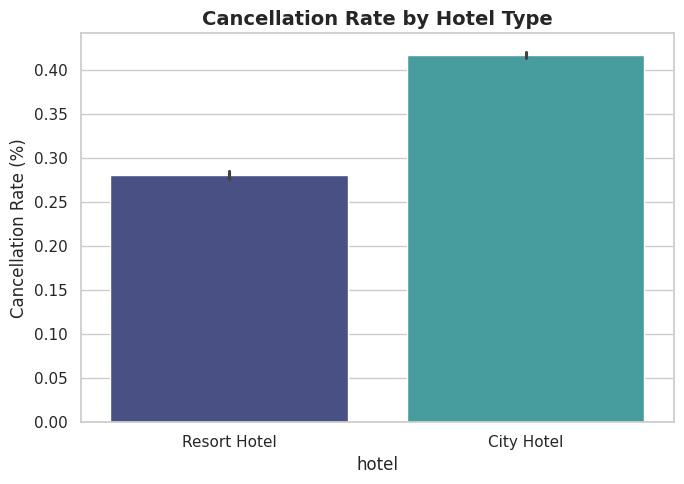

/tmp/ipython-input-1808668432.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="arrival_date_month", y="is_canceled", order=order, palette="rocket")


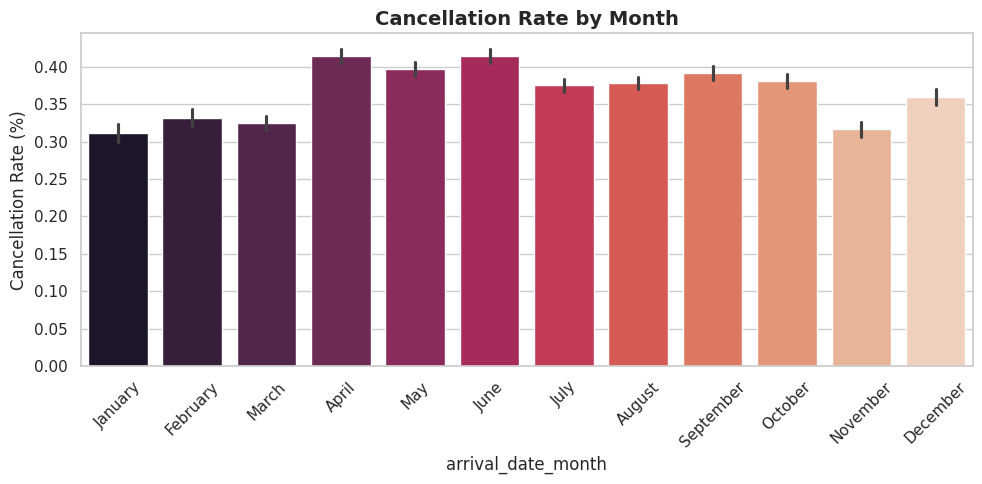

/tmp/ipython-input-1808668432.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="market_segment", y="is_canceled", palette="crest")


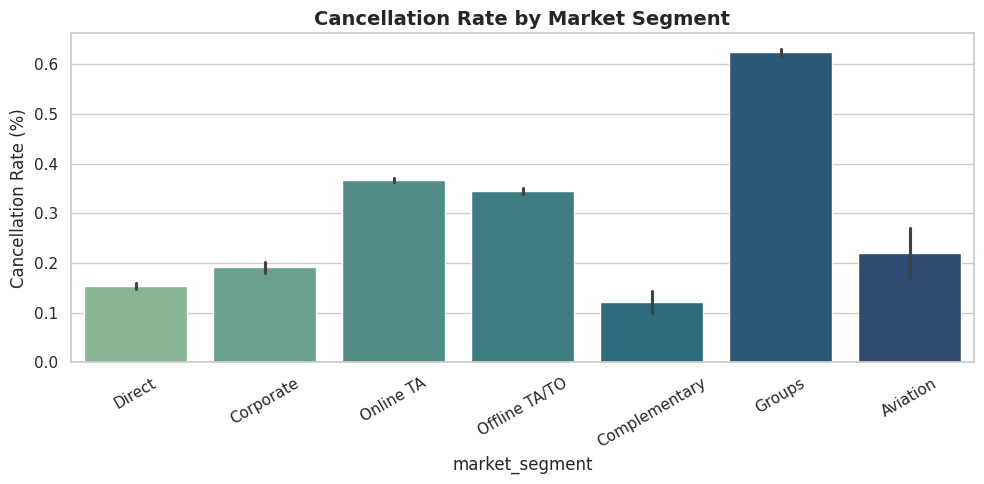

/tmp/ipython-input-1808668432.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="distribution_channel", y="is_canceled", palette="mako")


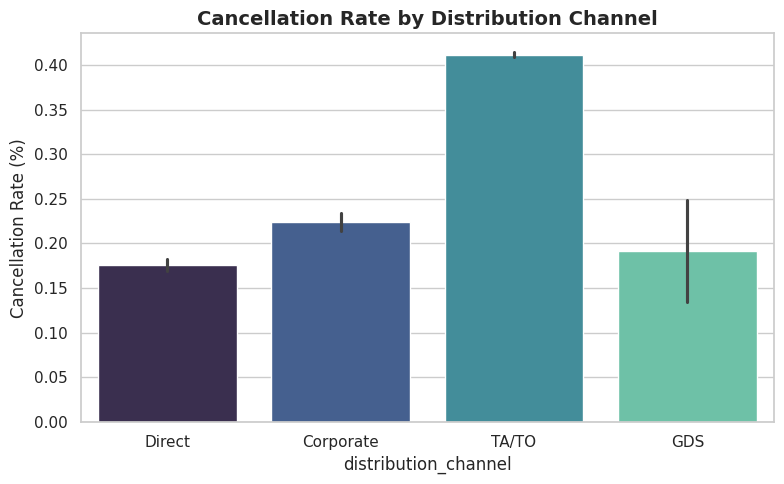

/tmp/ipython-input-1808668432.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="deposit_type", y="is_canceled", palette="flare")


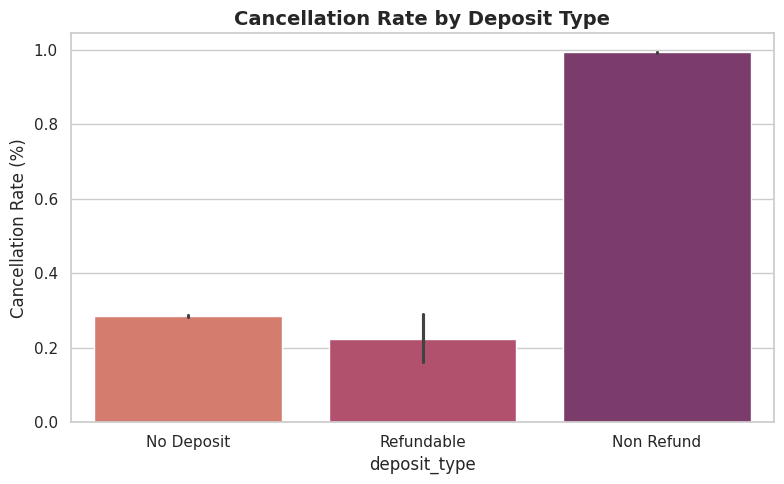

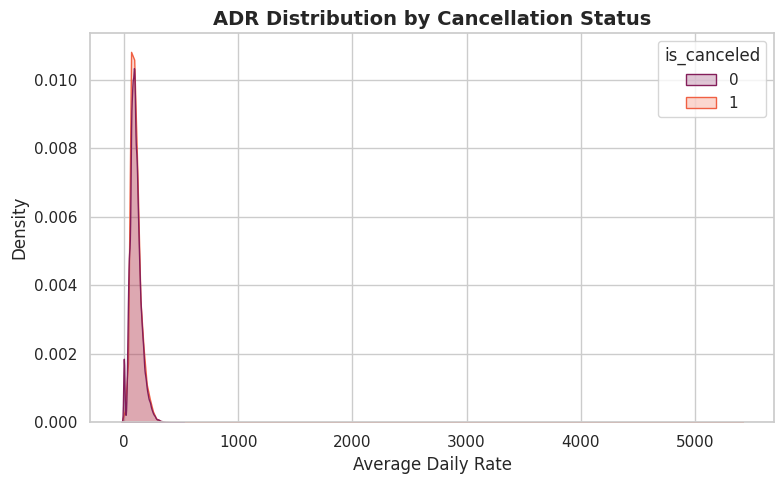

/tmp/ipython-input-1808668432.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="total_of_special_requests", y="is_canceled", palette="deep")


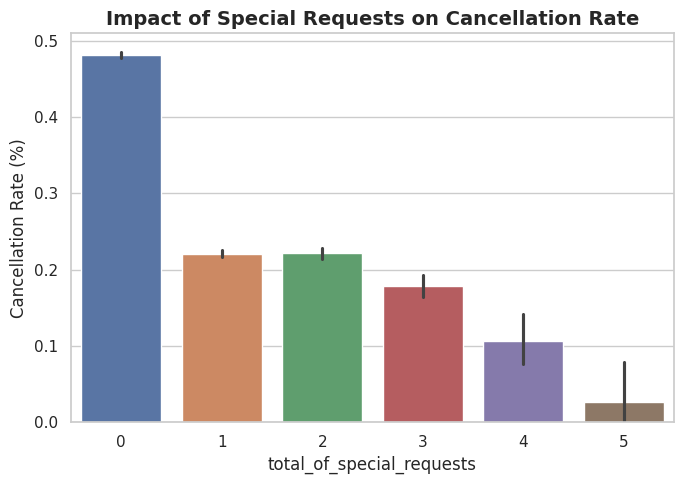

/tmp/ipython-input-1808668432.py:107: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="is_repeated_guest", y="is_canceled", palette="crest")


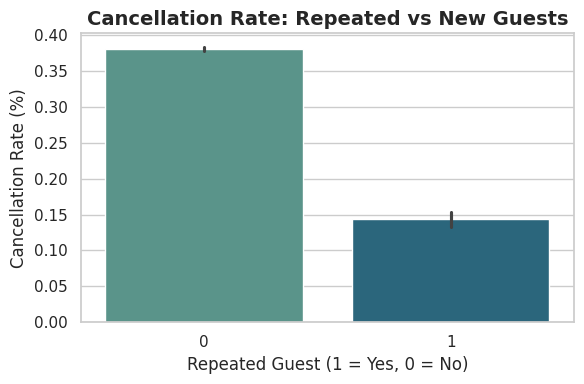

/tmp/ipython-input-1808668432.py:124: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=anomalies, x="country", y="is_canceled", palette="flare")


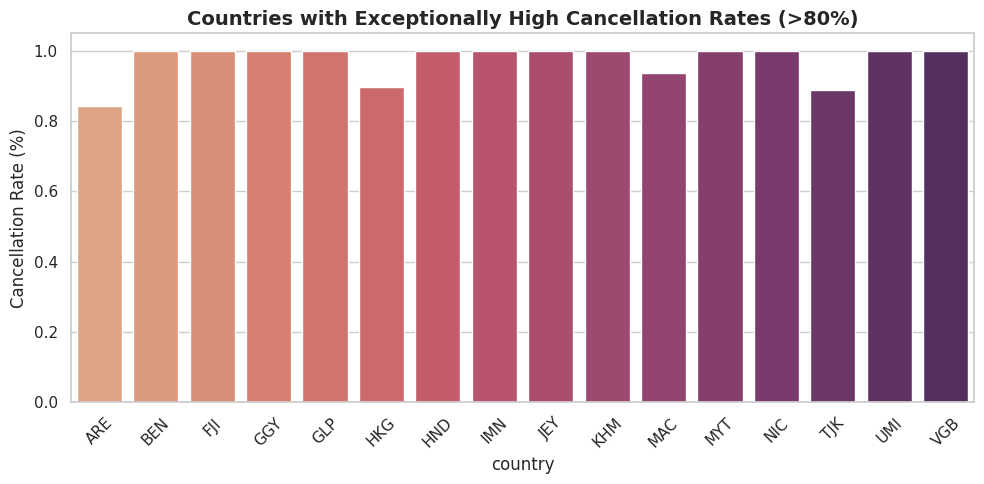

/tmp/ipython-input-1808668432.py:133: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="adr", palette="rocket")


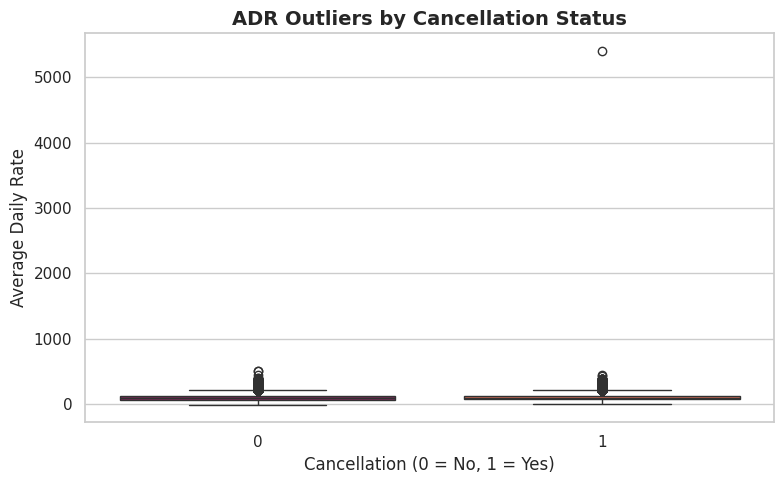

/tmp/ipython-input-1808668432.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="days_in_waiting_list", palette="mako")


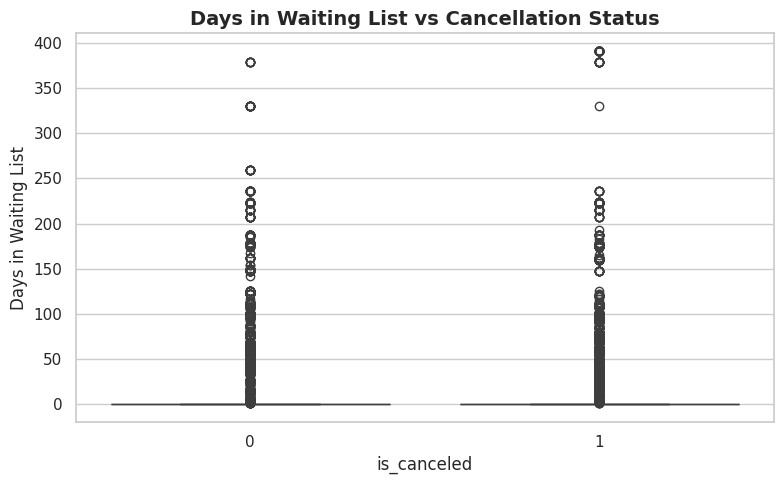

/tmp/ipython-input-1808668432.py:150: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="booking_changes", palette="crest")


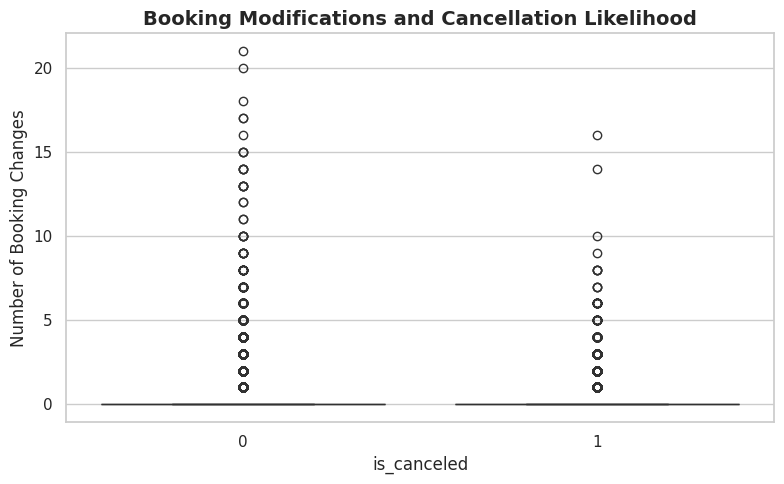

/tmp/ipython-input-1808668432.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="room_mismatch", y="is_canceled", palette="mako")


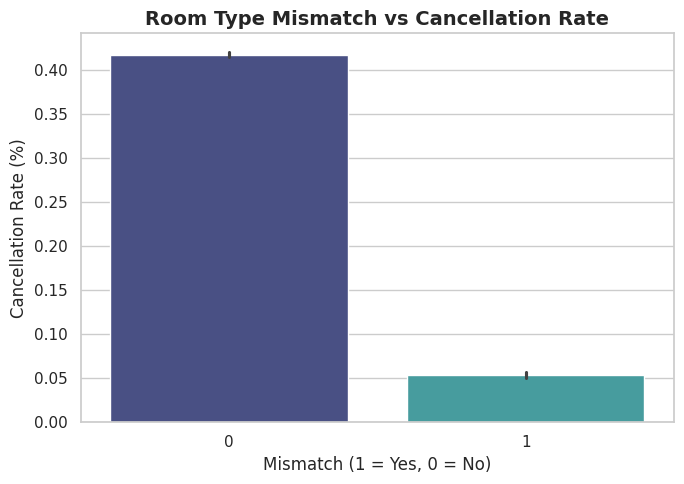

In [35]:
# 🎨 Set Global Aesthetics
# ==============================
sns.set_theme(style="whitegrid", palette="mako")
plt.rcParams.update({



    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "figure.titlesize": 16,
    "figure.facecolor": "white",
})

# ==============================
# 🧭 PART 1: UNDERSTANDING THE DATA
# ==============================

# Clean undefined or missing values
df = df.replace("Undefined", pd.NA)
df = df.dropna(subset=[
    "hotel", "arrival_date_month", "meal", "country",
    "market_segment", "distribution_channel",
    "deposit_type", "customer_type", "reservation_status"
])

# --- 1️⃣ Booking Cancellations Distribution ---
plt.figure(figsize=(6,4))
sns.countplot(data=df, x="is_canceled", palette="mako")
plt.title("Distribution of Booking Cancellations")
plt.xlabel("Cancellation (0 = Not Canceled, 1 = Canceled)")
plt.ylabel("Number of Bookings")
plt.tight_layout()
plt.show()

# --- 2️⃣ Lead Time Distribution ---
plt.figure(figsize=(8,5))
sns.histplot(data=df, x="lead_time", bins=40, kde=True, color="teal")
plt.title("Distribution of Lead Time (Days)")
plt.xlabel("Lead Time")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# --- 3️⃣ Cancellation Rate by Hotel Type ---
plt.figure(figsize=(7,5))
sns.barplot(data=df, x="hotel", y="is_canceled", palette="mako")
plt.title("Cancellation Rate by Hotel Type")
plt.ylabel("Cancellation Rate (%)")
plt.tight_layout()
plt.show()

# --- 4️⃣ Cancellation Rate by Month ---
plt.figure(figsize=(10,5))
order = ["January","February","March","April","May","June",
         "July","August","September","October","November","December"]
sns.barplot(data=df, x="arrival_date_month", y="is_canceled", order=order, palette="rocket")
plt.title("Cancellation Rate by Month")
plt.ylabel("Cancellation Rate (%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- 5️⃣ Market Segment vs Cancellation ---
plt.figure(figsize=(10,5))
sns.barplot(data=df, x="market_segment", y="is_canceled", palette="crest")
plt.title("Cancellation Rate by Market Segment")
plt.ylabel("Cancellation Rate (%)")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

# --- 6️⃣ Distribution Channel vs Cancellation ---
plt.figure(figsize=(8,5))
sns.barplot(data=df, x="distribution_channel", y="is_canceled", palette="mako")
plt.title("Cancellation Rate by Distribution Channel")
plt.ylabel("Cancellation Rate (%)")
plt.tight_layout()
plt.show()

# --- 7️⃣ Effect of Deposit Type ---
plt.figure(figsize=(8,5))
sns.barplot(data=df, x="deposit_type", y="is_canceled", palette="flare")
plt.title("Cancellation Rate by Deposit Type")
plt.ylabel("Cancellation Rate (%)")
plt.tight_layout()
plt.show()

# --- 8️⃣ Relationship Between ADR and Cancellation ---
plt.figure(figsize=(8,5))
sns.kdeplot(data=df, x="adr", hue="is_canceled", fill=True, common_norm=False, palette="rocket")
plt.title("ADR Distribution by Cancellation Status")
plt.xlabel("Average Daily Rate")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

# --- 9️⃣ Relationship Between Total Special Requests and Cancellation ---
plt.figure(figsize=(7,5))
sns.barplot(data=df, x="total_of_special_requests", y="is_canceled", palette="deep")
plt.title("Impact of Special Requests on Cancellation Rate")
plt.ylabel("Cancellation Rate (%)")
plt.tight_layout()
plt.show()

# --- 🔟 Repeated Guests vs Cancellation ---
plt.figure(figsize=(6,4))
sns.barplot(data=df, x="is_repeated_guest", y="is_canceled", palette="crest")
plt.title("Cancellation Rate: Repeated vs New Guests")
plt.ylabel("Cancellation Rate (%)")
plt.xlabel("Repeated Guest (1 = Yes, 0 = No)")
plt.tight_layout()
plt.show()


# ==============================
# 🔍 PART 2: EXPLORING ANOMALIES
# ==============================

# --- 1️⃣ Countries with Extremely High Cancellation ---
country_cancel = df.groupby("country")["is_canceled"].mean().reset_index()
anomalies = country_cancel[country_cancel["is_canceled"] > 0.8]

plt.figure(figsize=(10,5))
sns.barplot(data=anomalies, x="country", y="is_canceled", palette="flare")
plt.title("Countries with Exceptionally High Cancellation Rates (>80%)")
plt.ylabel("Cancellation Rate (%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- 2️⃣ Outliers in ADR (Unusually Expensive Bookings) ---
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="is_canceled", y="adr", palette="rocket")
plt.title("ADR Outliers by Cancellation Status")
plt.ylabel("Average Daily Rate")
plt.xlabel("Cancellation (0 = No, 1 = Yes)")
plt.tight_layout()
plt.show()

# --- 3️⃣ Long Waitlist Bookings vs Cancellation ---
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="is_canceled", y="days_in_waiting_list", palette="mako")
plt.title("Days in Waiting List vs Cancellation Status")
plt.ylabel("Days in Waiting List")
plt.tight_layout()
plt.show()

# --- 4️⃣ Booking Changes vs Cancellation ---
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="is_canceled", y="booking_changes", palette="crest")
plt.title("Booking Modifications and Cancellation Likelihood")
plt.ylabel("Number of Booking Changes")
plt.tight_layout()
plt.show()

# --- 5️⃣ Room Type Mismatch (Reserved vs Assigned) ---
mismatch = (df["reserved_room_type"] != df["assigned_room_type"]).astype(int)
df["room_mismatch"] = mismatch

plt.figure(figsize=(7,5))
sns.barplot(data=df, x="room_mismatch", y="is_canceled", palette="mako")
plt.title("Room Type Mismatch vs Cancellation Rate")
plt.xlabel("Mismatch (1 = Yes, 0 = No)")
plt.ylabel("Cancellation Rate (%)")
plt.tight_layout()
plt.show()


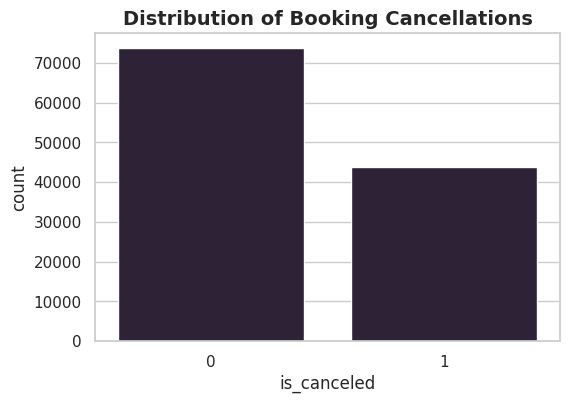

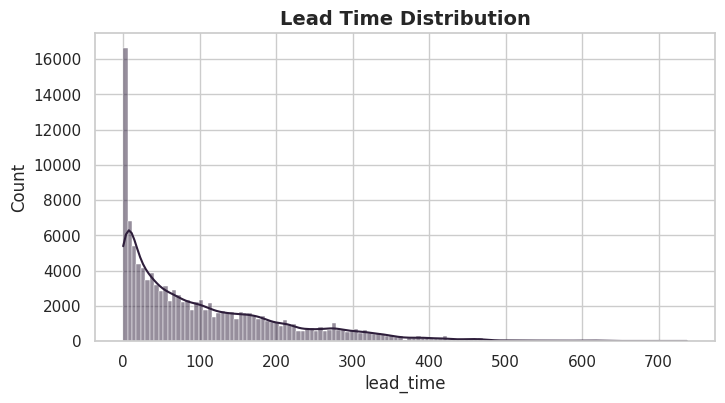

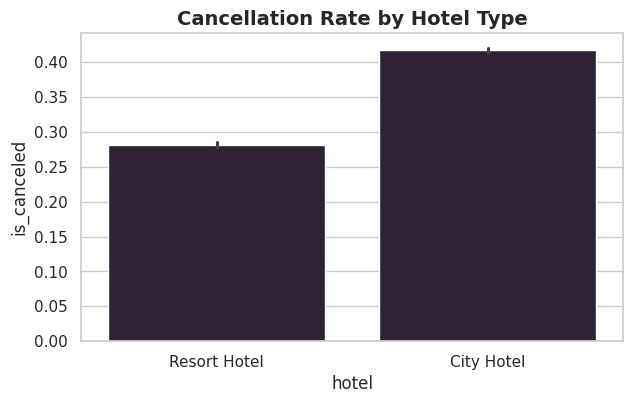

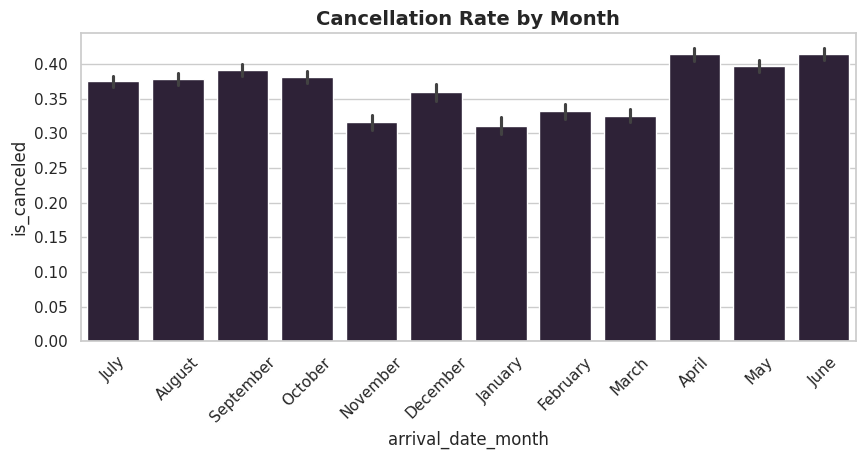

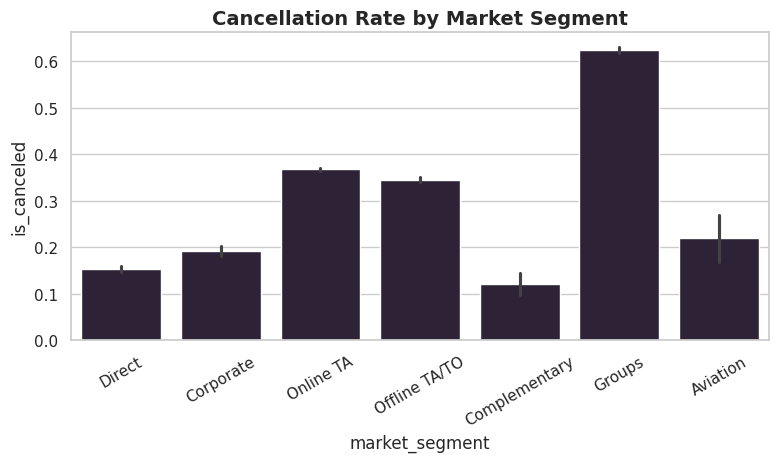

...

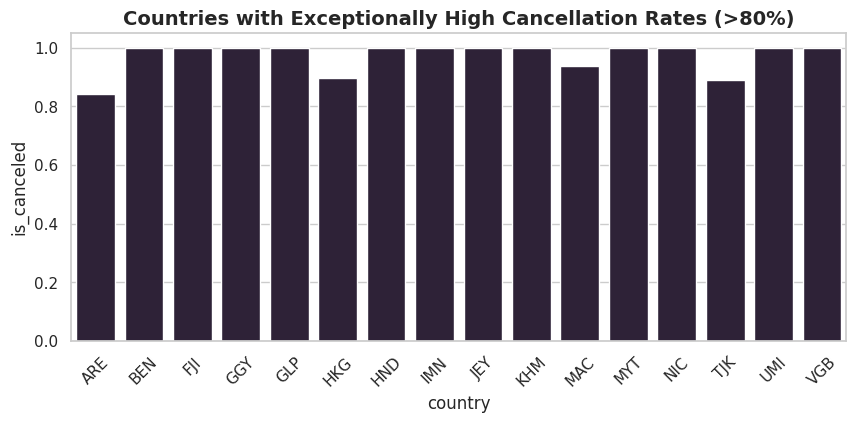

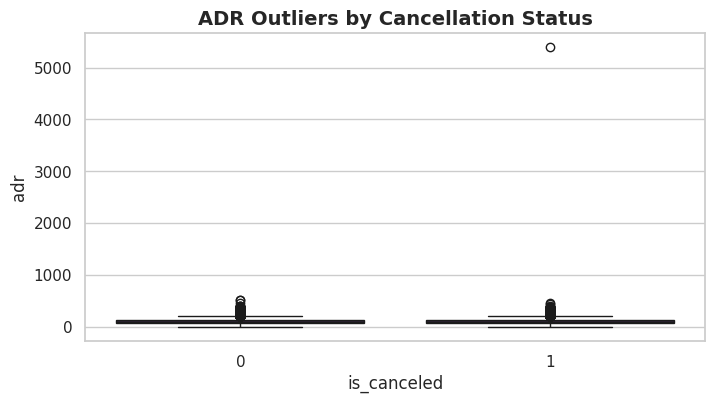

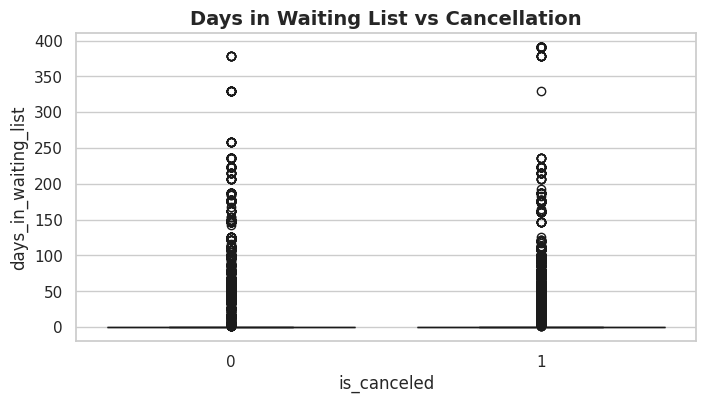

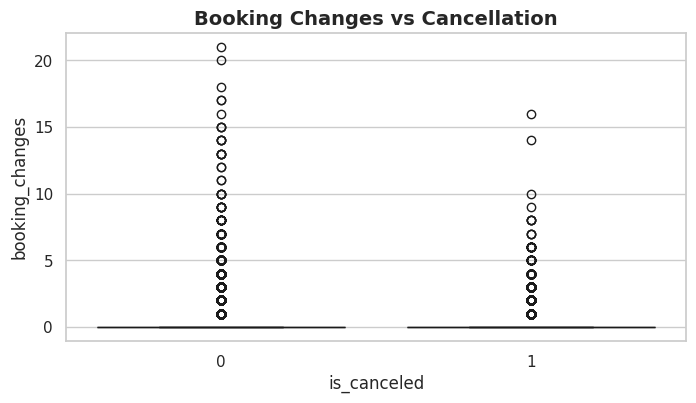

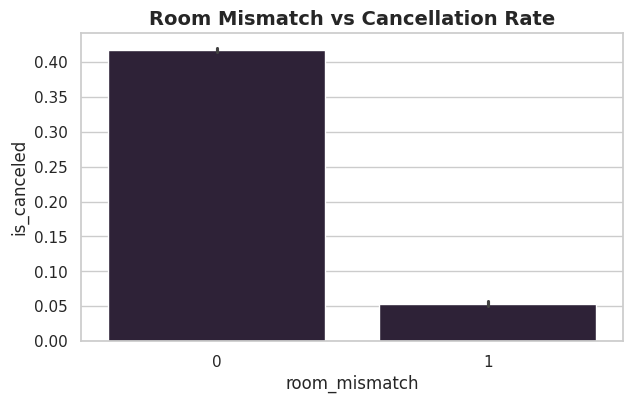

In [36]:

# ==============================
# Data Cleaning
# ==============================
# Replace undefined with NaN and drop missing values in categorical columns
df = df.replace("Undefined", pd.NA)
df = df.dropna(subset=[
    "hotel", "arrival_date_month", "meal", "country",
    "market_segment", "distribution_channel",
    "deposit_type", "customer_type", "reservation_status"
])

# ==============================
# PART 1: UNDERSTANDING THE DATA
# ==============================

# 1. Cancellation distribution
plt.figure(figsize=(6,4))
sns.countplot(data=df, x="is_canceled")
plt.title("Distribution of Booking Cancellations")
plt.show()

# 2. Lead time distribution
plt.figure(figsize=(8,4))
sns.histplot(data=df, x="lead_time", kde=True)
plt.title("Lead Time Distribution")
plt.show()

# 3. Cancellation rate by hotel type
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="hotel", y="is_canceled")
plt.title("Cancellation Rate by Hotel Type")
plt.show()

# 4. Cancellation rate by month
plt.figure(figsize=(10,4))
sns.barplot(data=df, x="arrival_date_month", y="is_canceled")
plt.title("Cancellation Rate by Month")
plt.xticks(rotation=45)
plt.show()

# 5. Cancellation rate by market segment
plt.figure(figsize=(9,4))
sns.barplot(data=df, x="market_segment", y="is_canceled")
plt.title("Cancellation Rate by Market Segment")
plt.xticks(rotation=30)
plt.show()

# 6. Cancellation rate by distribution channel
plt.figure(figsize=(8,4))
sns.barplot(data=df, x="distribution_channel", y="is_canceled")
plt.title("Cancellation Rate by Distribution Channel")
plt.show()

# 7. Effect of deposit type
plt.figure(figsize=(8,4))
sns.barplot(data=df, x="deposit_type", y="is_canceled")
plt.title("Cancellation Rate by Deposit Type")
plt.show()

# 8. ADR vs cancellation
plt.figure(figsize=(8,4))
sns.kdeplot(data=df, x="adr", hue="is_canceled", fill=True)
plt.title("ADR Distribution by Cancellation Status")
plt.show()

# 9. Total special requests vs cancellation
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="total_of_special_requests", y="is_canceled")
plt.title("Special Requests vs Cancellation")
plt.show()

# 10. Repeated guests vs cancellation
plt.figure(figsize=(6,4))
sns.barplot(data=df, x="is_repeated_guest", y="is_canceled")
plt.title("Repeated Guests vs Cancellation")
plt.show()


# ==============================
# PART 2: EXPLORING ANOMALIES
# ==============================

# 1. Countries with very high cancellation
country_cancel = df.groupby("country")["is_canceled"].mean().reset_index()
anomalies = country_cancel[country_cancel["is_canceled"] > 0.8]

plt.figure(figsize=(10,4))
sns.barplot(data=anomalies, x="country", y="is_canceled")
plt.title("Countries with Exceptionally High Cancellation Rates (>80%)")
plt.xticks(rotation=45)
plt.show()

# 2. Outliers in ADR (very high rates)
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="adr")
plt.title("ADR Outliers by Cancellation Status")
plt.show()

# 3. Days in waiting list vs cancellation
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="days_in_waiting_list")
plt.title("Days in Waiting List vs Cancellation")
plt.show()

# 4. Booking changes vs cancellation
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="booking_changes")
plt.title("Booking Changes vs Cancellation")
plt.show()

# 5. Room mismatch (reserved vs assigned)
df["room_mismatch"] = (df["reserved_room_type"] != df["assigned_room_type"]).astype(int)
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="room_mismatch", y="is_canceled")
plt.title("Room Mismatch vs Cancellation Rate")
plt.show()


/tmp/ipython-input-2592429247.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x="is_canceled", palette="mako")


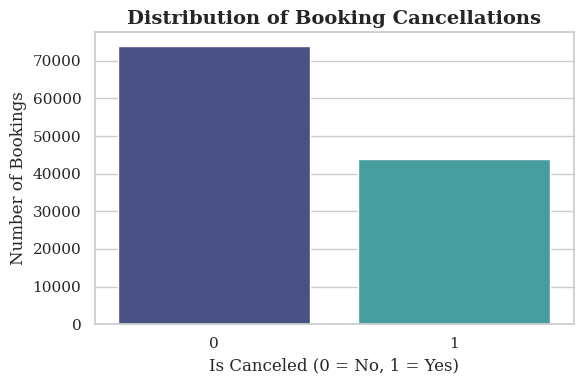

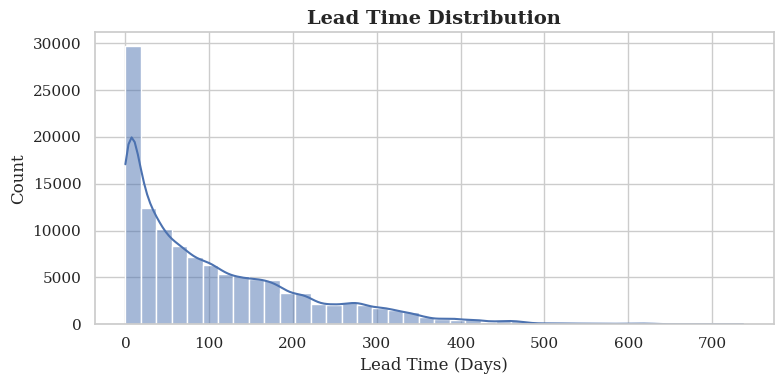

/tmp/ipython-input-2592429247.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="hotel", y="is_canceled", palette="crest")


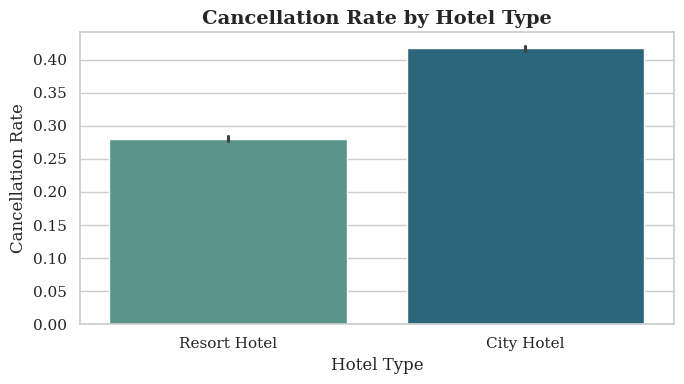

/tmp/ipython-input-2592429247.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="arrival_date_month", y="is_canceled", order=order, palette="rocket")


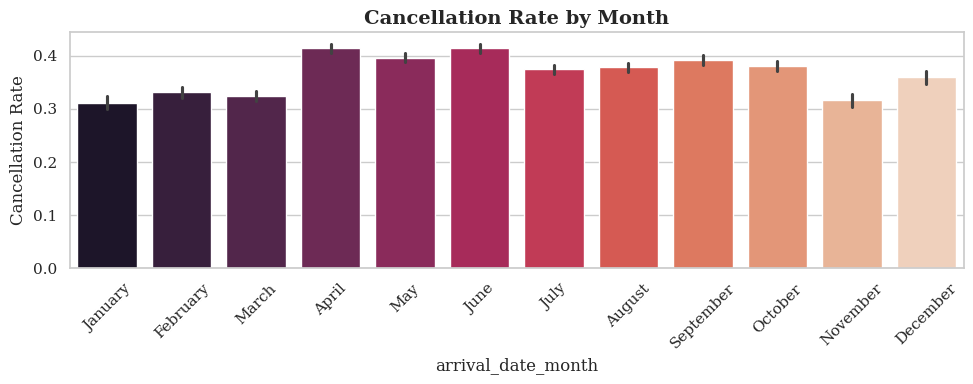

/tmp/ipython-input-2592429247.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="market_segment", y="is_canceled", palette="crest")


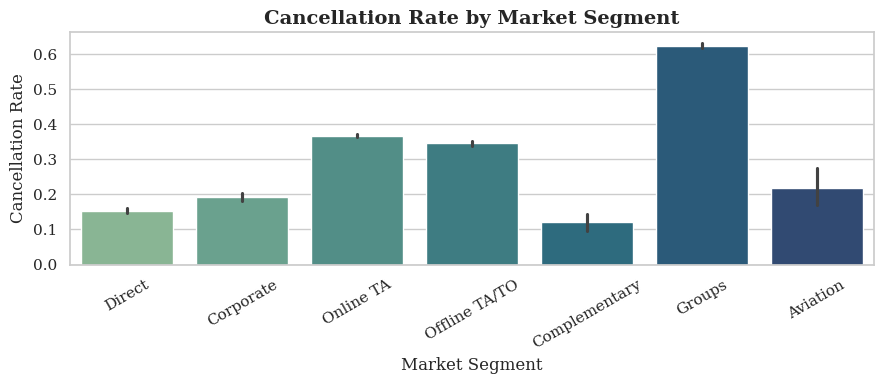

/tmp/ipython-input-2592429247.py:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="distribution_channel", y="is_canceled", palette="mako")


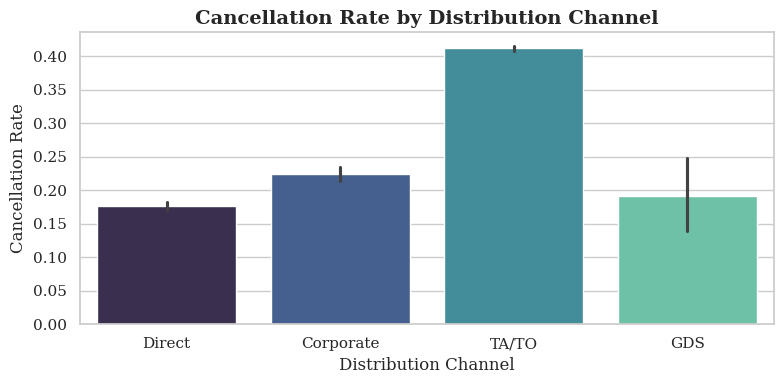

/tmp/ipython-input-2592429247.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="deposit_type", y="is_canceled", palette="flare")


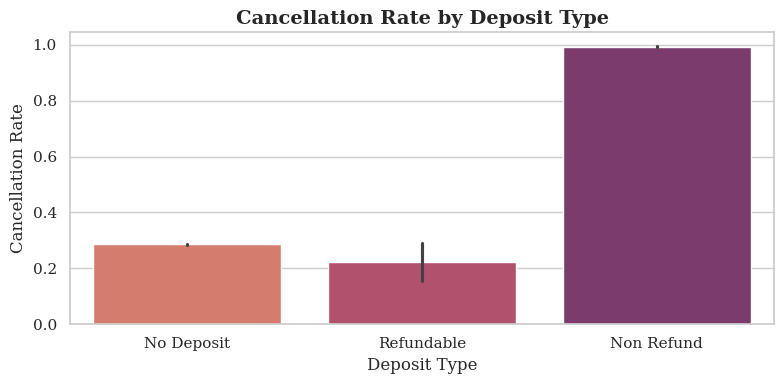

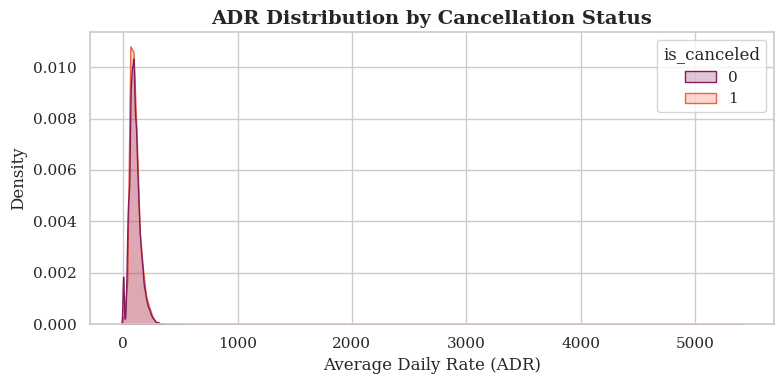

/tmp/ipython-input-2592429247.py:106: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="total_of_special_requests", y="is_canceled", palette="deep")


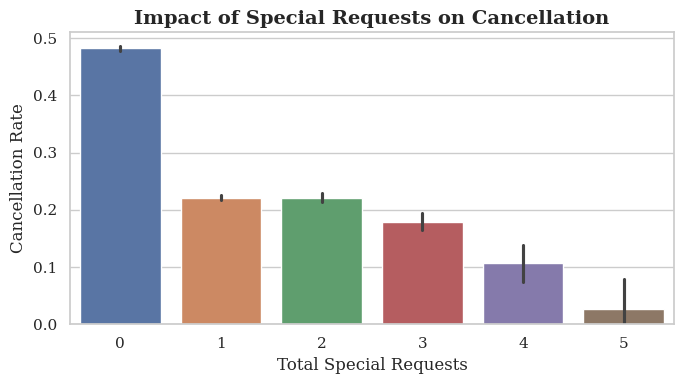

/tmp/ipython-input-2592429247.py:115: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="is_repeated_guest", y="is_canceled", palette="crest")


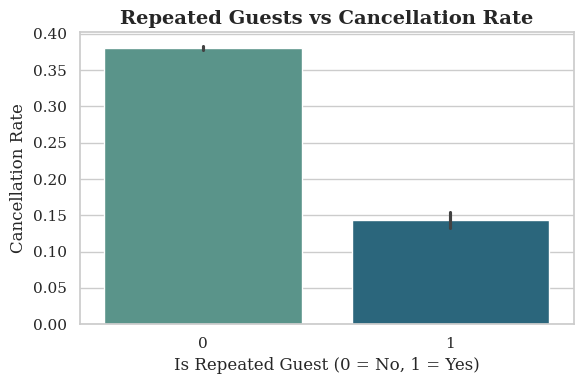

/tmp/ipython-input-2592429247.py:132: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=anomalies, x="country", y="is_canceled", palette="flare")


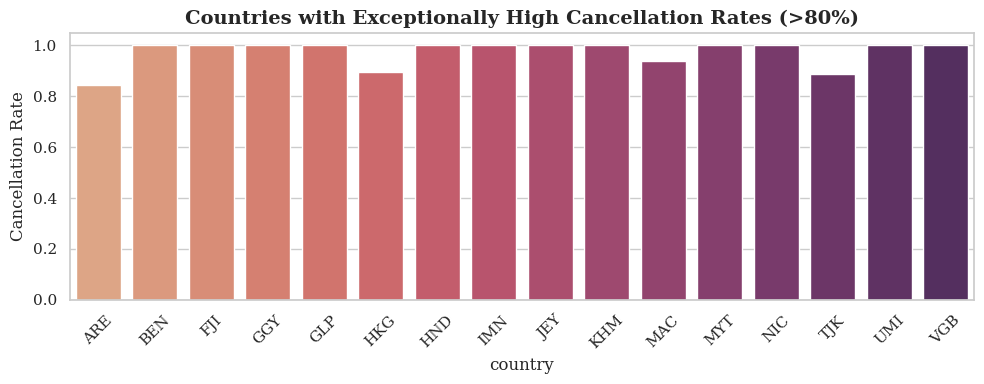

/tmp/ipython-input-2592429247.py:141: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="adr", palette="rocket")


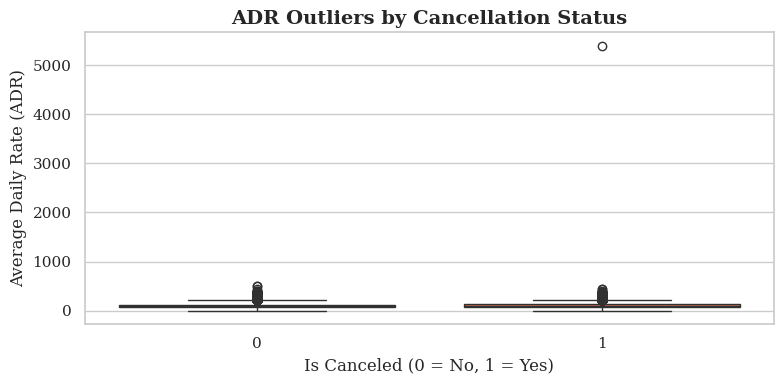

/tmp/ipython-input-2592429247.py:150: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="days_in_waiting_list", palette="rocket")


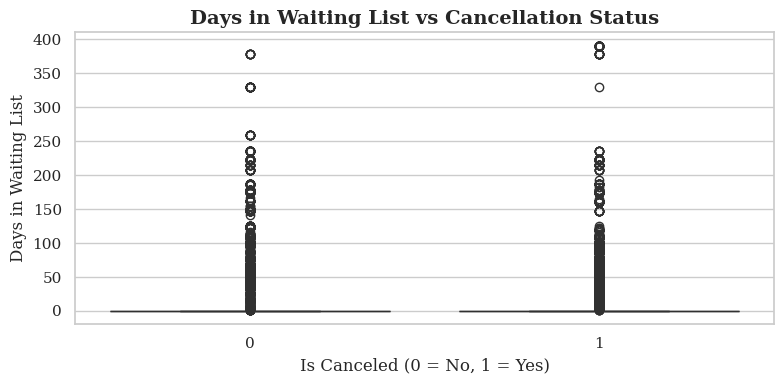

/tmp/ipython-input-2592429247.py:159: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="is_canceled", y="booking_changes", palette="crest")


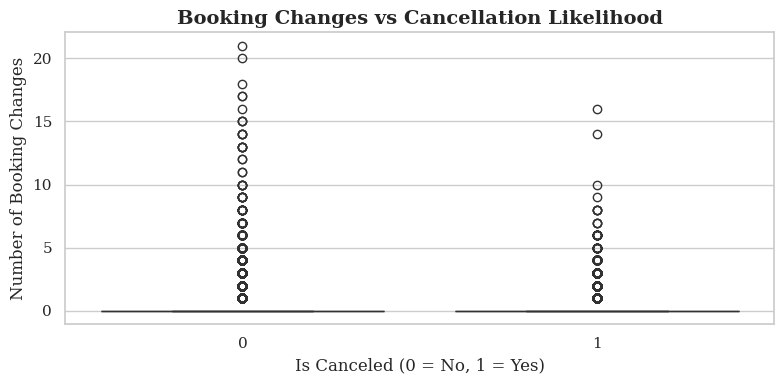

/tmp/ipython-input-2592429247.py:169: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="room_mismatch", y="is_canceled", palette="mako")


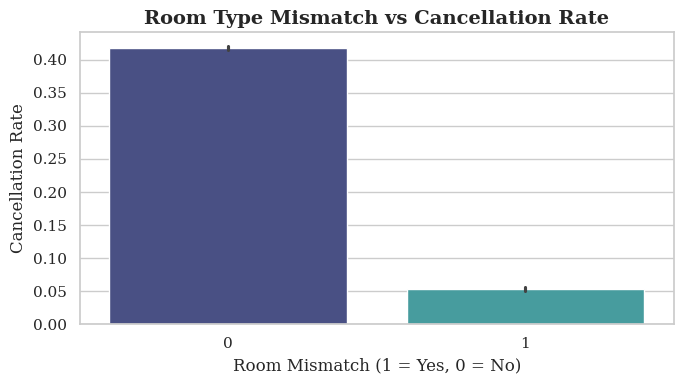

In [37]:
# ==============================
# 🎨 Global Style Configuration
# ==============================
sns.set_theme(style="whitegrid")
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "DejaVu Serif", "serif"],
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "figure.titlesize": 16,
    "figure.facecolor": "white",
    "axes.titleweight": "bold"
})

# ==============================
# 🧹 Data Cleaning
# ==============================
df = df.replace("Undefined", pd.NA)
df = df.dropna(subset=[
    "hotel", "arrival_date_month", "meal", "country",
    "market_segment", "distribution_channel",
    "deposit_type", "customer_type", "reservation_status"
])

# ==============================
# 🧭 PART 1: UNDERSTANDING THE DATA
# ==============================

# 1️⃣ Cancellation Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=df, x="is_canceled", palette="mako")
plt.title("Distribution of Booking Cancellations")
plt.xlabel("Is Canceled (0 = No, 1 = Yes)")
plt.ylabel("Number of Bookings")
plt.tight_layout()
plt.show()

# 2️⃣ Lead Time Distribution
plt.figure(figsize=(8,4))
sns.histplot(data=df, x="lead_time", bins=40, kde=True, color="#4C72B0")
plt.title("Lead Time Distribution")
plt.xlabel("Lead Time (Days)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# 3️⃣ Cancellation Rate by Hotel Type
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="hotel", y="is_canceled", palette="crest")
plt.title("Cancellation Rate by Hotel Type")
plt.ylabel("Cancellation Rate")
plt.xlabel("Hotel Type")
plt.tight_layout()
plt.show()

# 4️⃣ Cancellation Rate by Month
plt.figure(figsize=(10,4))
order = ["January","February","March","April","May","June","July",
         "August","September","October","November","December"]
sns.barplot(data=df, x="arrival_date_month", y="is_canceled", order=order, palette="rocket")
plt.title("Cancellation Rate by Month")
plt.ylabel("Cancellation Rate")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5️⃣ Cancellation Rate by Market Segment
plt.figure(figsize=(9,4))
sns.barplot(data=df, x="market_segment", y="is_canceled", palette="crest")
plt.title("Cancellation Rate by Market Segment")
plt.ylabel("Cancellation Rate")
plt.xlabel("Market Segment")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

# 6️⃣ Cancellation Rate by Distribution Channel
plt.figure(figsize=(8,4))
sns.barplot(data=df, x="distribution_channel", y="is_canceled", palette="mako")
plt.title("Cancellation Rate by Distribution Channel")
plt.ylabel("Cancellation Rate")
plt.xlabel("Distribution Channel")
plt.tight_layout()
plt.show()

# 7️⃣ Effect of Deposit Type
plt.figure(figsize=(8,4))
sns.barplot(data=df, x="deposit_type", y="is_canceled", palette="flare")
plt.title("Cancellation Rate by Deposit Type")
plt.ylabel("Cancellation Rate")
plt.xlabel("Deposit Type")
plt.tight_layout()
plt.show()

# 8️⃣ ADR Distribution by Cancellation Status
plt.figure(figsize=(8,4))
sns.kdeplot(data=df, x="adr", hue="is_canceled", fill=True, common_norm=False, palette="rocket")
plt.title("ADR Distribution by Cancellation Status")
plt.xlabel("Average Daily Rate (ADR)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

# 9️⃣ Special Requests vs Cancellation
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="total_of_special_requests", y="is_canceled", palette="deep")
plt.title("Impact of Special Requests on Cancellation")
plt.ylabel("Cancellation Rate")
plt.xlabel("Total Special Requests")
plt.tight_layout()
plt.show()

# 🔟 Repeated Guests vs Cancellation
plt.figure(figsize=(6,4))
sns.barplot(data=df, x="is_repeated_guest", y="is_canceled", palette="crest")
plt.title("Repeated Guests vs Cancellation Rate")
plt.xlabel("Is Repeated Guest (0 = No, 1 = Yes)")
plt.ylabel("Cancellation Rate")
plt.tight_layout()
plt.show()


# ==============================
# 🔍 PART 2: EXPLORING ANOMALIES
# ==============================

# 1️⃣ Countries with Exceptionally High Cancellations
country_cancel = df.groupby("country")["is_canceled"].mean().reset_index()
anomalies = country_cancel[country_cancel["is_canceled"] > 0.8]

plt.figure(figsize=(10,4))
sns.barplot(data=anomalies, x="country", y="is_canceled", palette="flare")
plt.title("Countries with Exceptionally High Cancellation Rates (>80%)")
plt.ylabel("Cancellation Rate")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2️⃣ ADR Outliers by Cancellation Status
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="adr", palette="rocket")
plt.title("ADR Outliers by Cancellation Status")
plt.xlabel("Is Canceled (0 = No, 1 = Yes)")
plt.ylabel("Average Daily Rate (ADR)")
plt.tight_layout()
plt.show()

# 3️⃣ Days in Waiting List vs Cancellation
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="days_in_waiting_list", palette="rocket")
plt.title("Days in Waiting List vs Cancellation Status")
plt.xlabel("Is Canceled (0 = No, 1 = Yes)")
plt.ylabel("Days in Waiting List")
plt.tight_layout()
plt.show()

# 4️⃣ Booking Changes vs Cancellation
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x="is_canceled", y="booking_changes", palette="crest")
plt.title("Booking Changes vs Cancellation Likelihood")
plt.xlabel("Is Canceled (0 = No, 1 = Yes)")
plt.ylabel("Number of Booking Changes")
plt.tight_layout()
plt.show()

# 5️⃣ Room Type Mismatch vs Cancellation
df["room_mismatch"] = (df["reserved_room_type"] != df["assigned_room_type"]).astype(int)
plt.figure(figsize=(7,4))
sns.barplot(data=df, x="room_mismatch", y="is_canceled", palette="mako")
plt.title("Room Type Mismatch vs Cancellation Rate")
plt.xlabel("Room Mismatch (1 = Yes, 0 = No)")
plt.ylabel("Cancellation Rate")
plt.tight_layout()
plt.show()


/tmp/ipython-input-264574265.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, x="is_canceled", palette="deep")


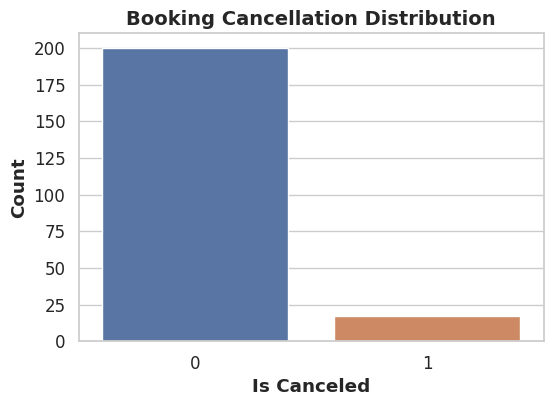

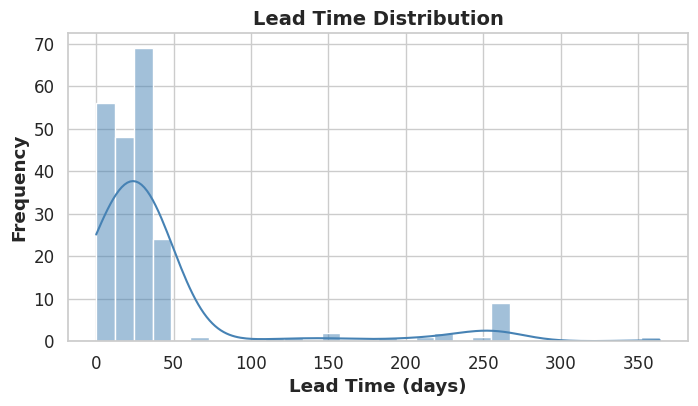

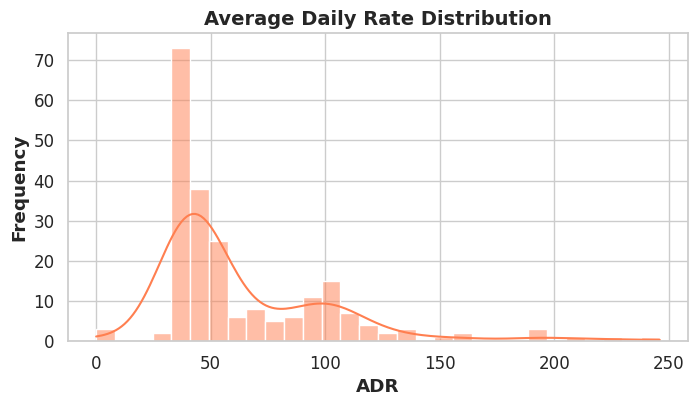

/tmp/ipython-input-264574265.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_clean, x="arrival_date_month", palette="muted")


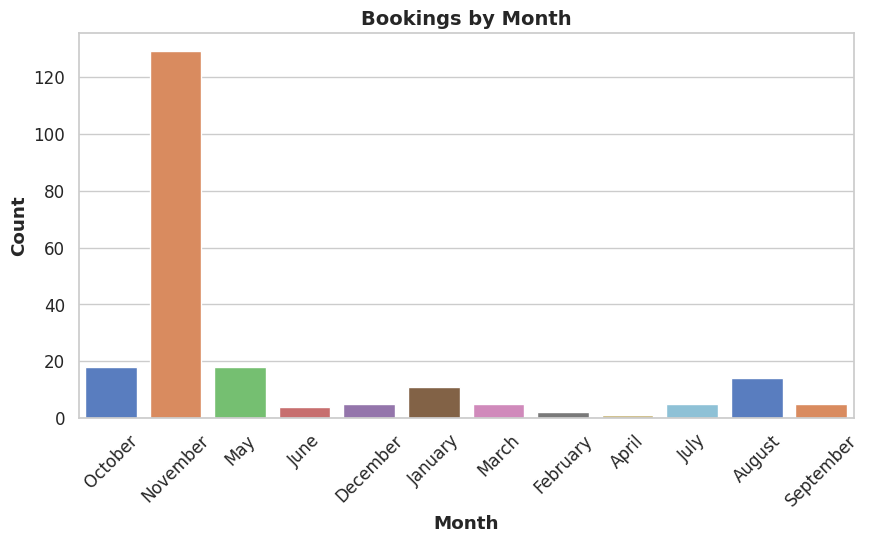

/tmp/ipython-input-264574265.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=country_cancel.index, y=country_cancel.values, palette="crest")


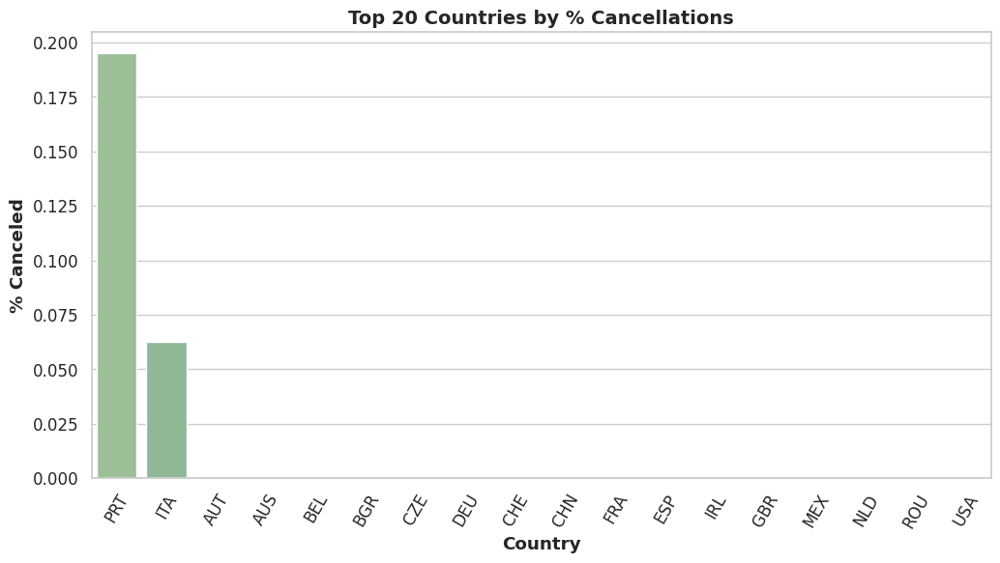

In [38]:
# Set Seaborn style with serif font
sns.set_theme(style="whitegrid", font="Times New Roman", font_scale=1.1)

# Drop undefined or missing values
df_clean = df.replace("Undefined", pd.NA).dropna()

# --- 1. Distribution of Cancellation ---
plt.figure(figsize=(6,4))
sns.countplot(data=df_clean, x="is_canceled", palette="deep")
plt.title("Booking Cancellation Distribution", fontweight="bold", fontsize=14)
plt.xlabel("Is Canceled", fontweight="bold")
plt.ylabel("Count", fontweight="bold")
plt.show()

# --- 2. Lead Time Distribution ---
plt.figure(figsize=(8,4))
sns.histplot(data=df_clean, x="lead_time", bins=30, kde=True, color="steelblue")
plt.title("Lead Time Distribution", fontweight="bold", fontsize=14)
plt.xlabel("Lead Time (days)", fontweight="bold")
plt.ylabel("Frequency", fontweight="bold")
plt.show()

# --- 3. Average Daily Rate (ADR) ---
plt.figure(figsize=(8,4))
sns.histplot(data=df_clean, x="adr", bins=30, kde=True, color="coral")
plt.title("Average Daily Rate Distribution", fontweight="bold", fontsize=14)
plt.xlabel("ADR", fontweight="bold")
plt.ylabel("Frequency", fontweight="bold")
plt.show()

# --- 4. Month-wise Booking Trends ---
plt.figure(figsize=(10,5))
sns.countplot(data=df_clean, x="arrival_date_month", palette="muted")
plt.title("Bookings by Month", fontweight="bold", fontsize=14)
plt.xlabel("Month", fontweight="bold")
plt.ylabel("Count", fontweight="bold")
plt.xticks(rotation=45)
plt.show()

# --- 5. Cancellations by Country ---
plt.figure(figsize=(12,6))
country_cancel = df_clean.groupby("country")["is_canceled"].mean().sort_values(ascending=False).head(20)
sns.barplot(x=country_cancel.index, y=country_cancel.values, palette="crest")
plt.title("Top 20 Countries by % Cancellations", fontweight="bold", fontsize=14)
plt.xlabel("Country", fontweight="bold")
plt.ylabel("% Canceled", fontweight="bold")
plt.xticks(rotation=60)
plt.show()


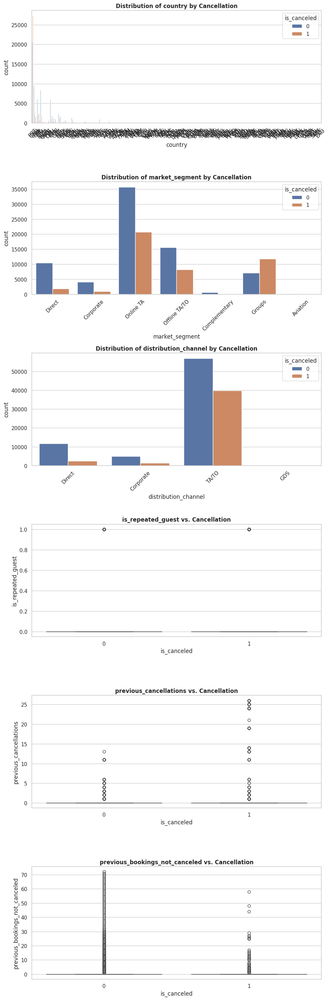

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

cols_to_plot = [
    "country",
    "market_segment",
    "distribution_channel",
    "is_repeated_guest",
    "previous_cancellations",
    "previous_bookings_not_canceled"
]

# Set style
sns.set(style="whitegrid")
fig, axes = plt.subplots(len(cols_to_plot), 1, figsize=(10, 5*len(cols_to_plot)))

for i, col in enumerate(cols_to_plot):
    if df[col].dtype == 'O':  # categorical
        sns.countplot(data=df, x=col, hue="is_canceled", ax=axes[i])
        axes[i].set_title(f"Distribution of {col} by Cancellation")
        axes[i].tick_params(axis='x', rotation=45)
    else:  # numeric
        sns.boxplot(data=df, x="is_canceled", y=col, ax=axes[i])
        axes[i].set_title(f"{col} vs. Cancellation")

plt.tight_layout()
plt.show()


In [128]:
print(df.groupby("country", as_index=False))

In [40]:
import pandas as pd
import plotly.express as px

# --- Step 1: Prepare data ---
country_cancel = df.groupby("country", as_index=False).agg(
    total_bookings=("is_canceled", "count"),
    total_canceled=("is_canceled", "sum")
)
country_cancel["cancel_percent"] = (
    country_cancel["total_canceled"] / country_cancel["total_bookings"] * 100
)

# --- Step 2: Sort and plot ---
country_cancel = country_cancel.sort_values("cancel_percent", ascending=False)

fig = px.bar(
    country_cancel,
    x="country",
    y="cancel_percent",
    color="cancel_percent",              # color gradient based on cancellation %
    color_continuous_scale=["blue", "red"],
    title="Hotel Booking Cancellation % by Country",
    labels={"cancel_percent": "% Cancellations", "country": "Country"}
)

fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()


In [41]:
import plotly.express as px

# Create scatter geo plot for each booking
fig = px.scatter_geo(
    df,
    locations="country",
    locationmode="country names",
    color="is_canceled",
    color_continuous_scale=["blue", "red"],  # blue = not canceled, red = canceled
    opacity=0.5,
    title="Bookings by Country — Blue: Not Canceled, Red: Canceled",
    hover_data={
        "country": True,
        "market_segment": True,
        "distribution_channel": True,
        "is_repeated_guest": True,
        "previous_cancellations": True,
        "previous_bookings_not_canceled": True,
    }
)

# Beautify the map
fig.update_layout(
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type="natural earth",
    ),
    legend_title_text="Cancellation Status",
)

fig.show()


In [42]:
white_lotus_palette = [
    "#E7D8C9",  # sand beige
    "#B3CBB9",  # sage green
    "#84A59D",  # muted turquoise
    "#F28482",  # coral blush
    "#F6BD60"   # warm amber
]


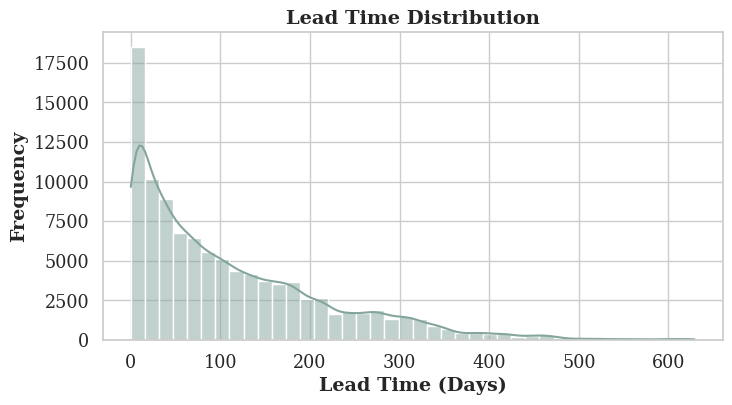

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Use serif font fallback setup
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Times', 'Cambria', 'Georgia']

sns.set_theme(style="whitegrid", font="DejaVu Serif", font_scale=1.15)

white_lotus_palette = ["#E7D8C9", "#B3CBB9", "#84A59D", "#F28482", "#F6BD60"]

# Clean data
df_clean = df.replace("Undefined", pd.NA).dropna(subset=[
    "lead_time", "adr", "total_of_special_requests", "deposit_type", "agent",
    "arrival_date_week_number", "previous_cancellations", "booking_changes"
])

# --- Example Chart ---
plt.figure(figsize=(8,4))
sns.histplot(df_clean["lead_time"], bins=40, kde=True, color="#84A59D")
plt.title("Lead Time Distribution", fontweight="bold", fontsize=14)
plt.xlabel("Lead Time (Days)", fontweight="bold")
plt.ylabel("Frequency", fontweight="bold")
plt.show()


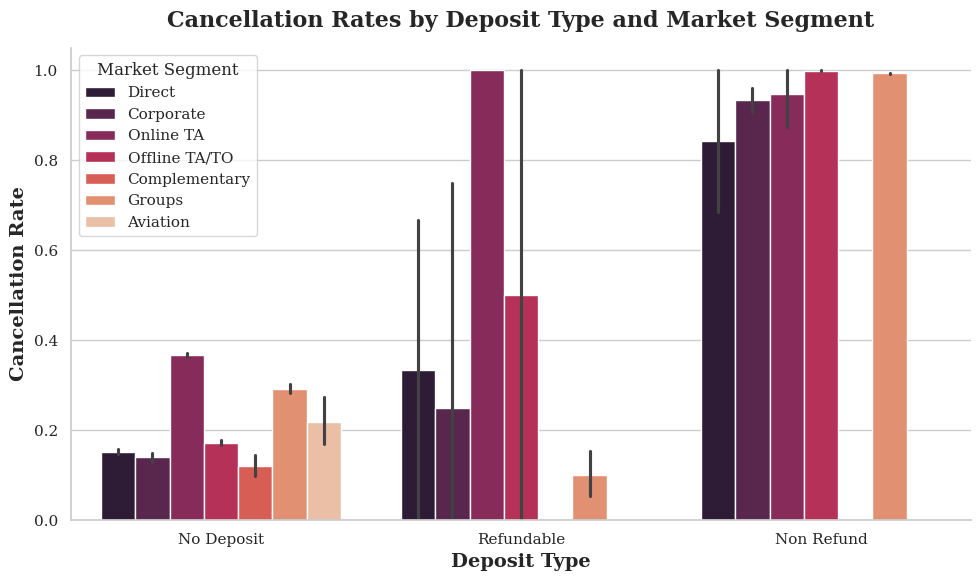

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

# Global aesthetics
sns.set_theme(style="whitegrid")
mpl.rcParams['font.family'] = 'DejaVu Serif'
mpl.rcParams['font.size'] = 13
mpl.rcParams['axes.labelweight'] = 'bold'
mpl.rcParams['axes.titleweight'] = 'bold'

# Create bar plot with 'rocket' palette
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df[df['deposit_type'].notna() & df['market_segment'].notna()],
    x="deposit_type",
    y="is_canceled",
    hue="market_segment",
    palette="rocket"
)

# Titles and labels
plt.title("Cancellation Rates by Deposit Type and Market Segment", fontsize=16, pad=15)
plt.xlabel("Deposit Type", fontsize=14)
plt.ylabel("Cancellation Rate", fontsize=14)
plt.legend(title="Market Segment", frameon=True, fontsize=11, title_fontsize=12)

sns.despine()
plt.tight_layout()
plt.show()


segment_label
Segment A    70160
Segment B    31810
Segment C       94
Name: count, dtype: int64


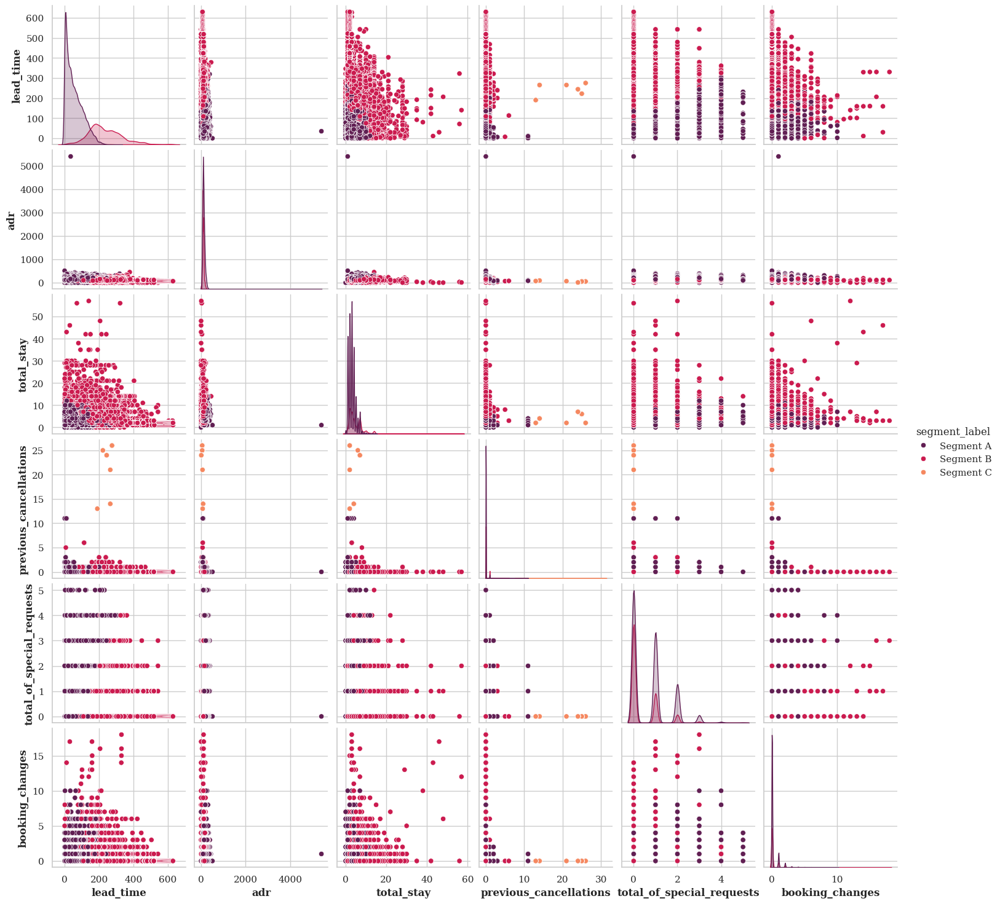

In [47]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Create total_stay column
df_clean['total_stay'] = df_clean['stays_in_weekend_nights'] + df_clean['stays_in_week_nights']

# Select features for segmentation
segment_features = [
    'lead_time', 'adr', 'total_stay',
    'previous_cancellations', 'total_of_special_requests', 'booking_changes'
]

X = df_clean[segment_features].fillna(0)  # handle missing values

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# K-Means clustering (choose k=3 for example: low, medium, high risk/engagement)
kmeans = KMeans(n_clusters=3, random_state=42)
df_clean['segment'] = kmeans.fit_predict(X_scaled)

# Map cluster labels to descriptive names (optional)
cluster_mapping = {0: 'Segment A', 1: 'Segment B', 2: 'Segment C'}
df_clean['segment_label'] = df_clean['segment'].map(cluster_mapping)

# Inspect segment distribution
print(df_clean['segment_label'].value_counts())

# Optional: visualize clusters (pairplot)
import seaborn as sns
sns.pairplot(df_clean, vars=segment_features, hue='segment_label', palette='rocket')


In [54]:
import numpy as np
import pandas as pd

# Copy dataframe
df_seg = df_clean.copy()

# Ensure all columns exist
cols = ['deposit_type', 'country', 'lead_time', 'market_segment', 'total_of_special_requests']

# Convert categorical variables to numeric using Label Encoding or pd.factorize
for col in cols:
    if df_seg[col].dtype == 'object' or df_seg[col].dtype.name == 'category':
        df_seg[col] = pd.factorize(df_seg[col])[0]

# Calculate weighted risk score
df_seg['risk_score'] = (
      0.1449 * df_seg['deposit_type']
    + 0.1353 * df_seg['country']
    + 0.1081 * df_seg['lead_time']
    + 0.0795 * df_seg['market_segment']
    + 0.0782 * df_seg['total_of_special_requests']
)

# Normalize to 0–1 range
df_seg['risk_score'] = (df_seg['risk_score'] - df_seg['risk_score'].min()) / \
                       (df_seg['risk_score'].max() - df_seg['risk_score'].min())


In [55]:
df_seg['value_score'] = df_seg['adr'] * df_seg['total_stay']
df_seg['value_score'] = (df_seg['value_score'] - df_seg['value_score'].min()) / \
                        (df_seg['value_score'].max() - df_seg['value_score'].min())


In [56]:
import numpy as np

df_seg['segment'] = np.select(
    [
        (df_seg['risk_score'] >= 0.5) & (df_seg['value_score'] >= 0.5),
        (df_seg['risk_score'] >= 0.5) & (df_seg['value_score'] < 0.5),
        (df_seg['risk_score'] < 0.5) & (df_seg['value_score'] >= 0.5),
        (df_seg['risk_score'] < 0.5) & (df_seg['value_score'] < 0.5)
    ],
    [
        'High Risk / High Value',
        'High Risk / Low Value',
        'Low Risk / High Value',
        'Low Risk / Low Value'
    ],
    default='Unknown'  # <- set a string default to match dtype
)


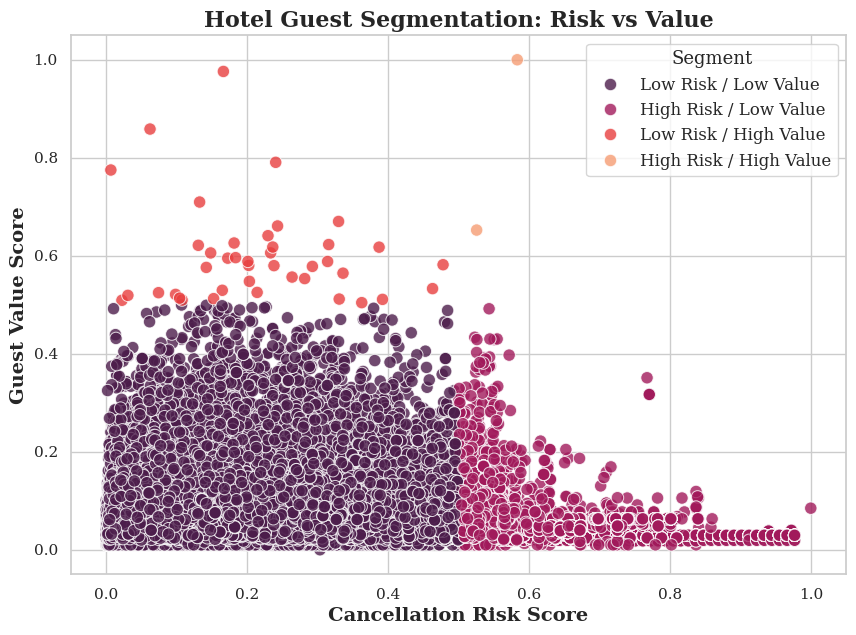

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,7))
sns.scatterplot(
    data=df_seg,
    x='risk_score', y='value_score',
    hue='segment', palette='rocket', s=80, alpha=0.8
)
plt.title("Hotel Guest Segmentation: Risk vs Value", fontsize=16, fontweight='bold')
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Segment", fontsize=12, title_fontsize=13)
plt.show()


Use MLR to determine the weights to be assigned to each of the X variables. This is then used to calculate the cancellation risk.
Similarly, adr is used to calculate the customer value, which in this case refers to the monetary value brought in by the customer to the hotel.

In [65]:


# Load data
df = pd.read_csv('cleaned.csv')

# Copy data
df_seg = df.copy()

# Create total_stay column
df_seg['total_stay'] = df_seg['stays_in_weekend_nights'] + df_seg['stays_in_week_nights']

# Encode deposit_type: Non Refund = 0, others = 1
df_seg['deposit_risk'] = (df_seg['deposit_type'] != 'Non Refund').astype(int)

# Features to include
features = ['deposit_type', 'country', 'lead_time',
            'market_segment', 'total_of_special_requests']

# Convert categorical features to numeric using Label Encoding
for col in features:
    if df_seg[col].dtype == 'object' or df_seg[col].dtype.name == 'category':
        le = LabelEncoder()
        df_seg[col] = le.fit_transform(df_seg[col].astype(str))

# Prepare X and y
X = df_seg[features].fillna(0)
y = df_seg['is_canceled']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit logistic regression
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_scaled, y)

# Extract coefficients
coef = logreg.coef_[0]
for f, c in zip(features, coef):
    print(f"{f}: {c:.3f}")

# Create risk_score using regression coefficients
df_seg['risk_score'] = np.dot(X_scaled, coef)

# Normalize risk_score to [0,1]
df_seg['risk_score'] = (df_seg['risk_score'] - df_seg['risk_score'].min()) / \
                        (df_seg['risk_score'].max() - df_seg['risk_score'].min())


deposit_type: 1.358
country: 0.466
lead_time: 0.415
market_segment: 0.690
total_of_special_requests: -0.469


At this point, we realize that the value score should also incorporate the number of guests such as children, babies, etc. So, we update the formula used for calculation

In [90]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Create value score ---
# Simple proxy: total revenue per booking = ADR * total_stay
df_seg['total_guests'] = df_seg['adults'] + df_seg['children'] + df_seg['babies']

df_seg['value_score'] = df_seg['adr'] * df_seg['total_stay'] * df_seg['total_guests']


# Normalize value_score to [0,1]
df_seg['value_score'] = (df_seg['value_score'] - df_seg['value_score'].min()) / \
                        (df_seg['value_score'].max() - df_seg['value_score'].min())



In [70]:


sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['figure.facecolor'] = '#FAF9F6'
plt.rcParams['axes.facecolor'] = '#FAF9F6'

# Optional: scale dot size by ADR (high-value guests appear larger)
size_scale = 50  # adjust for visibility
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * size_scale + 20  # min size 20



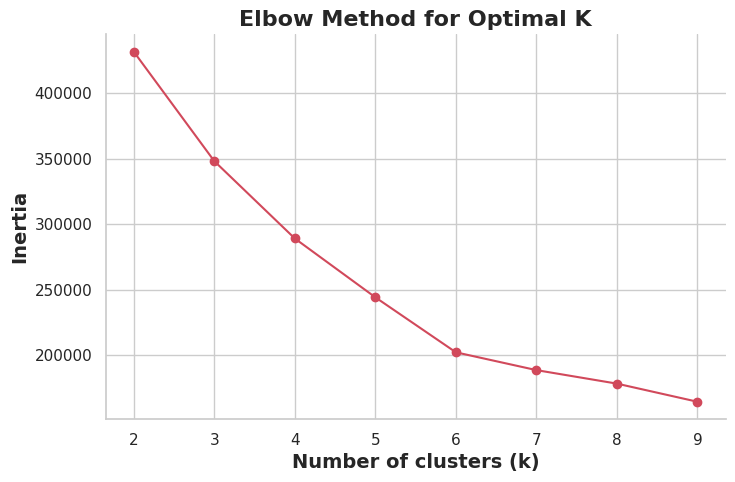

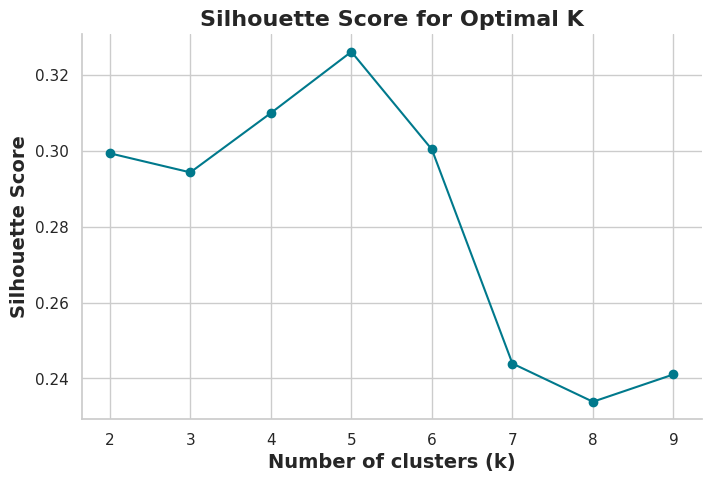

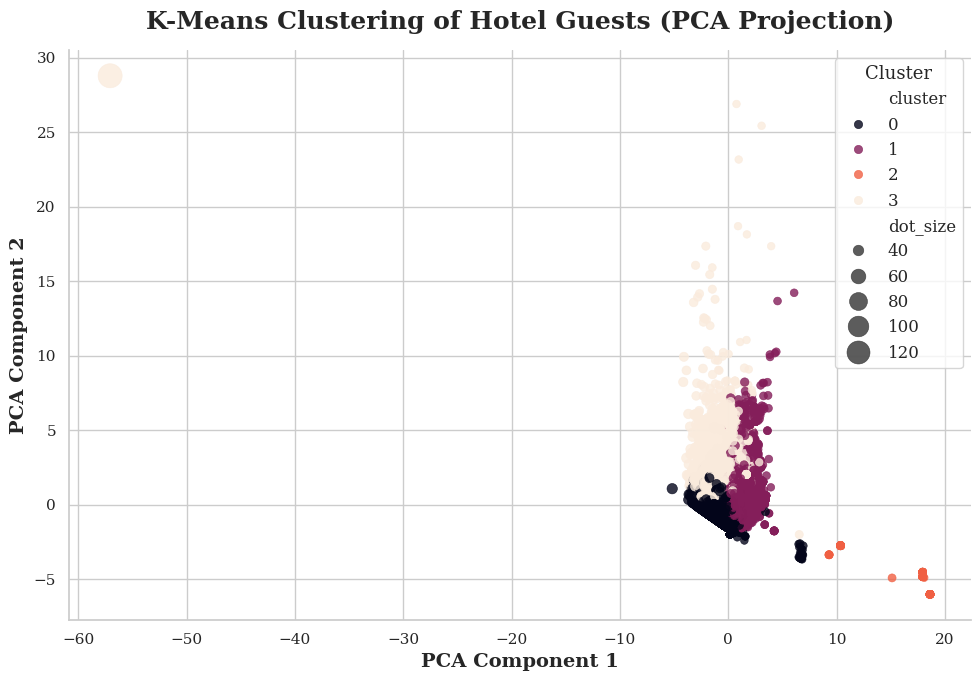

In [72]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Copy and prepare features
df_cluster = df_clean.copy()
df_cluster['total_stay'] = df_cluster['stays_in_weekend_nights'] + df_cluster['stays_in_week_nights']

features = ['lead_time', 'previous_cancellations', 'booking_changes',
            'total_stay', 'adr']  # main predictive features

X = df_cluster[features].fillna(0)

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- Step 1: Determine optimal number of clusters ---
# Elbow Method
inertia = []
K_range = range(2, 10)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
sns.set_theme(style="whitegrid")
plt.plot(K_range, inertia, marker='o', color='#D1495B')
plt.title("Elbow Method for Optimal K", fontsize=16, fontweight='bold')
plt.xlabel("Number of clusters (k)", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
sns.despine()
plt.show()

# Silhouette Score
sil_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    sil_scores.append(silhouette_score(X_scaled, labels))

plt.figure(figsize=(8,5))
plt.plot(K_range, sil_scores, marker='o', color='#00798C')
plt.title("Silhouette Score for Optimal K", fontsize=16, fontweight='bold')
plt.xlabel("Number of clusters (k)", fontsize=14)
plt.ylabel("Silhouette Score", fontsize=14)
sns.despine()
plt.show()

# --- Step 2: Fit K-Means with chosen K ---
optimal_k = 4  # for example, choose from Elbow + Silhouette
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42)
df_cluster['cluster'] = kmeans_final.fit_predict(X_scaled)

# --- Step 3: PCA for 2D Visualization ---
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
df_cluster['pca1'] = X_pca[:,0]
df_cluster['pca2'] = X_pca[:,1]


sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: scale dot size by ADR
df_cluster['dot_size'] = (df_cluster['adr']/df_cluster['adr'].max())*100 + 30

sns.scatterplot(
    data=df_cluster,
    x='pca1', y='pca2',
    hue='cluster',
    palette='rocket',
    size='dot_size',
    sizes=(30, 300),
    alpha=0.8,
    edgecolor=None
)

plt.title("K-Means Clustering of Hotel Guests (PCA Projection)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("PCA Component 1", fontsize=14)
plt.ylabel("PCA Component 2", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


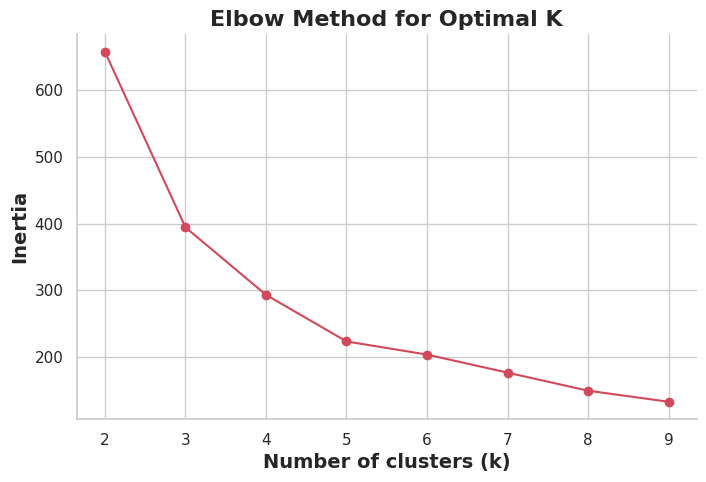

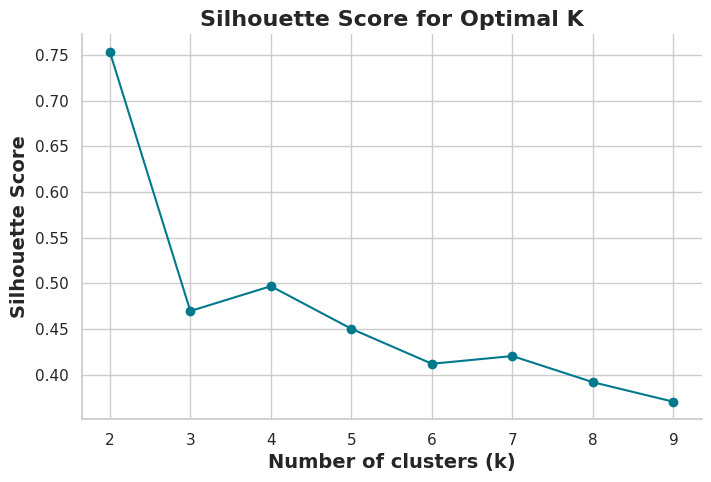

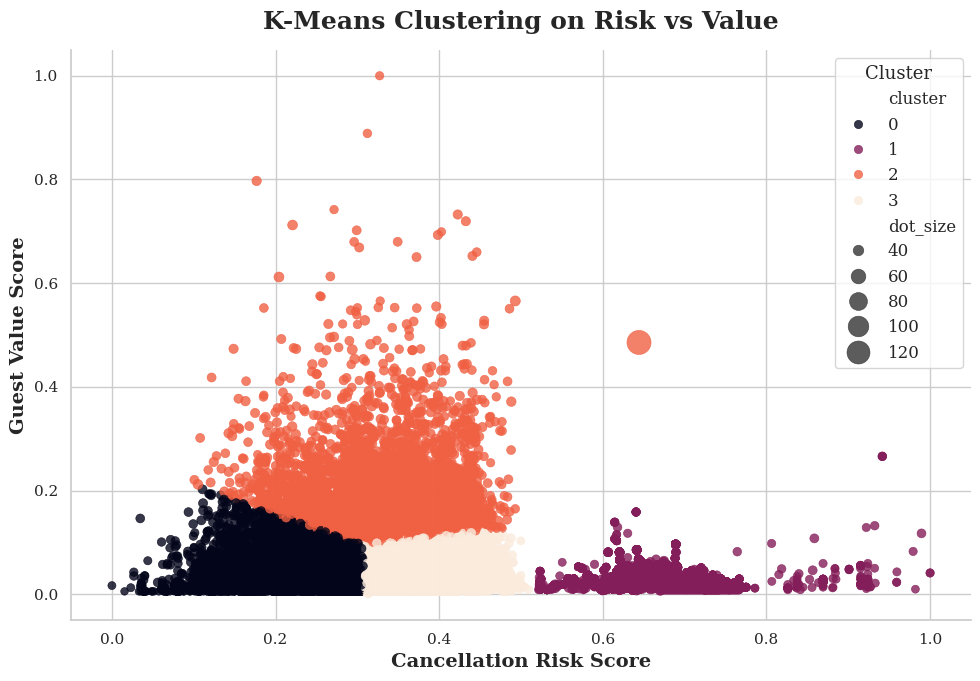

In [127]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Features for clustering
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 1: Determine optimal number of clusters ---
K_range = range(2, 10)
inertia = []
sil_scores = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_risk_value)
    inertia.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(X_risk_value, labels))

# Plot Elbow
plt.figure(figsize=(8,5))
sns.set_theme(style="whitegrid")
plt.plot(K_range, inertia, marker='o', color='#D1495B')
plt.title("Elbow Method for Optimal K", fontsize=16, fontweight='bold')
plt.xlabel("Number of clusters (k)", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
sns.despine()
plt.show()

# Plot Silhouette
plt.figure(figsize=(8,5))
plt.plot(K_range, sil_scores, marker='o', color='#00798C')
plt.title("Silhouette Score for Optimal K", fontsize=16, fontweight='bold')
plt.xlabel("Number of clusters (k)", fontsize=14)
plt.ylabel("Silhouette Score", fontsize=14)
sns.despine()
plt.show()

# --- Step 2: Fit K-Means with chosen K ---
optimal_k = 4  # choose based on elbow + silhouette
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Plot Clusters with White Lotus Aesthetic ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: size by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max())*100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette='rocket',
    size='dot_size',
    sizes=(30, 300),
    alpha=0.8,
    edgecolor=None
)

plt.title("K-Means Clustering on Risk vs Value", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


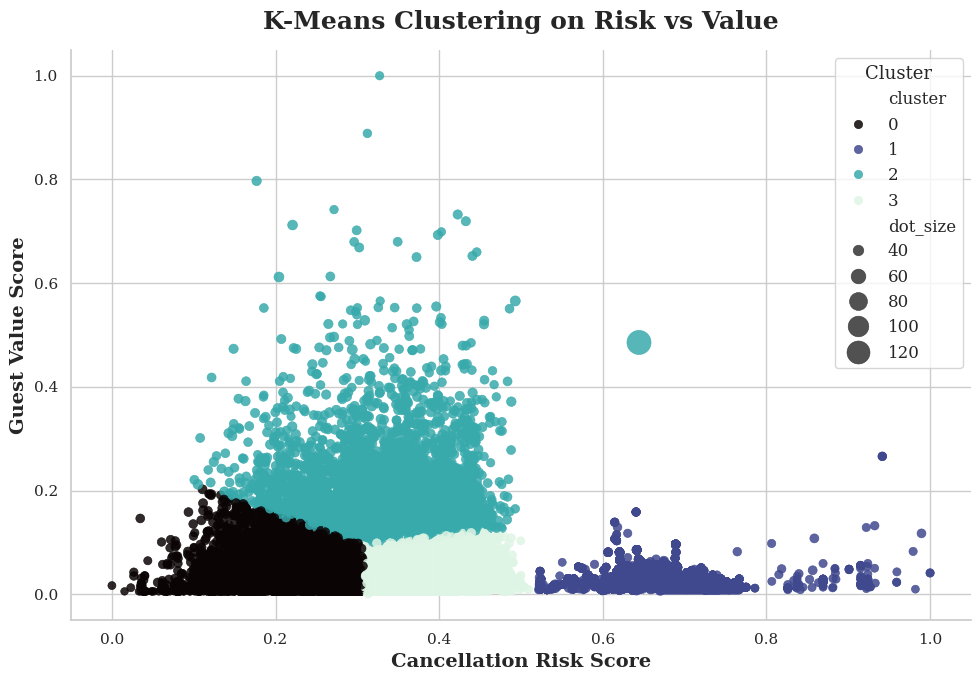

In [129]:
# --- Step 3: Plot Clusters with White Lotus Aesthetic (mako palette) ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: size by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max())*100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette='mako',
    size='dot_size',
    sizes=(30, 300),
    alpha=0.85,
    edgecolor=None
)

plt.title("K-Means Clustering on Risk vs Value", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


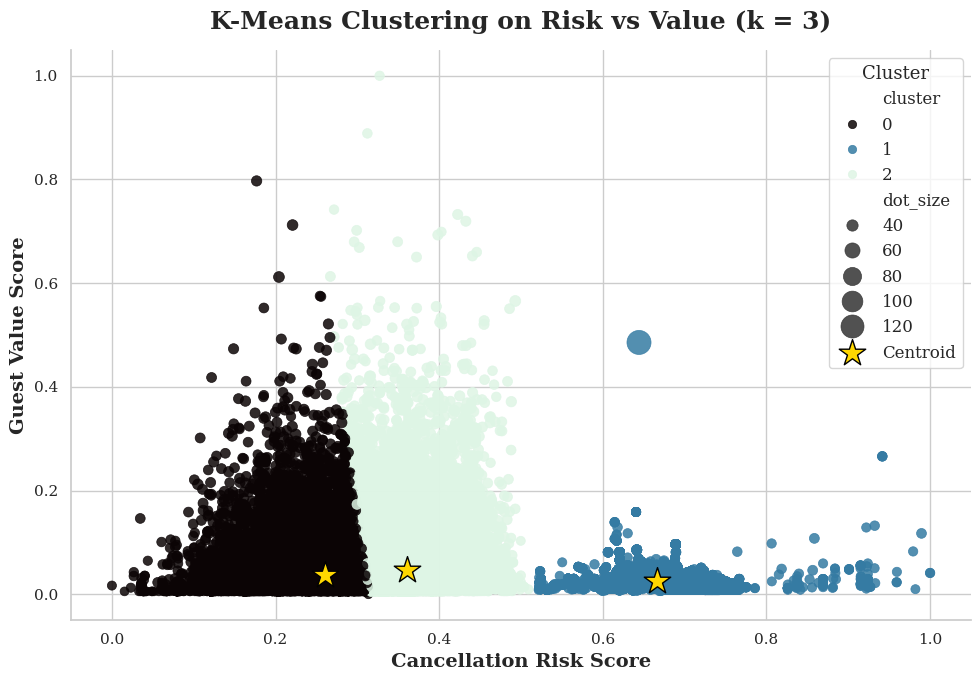

In [130]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- Step 1: Prepare data ---
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 2: Run K-Means with k = 3 (based on silhouette score) ---
kmeans_final = KMeans(n_clusters=3, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Add centroids ---
centroids = kmeans_final.cluster_centers_
centroids_df = pd.DataFrame(centroids, columns=['risk_score', 'value_score'])

# --- Step 4: Plot clusters ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: dot size scaled by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * 100 + 30

# Scatter plot of clusters
sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette='mako',
    size='dot_size',
    sizes=(40, 300),
    alpha=0.85,
    edgecolor=None
)

# Add centroids
plt.scatter(
    centroids_df['risk_score'],
    centroids_df['value_score'],
    s=400,
    c='gold',
    marker='*',
    label='Centroid',
    edgecolor='black'
)

# Titles and labels
plt.title("K-Means Clustering on Risk vs Value (k = 3)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


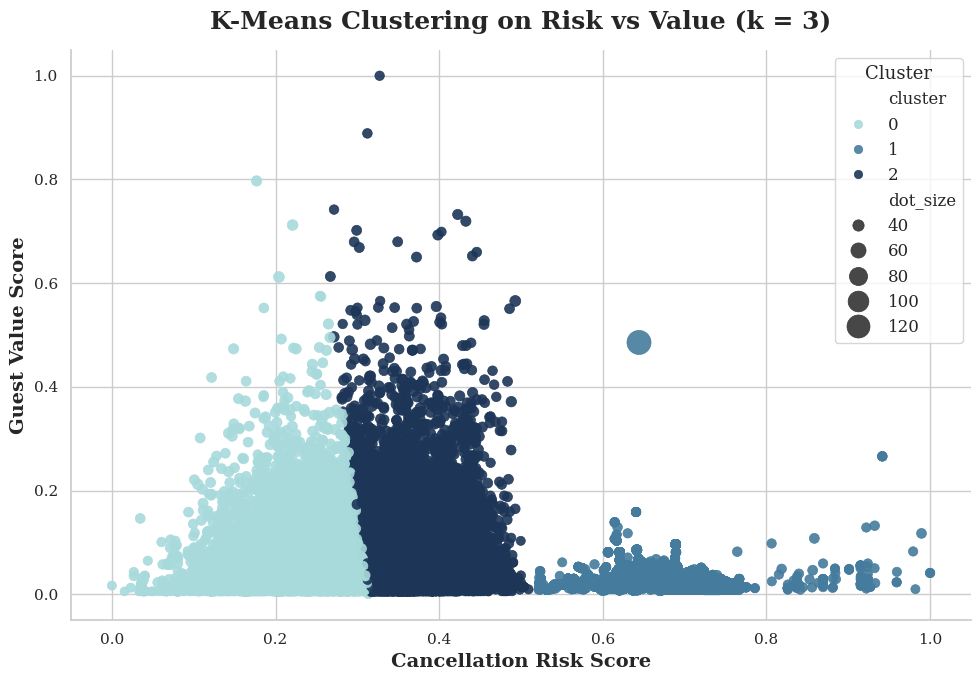

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# --- Step 1: Prepare data ---
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 2: Run K-Means with k = 3 (based on silhouette score) ---
kmeans_final = KMeans(n_clusters=3, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Define custom color palette ---
custom_palette = ['#A8DADC', '#457B9D', '#1D3557']

# --- Step 4: Plot ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: dot size scaled by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * 100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette=custom_palette,
    size='dot_size',
    sizes=(40, 300),
    alpha=0.9,
    edgecolor=None
)

# Titles and labels
plt.title("K-Means Clustering on Risk vs Value (k = 3)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


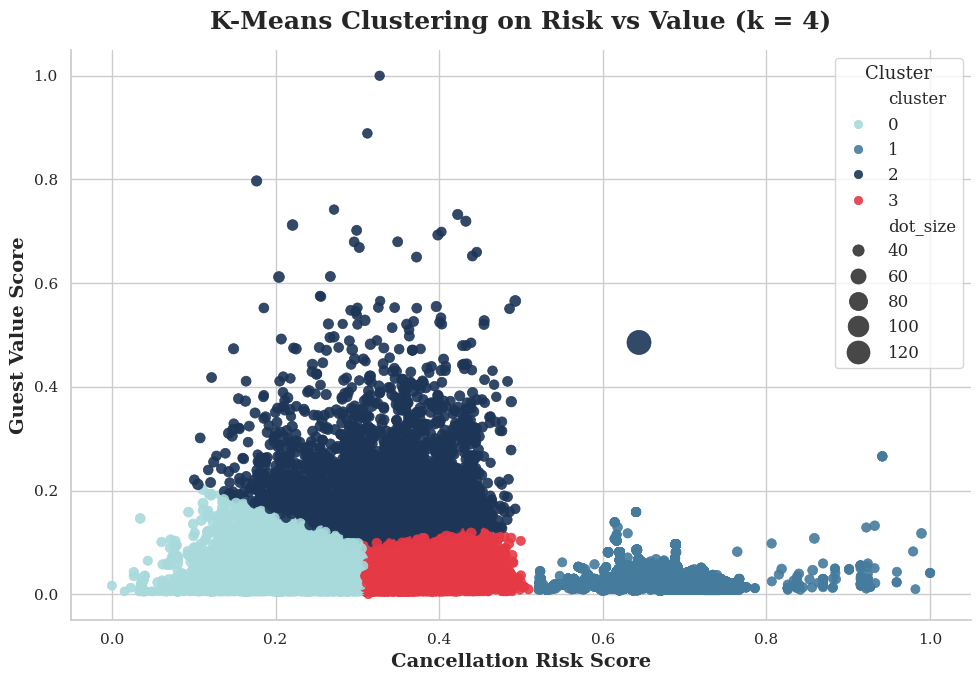

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# --- Step 1: Prepare data ---
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 2: Run K-Means with k = 3 (based on silhouette score) ---
kmeans_final = KMeans(n_clusters=4, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Define custom color palette ---
custom_palette = ['#A8DADC', '#457B9D', '#1D3557', '#e63946']

# --- Step 4: Plot ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: dot size scaled by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * 100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette=custom_palette,
    size='dot_size',
    sizes=(40, 300),
    alpha=0.9,
    edgecolor=None
)

# Titles and labels
plt.title("K-Means Clustering on Risk vs Value (k = 4)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


/tmp/ipython-input-1041273409.py:24: UserWarning:

The palette list has more values (4) than needed (3), which may not be intended.



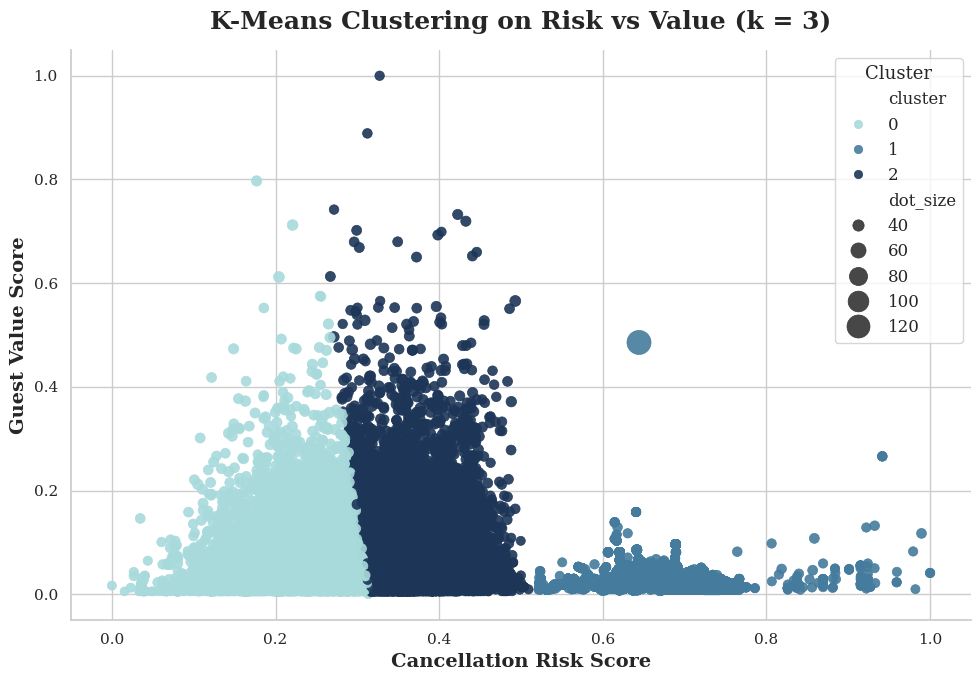

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# --- Step 1: Prepare data ---
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 2: Run K-Means with k = 3 (based on silhouette score) ---
kmeans_final = KMeans(n_clusters=3, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Define custom color palette ---
custom_palette = ['#A8DADC', '#457B9D', '#1D3557', '#e63946']

# --- Step 4: Plot ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: dot size scaled by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * 100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette=custom_palette,
    size='dot_size',
    sizes=(40, 300),
    alpha=0.9,
    edgecolor=None
)

# Titles and labels
plt.title("K-Means Clustering on Risk vs Value (k = 3)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


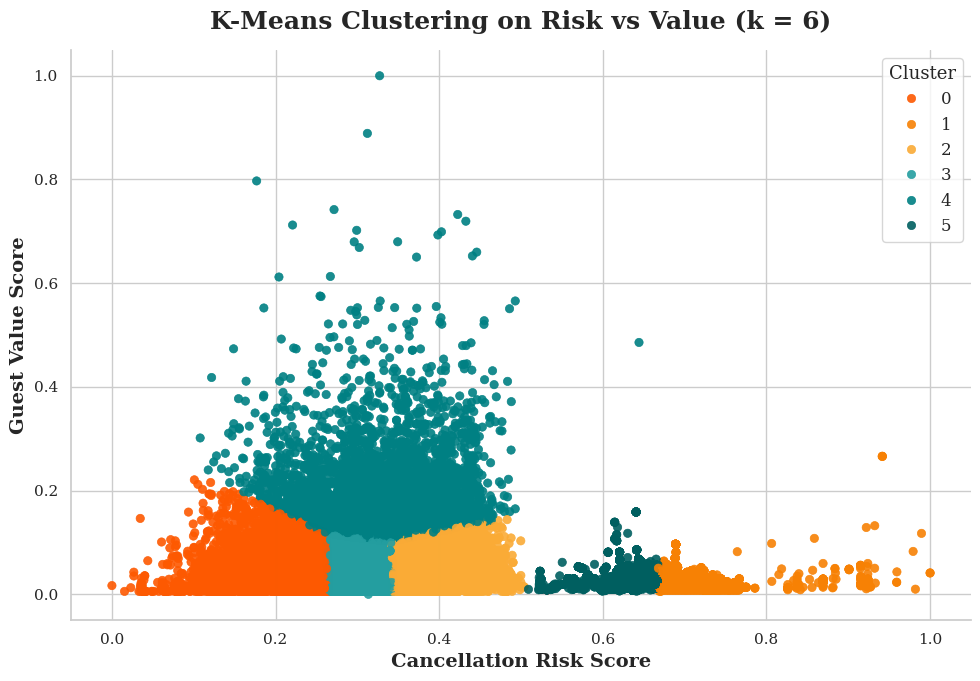

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# --- Step 1: Prepare data ---
X_risk_value = df_seg[['risk_score', 'value_score']].values

# --- Step 2: Run K-Means with k = 3 (based on silhouette score) ---
kmeans_final = KMeans(n_clusters=6, random_state=42)
df_seg['cluster'] = kmeans_final.fit_predict(X_risk_value)

# --- Step 3: Define custom color palette ---
custom_palette = ['#fd5901', '#f78104', '#faab36', '#249ea0', '#008083', '#005f60']

# --- Step 4: Plot ---
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['font.size'] = 13
plt.figure(figsize=(10,7))

# Optional: dot size scaled by ADR
df_seg['dot_size'] = (df_seg['adr'] / df_seg['adr'].max()) * 100 + 30

sns.scatterplot(
    data=df_seg,
    x='risk_score',
    y='value_score',
    hue='cluster',
    palette=custom_palette,

    sizes=(40, 300),
    alpha=0.9,
    edgecolor=None
)

# Titles and labels
plt.title("K-Means Clustering on Risk vs Value (k = 6)", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Cancellation Risk Score", fontsize=14)
plt.ylabel("Guest Value Score", fontsize=14)
plt.legend(title="Cluster", fontsize=12, title_fontsize=13, frameon=True)
sns.despine()
plt.tight_layout()
plt.show()


First few rows of the dataset:

          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  children  babies  \
0                        0                     0      

/tmp/ipython-input-3874081892.py:29: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




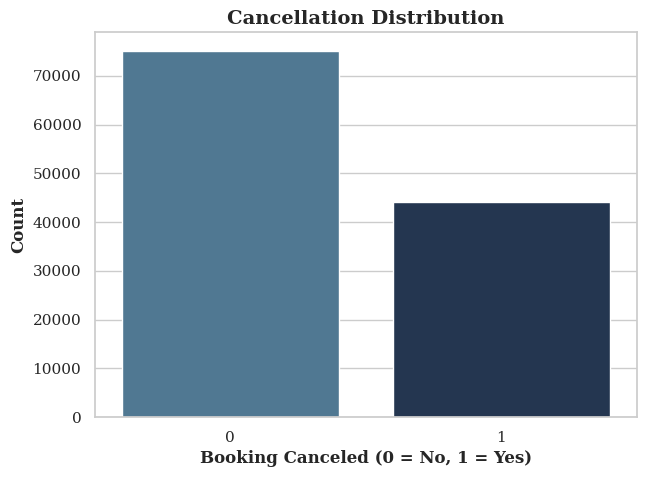

In [135]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Use a serif font for consistency
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12


df_clean = pd.read_csv("hotel_booking.csv")

print("First few rows of the dataset:\n")
print(df_clean.head(), "\n")

print("Column names:\n")
print(df_clean.columns, "\n")

if 'is_canceled' in df_clean.columns:
    print("Cancellation distribution:\n")
    print(df_clean['is_canceled'].value_counts())
    print("\nProportion:\n")
    print(df_clean['is_canceled'].value_counts(normalize=True))
else:
    print("⚠️ Column 'is_canceled' not found. Please check your dataset columns.")


plt.figure(figsize=(7,5))
sns.countplot(x='is_canceled', data=df_clean, palette=['#457b9d', '#1d3557'])
plt.title('Cancellation Distribution')
plt.xlabel('Booking Canceled (0 = No, 1 = Yes)')
plt.ylabel('Count')
plt.show()


Trying out the segmentation and clustering by modifying the formula for customer value by dividing the product of adr and days stayed by the number of guests (so, value per person) instead.

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'name', 'email',
       'phone-number', 'credit_card'],
      dtype='object')


/tmp/ipython-input-3908091031.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




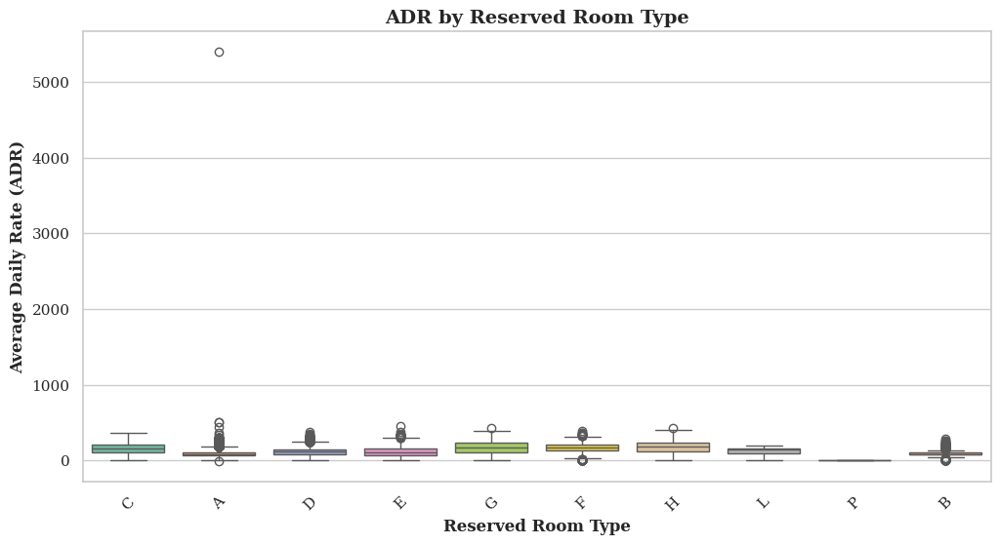

/tmp/ipython-input-3908091031.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




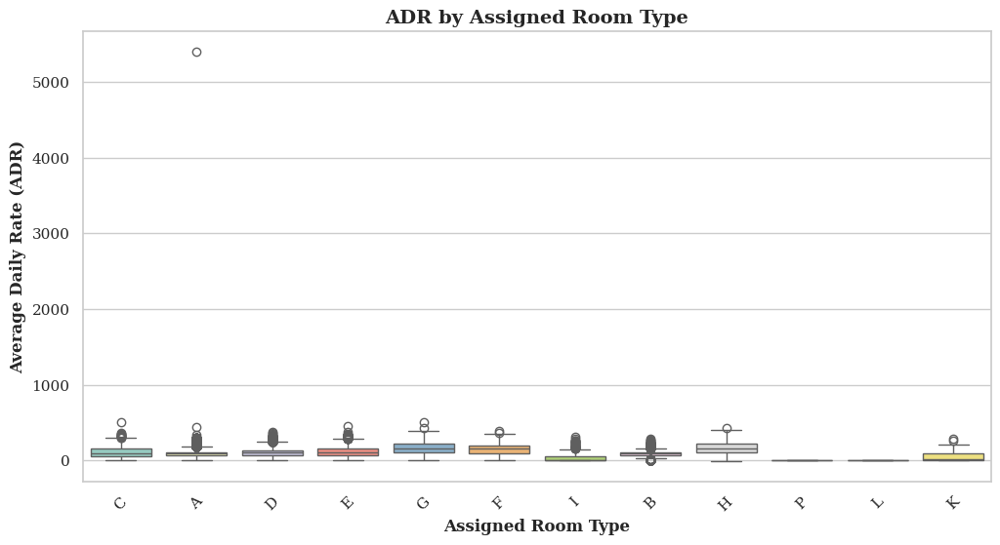


Summary of ADR by Reserved Room Type:
                       count    mean    std   min     25%     50%     75%  \
reserved_room_type                                                         
A                   85994.0   90.80  41.76 -6.38   65.00   89.00  112.00   
B                    1118.0   90.36  34.53  0.00   77.25   87.00  103.05   
C                     932.0  160.22  71.52  0.00  108.51  163.00  212.55   
D                   19201.0  120.68  48.01  0.00   85.40  120.70  150.30   
E                    6535.0  124.54  59.94  0.00   77.00  114.75  166.25   
F                    2897.0  167.69  63.58  0.00  133.00  177.00  208.56   
G                    2094.0  176.00  79.52  0.00  115.00  175.35  235.99   
H                     601.0  188.22  75.89  0.00  126.50  184.00  241.00   
L                       6.0  124.67  69.45  8.00   95.50  143.00  166.50   
P                      12.0    0.00   0.00  0.00    0.00    0.00    0.00   

                        max  
reserved_room_typ

In [136]:

# Load data
df = pd.read_csv("hotel_booking.csv")

# Check column names just to be sure
print(df.columns)

# Inspect ADR by reserved room type
plt.figure(figsize=(12, 6))
sns.boxplot(x='reserved_room_type', y='adr', data=df, palette='Set2')
plt.title('ADR by Reserved Room Type')
plt.xlabel('Reserved Room Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.xticks(rotation=45)
plt.show()

# Inspect ADR by assigned room type
plt.figure(figsize=(12, 6))
sns.boxplot(x='assigned_room_type', y='adr', data=df, palette='Set3')
plt.title('ADR by Assigned Room Type')
plt.xlabel('Assigned Room Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.xticks(rotation=45)
plt.show()

# Optional: compute summary stats
adr_summary = df.groupby('reserved_room_type')['adr'].describe().round(2)
print("\nSummary of ADR by Reserved Room Type:\n", adr_summary)

adr_assigned_summary = df.groupby('assigned_room_type')['adr'].describe().round(2)
print("\nSummary of ADR by Assigned Room Type:\n", adr_assigned_summary)